# NIDRA Statistical Analysis

In [1]:
import mne
import math
import numpy as np
import pandas as pd
import seaborn as sns
import pingouin as pg
import matplotlib.pyplot as plt 
import matplotlib.patches as mpatches
import os 
from matplotlib.colors import Normalize
import scipy
import yasa
import statsmodels.api as sm
mne.set_log_level('ERROR')

stats_path = '/media/administrator/Sleep_Data/Processed/Statistics/'

In [2]:
## Additional Helper Functions
def plot_mode_condition(data, dv, ax, title):
    # Plot paired data 
    pg.plot_paired(data=data,
                   dv=dv,
                   #within='Stim',
                   subject='Subject',
                   ax=ax,
                   #boxplot=False,
                   boxplot_in_front=False, 
                   )
    
    # Set titles and labels
    ax.set_title(title, fontsize=18)
    ax.set_xlabel('')
    ax.set_ylabel(f'{dv}', fontsize=15)
    ax.tick_params(axis='x', labelsize=15)
    plt.tight_layout()
    
def drop_bads_df(df, subject_nights=[('ChrSt', 1), ('UyDe', 1), ('IsEb', 2)]):
    from functools import reduce
    import operator
    # Ensure the night numbers are of the same type as in the DataFrame
    # If Night is a string in the DataFrame, convert the night numbers to strings
    subject_nights = [(subj, str(night)) if isinstance(df['Night'].iloc[0], str) else (subj, night) for subj, night in subject_nights]
    
    # Create masks for each condition to drop
    masks = [((df['Subject'] == subj) & (df['Night'] == night)) for subj, night in subject_nights]
    
    # Combine the individual masks with a logical OR
    if masks:
        combined_mask = reduce(operator.or_, masks)
    else:
        combined_mask = pd.Series([False] * len(df))
    
    # Apply the mask to filter out the rows
    df = df[~combined_mask]
    return df

def topoplot(
    data,
    montage="standard_1020",
    vmin=None,
    vmax=None,
    mask=None,
    title=None,
    cmap=None,
    n_colors=100,
    cbar_title=None,
    cbar_ticks=None,
    show_cbar=True,
    figsize=(6, 6),
    dpi=80,
    fontsize=14,
    axes=None,
    **kwargs,
):
    """
    Topoplot.

    This is a wrapper around :py:func:`mne.viz.plot_topomap`.

    For more details, please refer to this `example notebook
    <https://github.com/raphaelvallat/yasa/blob/master/notebooks/15_topoplot.ipynb>`_.

    .. versionadded:: 0.4.1

    Parameters
    ----------
    data : :py:class:`pandas.Series`
        A pandas Series with the values to plot. The index MUST be the channel
        names (e.g. ['C4', 'F4'] or ['C4-M1', 'C3-M2']).
    montage : str
        The name of the montage to use. Valid montages can be found at
        :py:func:`mne.channels.make_standard_montage`.
    vmin, vmax : float
        The minimum and maximum values of the colormap. If None, these will be
        defined based on the min / max values of ``data``.
    mask : :py:class:`pandas.Series`
        A pandas Series indicating the significant electrodes. The index MUST
        be the channel names (e.g. ['C4', 'F4'] or ['C4-M1', 'C3-M2']).
    title : str
        The plot title.
    cmap : str
        A matplotlib color palette. A list of color palette can be found at:
        https://seaborn.pydata.org/tutorial/color_palettes.html
    n_colors : int
        The number of colors to discretize the color palette.
    cbar_title : str
        The title of the colorbar.
    cbar_ticks : list
        The ticks of the colorbar.
    figsize : tuple
       Width, height in inches.
    dpi : int
        The resolution of the plot.
    fontsize : int
        Global font size of all the elements of the plot.
    **kwargs : dict
        Other arguments that are passed to :py:func:`mne.viz.plot_topomap`.

    Returns
    -------
    fig : :py:class:`matplotlib.figure.Figure`
        Matplotlib Figure

    Examples
    --------

    1. Plot all-positive values

    .. plot::

        >>> import yasa
        >>> import pandas as pd
        >>> data = pd.Series([4, 8, 7, 1, 2, 3, 5],
        ...                  index=['F4', 'F3', 'C4', 'C3', 'P3', 'P4', 'Oz'],
        ...                  name='Values')
        >>> fig = yasa.topoplot(data, title='My first topoplot')

    2. Plot correlation coefficients (values ranging from -1 to 1)

    .. plot::

        >>> import yasa
        >>> import pandas as pd
        >>> data = pd.Series([-0.5, -0.7, -0.3, 0.1, 0.15, 0.3, 0.55],
        ...                  index=['F3', 'Fz', 'F4', 'C3', 'Cz', 'C4', 'Pz'])
        >>> fig = yasa.topoplot(data, vmin=-1, vmax=1, n_colors=8,
        ...                     cbar_title="Pearson correlation")
    """
    from matplotlib.colors import ListedColormap
    
    # Increase font size while preserving original
    old_fontsize = plt.rcParams["font.size"]
    plt.rcParams.update({"font.size": fontsize})
    plt.rcParams.update({"savefig.bbox": "tight"})
    plt.rcParams.update({"savefig.transparent": "True"})

    # Make sure we don't do any in-place modification
    assert isinstance(data, pd.Series), "Data must be a Pandas Series"
    data = data.copy()

    # Add mask, if present
    if mask is not None:
        assert isinstance(mask, pd.Series), "mask must be a Pandas Series"
        assert mask.dtype.kind in "bi", "mask must be True/False or 0/1."
    else:
        mask = pd.Series(1, index=data.index, name="mask")

    # Convert to a dataframe (col1 = values, col2 = mask)
    data = data.to_frame().join(mask, how="left")

    # Preprocess channel names: C4-M1 --> C4
    data.index = data.index.str.split("-").str.get(0)

    # Define electrodes coordinates
    Info = mne.create_info(data.index.tolist(), sfreq=100, ch_types="eeg")
    Info.set_montage(montage, match_case=False, on_missing="ignore")
    chan = Info.ch_names

    # Define vmin and vmax
    if vmin is None:
        vmin = data.iloc[:, 0].min()
    if vmax is None:
        vmax = data.iloc[:, 0].max()

    # Choose and discretize colormap
    if cmap is None:
        if vmin < 0 and vmax <= 0:
            cmap = "mako"
        elif vmin < 0 and vmax > 0:
            cmap = "Spectral_r"
        elif vmin >= 0 and vmax > 0:
            cmap = "rocket_r"

    cmap = ListedColormap(sns.color_palette(cmap, n_colors).as_hex())

    if "sensors" not in kwargs:
        kwargs["sensors"] = True
    if "res" not in kwargs:
        kwargs["res"] = 256
    if "names" not in kwargs:
        kwargs["names"] = chan   
    if "mask_params" not in kwargs:
        kwargs["mask_params"] = dict(marker=None)

    # Hidden feature: if names='values', show the actual values.
    if kwargs["names"] == "values":
        kwargs["names"] = data.iloc[:, 0][chan].round(2).to_numpy()

    # Start the plot
    with sns.axes_style("white"):
        if axes is None:
            fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
        else:
            fig = plt.gcf()
            ax = axes
        # Plot topomap
        im, _ = mne.viz.plot_topomap(
            data=data.iloc[:, 0][chan],
            pos=Info,
            vlim=(vmin, vmax), 
            mask=data.iloc[:, 1][chan],
            cmap=cmap,
            show=False,
            axes=ax,
            **kwargs,
            
        )

        if title is not None:
            ax.set_title(title)

        # Add colorbar
        if cbar_title is None:
            cbar_title = data.iloc[:, 0].name

        if show_cbar == True:
            cbar = fig.colorbar(ax.images[-1], ax=ax, orientation="vertical",
                            ticks=None, fraction=0.05)
            cbar.set_label(cbar_title)

            #cax = fig.add_axes([0.95, 0.3, 0.02, 0.5])
            #cbar = fig.colorbar(im, cax=cax, ticks=cbar_ticks, fraction=0.5)
            #cbar.set_label(cbar_title)

        # Revert font-size
        plt.rcParams.update({"font.size": old_fontsize})
        
    return fig

## 1. Sleep Stimulation Analysis

### A. Phase targeting 

In [3]:
## Phase analysis functions
def phase_targeting_plot(df):        
    # Create a figure with 2 rows and 4 columns transposed from previous arrangement
    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 10), subplot_kw={'aspect': 'equal'})  # Ensure equal aspect ratio
    axes = axes.flatten()  # Flatten the array of axes for easier iteration
    
    # Iterate over each unique combination and plot
    for i, ((mode, stim, chan), group) in enumerate(df.groupby(['Mode','Stim','Target_Chan'])):
        if i < 8:  # Ensure we do not try to plot more than 8 plots
            pg.plot_circmean(group['CircMean'], square=True, ax=axes[i], 
                             kwargs_markers={'color': 'tab:blue', 'marker': 'o', 'mfc': 'none', 'ms': 10}, 
                             kwargs_arrow={'width': 0.01, 'head_width': 0.1, 'head_length': 0.1, 'fc': 'tab:red', 'ec': 'tab:red'})
            # Update title formatting here
            title = f"{mode.upper()} {stim.capitalize()} ({chan})"
            axes[i].set_title(title, pad=30)  # Increase padding to ensure title is not too close to the plot
                       
    plt.show()
    
def phase_targeting_stats(df):
    # Initialize an empty list to store the results
    results = []
    # Iterate over each unique combination and plot
    for i, ((mode, stim, chan), group) in enumerate(df.groupby(['Mode', 'Stim', 'Target_Chan'])):
        #print(chan, mode, stim)
        circmean = pg.circ_mean(group['CircMean'])
        #print(f"Circular mean: {circmean.round(3)}")
        circstd = scipy.stats.circstd(group['CircMean'])
        #print(f"Circular STD: {circstd.round(3)}")
        mean_rvl = pg.circ_r(group['CircMean'])
        #print(f"Mean RVL: {mean_rvl.round(3)}")
        #print(f"Mean RVL: {group['RVL'].mean().round(3)}")
        z, pval = pg.circ_rayleigh(group['CircMean'])
        #print(f'The Rayleigh Z-statistic for non-uniformity of circular data: {z.round(4)} with a p-value : {pval.round(4)}')
        # V-test for non-uniformity of circular data with a specified mean direction
        V, pvalv = pg.circ_vtest(group['CircMean'], dir=0)
        #print(f'The V-statistic for non-uniformity of circular data: {V.round(4)} with a p-value : {pvalv.round(4)}')
           
        # Append results to the list
        results.append({
            'Channel': chan,
            'Mode': mode,
            'Stimulation': stim,
            'Circular Mean': math.degrees(circmean), # Convert to degrees
            'Circular STD':  math.degrees(circstd), # Convert to degrees
            'Mean RVL': mean_rvl,
            'Rayleigh Z': z,
            'Rayleigh p-value': '< 0.001' if pval < 0.001 else pval,
            'V Statistic': V,
            'V p-value': '< 0.001' if pvalv < 0.001 else pvalv
        })

    # Convert results list to DataFrame
    results_df = pd.DataFrame(results)
    
    return results_df

In [4]:
## Load phase data
df_phase = pd.read_csv(os.path.join(stats_path, 'df_phase.csv'), index_col=0)
df_phase = drop_bads_df(df_phase)

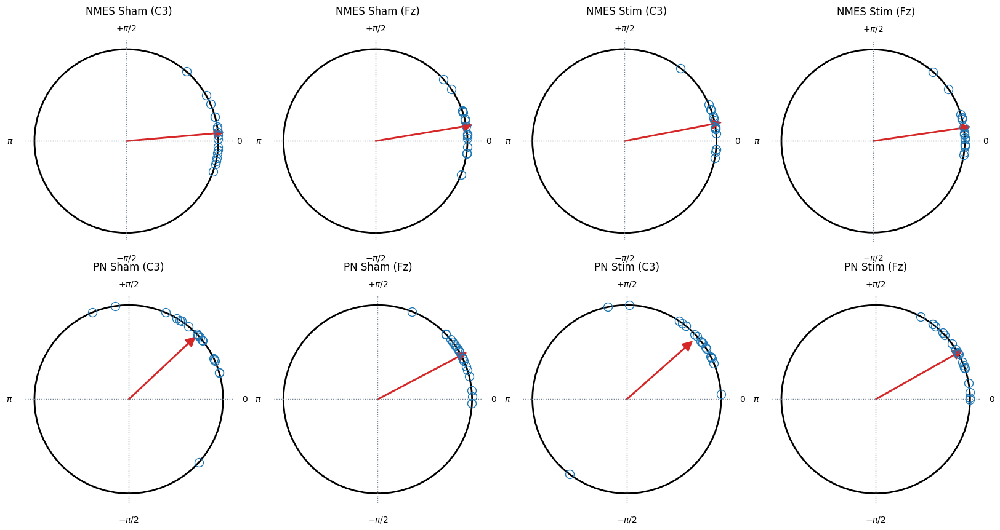

In [5]:
# Plot
phase_plot = phase_targeting_plot(df_phase)

In [6]:
# Stats
phase_stats = phase_targeting_stats(df_phase)
phase_stats.round(2)

,Channel,Mode,Stimulation,Circular Mean,Circular STD,Mean RVL,Rayleigh Z,Rayleigh p-value,V Statistic,V p-value
0,C3,nmes,sham,4.96,17.24,0.96,15.53,< 0.001,16.19,< 0.001
1,Fz,nmes,sham,9.43,15.29,0.96,15.83,< 0.001,16.18,< 0.001
2,C3,nmes,stim,10.91,14.36,0.97,15.96,< 0.001,16.18,< 0.001
3,Fz,nmes,stim,8.37,14.44,0.97,15.95,< 0.001,16.29,< 0.001
4,C3,pn,sham,43.21,30.79,0.87,14.23,< 0.001,11.99,< 0.001
5,Fz,pn,sham,27.84,16.20,0.96,17.54,< 0.001,16.14,< 0.001
6,C3,pn,stim,41.51,35.33,0.83,12.99,< 0.001,11.76,< 0.001
7,Fz,pn,stim,29.49,17.91,0.95,17.23,< 0.001,15.75,< 0.001


### B. Evoked Potentials

In [7]:
## ERP analysis functions
def plot_gavs(df_evoked):
    # Make copy of the DataFrame
    df_evoked_ = df_evoked.copy() 

    # Extract grand averages for pinknoise stimulation
    gav_pn_sham_c3 = mne.grand_average(list(df_evoked_.loc['pn'].Evoked_sham_c3)).crop(tmin=-1, tmax=1.5)
    gav_pn_stim_c3  = mne.grand_average(list(df_evoked_.loc['pn'].Evoked_stim_c3)).crop(tmin=-1, tmax=1.5)
    gav_pn_sham_fz = mne.grand_average(list(df_evoked_.loc['pn'].Evoked_sham_fz)).crop(tmin=-1, tmax=1.5)
    gav_pn_stim_fz  = mne.grand_average(list(df_evoked_.loc['pn'].Evoked_stim_fz)).crop(tmin=-1, tmax=1.5)

    # Extract grand averages for nmes stimulation
    gav_nmes_sham_c3 = mne.grand_average(list(df_evoked_.loc['nmes'].Evoked_sham_c3)).crop(tmin=-1, tmax=1.5)
    gav_nmes_stim_c3  = mne.grand_average(list(df_evoked_.loc['nmes'].Evoked_stim_c3)).crop(tmin=-1, tmax=1.5)
    gav_nmes_sham_fz = mne.grand_average(list(df_evoked_.loc['nmes'].Evoked_sham_fz)).crop(tmin=-1, tmax=1.5)
    gav_nmes_stim_fz  = mne.grand_average(list(df_evoked_.loc['nmes'].Evoked_stim_fz)).crop(tmin=-1, tmax=1.5)

    # Plotting pararameters
    times = np.asarray([-0.5, 0.0, 0.25, 0.5, 0.75, 1])
    ts_args = dict(spatial_colors = True, gfp=True, time_unit='s')
    topomap_args = dict(outlines = 'head', time_unit='s', time_format = "%0.2f s")

    # Plot grand averages for pinknoise stimulation
    p1 = gav_pn_sham_c3.plot_joint(title='Pinknoise sham C3', times=times, ts_args=ts_args, topomap_args=topomap_args)
    p2 = gav_pn_stim_c3.plot_joint(title='Pinknoise stim C3', times=times, ts_args=ts_args, topomap_args=topomap_args)
    p3 = gav_pn_sham_fz.plot_joint(title='Pinknoise sham Fz', times=times, ts_args=ts_args, topomap_args=topomap_args)
    p4 = gav_pn_stim_fz.plot_joint(title='Pinknoise stim Fz', times=times, ts_args=ts_args, topomap_args=topomap_args)

    # Plot grand averages for nmes stimulation
    p5 = gav_nmes_sham_c3.plot_joint(title='NMES sham C3', times=times, ts_args=ts_args, topomap_args=topomap_args)
    p6 = gav_nmes_stim_c3.plot_joint(title='NMES stim C3', times=times, ts_args=ts_args, topomap_args=topomap_args)
    p7 = gav_nmes_sham_fz.plot_joint(title='NMES sham Fz', times=times, ts_args=ts_args, topomap_args=topomap_args)
    p8 = gav_nmes_stim_fz.plot_joint(title='NMES stim Fz', times=times, ts_args=ts_args, topomap_args=topomap_args)   

def plot_gavs_contrasts(df_evoked):
    # Make copy of the DataFrame
    df_evoked_ = df_evoked.copy() 

    # Extract grand averages for pinknoise stimulation
    gav_pn_c3 = mne.grand_average(list(df_evoked_.loc['pn'].Contrast_c3)).crop(tmin=0, tmax=1.5)
    gav_pn_fz = mne.grand_average(list(df_evoked_.loc['pn'].Contrast_fz)).crop(tmin=0, tmax=1.5)

    # Extract grand averages for nmes stimulation
    gav_nmes_c3 = mne.grand_average(list(df_evoked_.loc['nmes'].Contrast_c3)).crop(tmin=0, tmax=1.5)
    gav_nmes_fz = mne.grand_average(list(df_evoked_.loc['nmes'].Contrast_fz)).crop(tmin=0, tmax=1.5)

    # Plotting pararameters
    times_pn = np.asarray([0.29, 0.35, 0.6, 0.9])
    times_nmes = np.asarray([0.08, 0.18, 0.37, 0.9])
    ts_args = dict(spatial_colors = True, gfp=True, time_unit='s')
    topomap_args = dict(outlines = 'head', time_unit='s', time_format = "%0.2f s")

    # Plot grand averages for pinknoise stimulation
    p1 = gav_pn_c3.plot_joint(title='Pinknoise C3 contrast', times=times_pn, ts_args=ts_args, topomap_args=topomap_args)
    p2 = gav_pn_fz.plot_joint(title='Pinknoise Fz contrast', times=times_pn, ts_args=ts_args, topomap_args=topomap_args)
    
    # Plot grand averages for nmes stimulation
    p3 = gav_nmes_c3.plot_joint(title='NMES C3 contrast', times=times_nmes, ts_args=ts_args, topomap_args=topomap_args)
    p4 = gav_nmes_fz.plot_joint(title='NMES Fz contrast', times=times_nmes, ts_args=ts_args, topomap_args=topomap_args)

def plot_rms(df_evoked):
    # Make copy of the DataFrame
    df_evoked_ = df_evoked.copy() 

    # Extract grand averages for pinknoise stimulation
    gav_pn_sham_c3 = mne.grand_average(list(df_evoked_.loc['pn'].Evoked_sham_c3)).crop(tmin=-1, tmax=1.5)
    gav_pn_stim_c3  = mne.grand_average(list(df_evoked_.loc['pn'].Evoked_stim_c3)).crop(tmin=-1, tmax=1.5)
    gav_pn_sham_fz = mne.grand_average(list(df_evoked_.loc['pn'].Evoked_sham_fz)).crop(tmin=-1, tmax=1.5)
    gav_pn_stim_fz  = mne.grand_average(list(df_evoked_.loc['pn'].Evoked_stim_fz)).crop(tmin=-1, tmax=1.5)

    # Extract grand averages for nmes stimulation
    gav_nmes_sham_c3 = mne.grand_average(list(df_evoked_.loc['nmes'].Evoked_sham_c3)).crop(tmin=-1, tmax=1.5)
    gav_nmes_stim_c3  = mne.grand_average(list(df_evoked_.loc['nmes'].Evoked_stim_c3)).crop(tmin=-1, tmax=1.5)
    gav_nmes_sham_fz = mne.grand_average(list(df_evoked_.loc['nmes'].Evoked_sham_fz)).crop(tmin=-1, tmax=1.5)
    gav_nmes_stim_fz  = mne.grand_average(list(df_evoked_.loc['nmes'].Evoked_stim_fz)).crop(tmin=-1, tmax=1.5)

    # Plot
    mne.viz.plot_compare_evokeds(
        evokeds=dict(pn_c3_stim=gav_pn_stim_c3, 
                     pn_c3_sham=gav_pn_sham_c3,
                     pn_fz_stim=gav_pn_stim_fz, 
                     pn_fz_sham=gav_pn_sham_fz,
                     nmes_c3_stim=gav_nmes_stim_c3,
                     nmes_c3_sham=gav_nmes_sham_c3,
                     nmes_fz_stim=gav_nmes_stim_fz,
                     nmes_fz_sham=gav_nmes_sham_fz),
        colors = dict(pn_c3_stim='r', pn_c3_sham='r', 
                      pn_fz_stim='b', pn_fz_sham='b', 
                      nmes_c3_stim='g', nmes_c3_sham='g', 
                      nmes_fz_stim='y', nmes_fz_sham='y'),
        linestyles=dict(pn_c3_stim='-', pn_c3_sham='--',
                        pn_fz_stim='-', pn_fz_sham='--',
                        nmes_c3_stim='-', nmes_c3_sham='--',
                        nmes_fz_stim='-', nmes_fz_sham='--'),
        styles=dict(styles={"pn_c3_stim": {"linewidth": 1}, "pn_c3_sham": {"linewidth": 0.5},
                            "pn_fz_stim": {"linewidth": 1}, "pn_fz_sham": {"linewidth": 0.5},
                            "nmes_c3_stim": {"linewidth": 1}, "nmes_c3_sham": {"linewidth": 0.5},
                            "nmes_fz_stim": {"linewidth": 1}, "nmes_fz_sham": {"linewidth": 0.5}}),
        combine="gfp", 
        time_unit="s"
        )

def plot_gavs_rois(df_evoked):
    # Make copy of the DataFrame
    df_evoked_ = df_evoked.copy()  
    times = mne.grand_average(list(df_evoked_.loc['pn'].Evoked_sham_c3)).crop(tmin=-2, tmax=2).times

    # Extract grand averages for pinknoise stimulation for motor and frontal regions (FA: ['F3','Fz','F4'],MC: ['C5','C3','CP1','C1'])
    plt.figure(figsize=(10, 5))
    for region, chans in zip(['Frontal', 'Motor'], [['F3','Fz','F4'], ['C5','C3','CP1','C1']]):
        gav_pn_c3 = mne.grand_average(list(df_evoked_.loc['pn'].Contrast_c3)).crop(tmin=-2, tmax=2).get_data(chans)
        gav_pn_fz = mne.grand_average(list(df_evoked_.loc['pn'].Contrast_fz)).crop(tmin=-2, tmax=2).get_data(chans)

        # Plot 
        for i, (gav, title) in enumerate(zip([gav_pn_c3, gav_pn_fz], ['Pinknoise C3 contrast', 'Pinknoise Fz Contrast'])):
            plt.plot(times, gav.mean(0)*1e3, label=region + f' {title}')
            plt.title(title)
            plt.legend()
        
        plt.title('CLAS Contrasts')
    plt.ylim(-15, 10)
    
    # Extract grand averages for nmes stimulation for motor and frontal regions (FA: ['F3','Fz','F4'],MC: ['C5','C3','CP1','C1'])
    plt.figure(figsize=(10, 5))
    for region, chans in zip(['Frontal', 'Motor'], [['F3','Fz','F4'], ['C5','C3','CP1','C1']]):
        gav_nmes_c3 = mne.grand_average(list(df_evoked_.loc['nmes'].Contrast_c3)).crop(tmin=-2, tmax=2).get_data(chans)
        gav_nmes_fz = mne.grand_average(list(df_evoked_.loc['nmes'].Contrast_fz)).crop(tmin=-2, tmax=2).get_data(chans)

        # Plot 
        for i, (gav, title) in enumerate(zip([gav_nmes_c3, gav_nmes_fz], ['NMES C3 contrast', 'NMES Fz Contrast'])):
            plt.plot(times, gav.mean(0)*1e3, label=region + f' {title}')
            plt.legend()

        plt.title('CLNMES Contrasts')
    plt.ylim(-15, 10)

In [8]:
# Load evoked data
df_evoked = pd.read_pickle(os.path.join(stats_path, 'df_evokeds.p')) 
df_evoked = drop_bads_df(df_evoked)
df_evoked.set_index(['Mode','Subject','Night'], inplace=True)

In [9]:
# Plot ROIs
def plot_gavs_latencies_old(df_evoked, window={'P200' : (0.18, 0.28)}):
    # Define a good time window for ERP component
    good_tmin, good_tmax = list(window.values())[0]

    # Make a copy of the DataFrame
    df_evoked_ = df_evoked.copy()
    regions_channels = {
        'Frontal':  ['F3', 'Fz', 'F4'],
        'Motor'  :  ['C5', 'C3', 'CP1', 'C1']
    }

    def print_peak_measures(region, contrast, tmin, tmax, lat, amp):
        print(f"Region: {region} - Contrast: {contrast}")
        print(f"Time Window: {tmin * 1e3:.3f} - {tmax * 1e3:.3f} ms")
        print(f"Peak Latency: {lat * 1e3:.3f} ms")
        print(f"Peak Amplitude: {amp * 1e3:.3f} mV/m²")

    contrasts = ['Contrast_fz', 'Contrast_c3']

    # Iterate over each condition (pn and nmes)
    for name, condition in zip(['CLAS', 'CLNMES'], ['pn', 'nmes']):
        print(f"\n** {condition.upper()} STIMULATION PEAK MEASURES **")
        
        # Iterate over each contrast
        for contrast in contrasts:
            contrast_label = 'Fz' if 'fz' in contrast else 'C3'
            
            # Iterate over each region and its associated channels
            for region, chans in regions_channels.items():
                # Average the channels within the region
                evoked = mne.grand_average(list(df_evoked_.loc[condition, contrast])).copy().crop(tmin=-2, tmax=2).pick_channels(chans)

                # Get the peak measures
                ch, lat, amp = evoked.get_peak(tmin=good_tmin, tmax=good_tmax, mode="abs", return_amplitude=True)
                print_peak_measures(region, contrast_label, good_tmin, good_tmax, lat, amp)

                # Visualize the result
                plt.figure()
                fig = evoked.plot(titles=f"{name.upper()} - {region} Region ({contrast_label} Targeting)", 
                                  time_unit='s', picks=ch, show=False)
                plt.axvline(lat, color='r', linestyle='--', label=f'Peak Latency: {lat * 1e3:.1f} ms')
                plt.legend()
                plt.show()

                # Save the figure
                spath = '/media/administrator/Sleep_Data/Figures/'
                fig.savefig(f"{spath}{name}_{region}_{contrast_label}_latency_{list(window)[0]}.png", dpi=100)

                # Calculate mean amplitude in the time window
                mean_amp = evoked.data[:, (evoked.times >= good_tmin) & (evoked.times <= good_tmax)].mean()
                print(f"Mean Amplitude: {mean_amp * 1e3:.3f} mV/m²\n")

def plot_gavs_latencies(df_evoked, windows={'P200': (0.18, 0.28), 'N550': (0.5, 0.6), 'P900': (0.9, 1.0)}):
    # Make a copy of the DataFrame
    df_evoked_ = df_evoked.copy()
    regions_channels = {
        'Frontal': ['F1', 'Fz', 'F2'],
        'Motor': ['C5', 'C3', 'CP1', 'C1']
    }

    def get_peak_latencies(evoked, windows):
        peaks = {}
        for component, (tmin, tmax) in windows.items():
            if component.startswith('P'):
                ch, lat, amp = evoked.get_peak(tmin=tmin, tmax=tmax, mode="pos", return_amplitude=True)
            elif component.startswith('N'):
                ch, lat, amp = evoked.get_peak(tmin=tmin, tmax=tmax, mode="neg", return_amplitude=True)
            peaks[component] = (lat, amp)
        return peaks

    conditions = ['CLAS', 'CLNMES']
    contrasts = ['Contrast_fz', 'Contrast_c3']

    # Iterate over each condition (pn and nmes)
    for name, condition in zip(conditions, ['pn', 'nmes']):
        print(f"\n** {condition.upper()} STIMULATION PEAK MEASURES **")

        # Iterate over each contrast
        for contrast in contrasts:
            contrast_label = 'Fz' if 'fz' in contrast else 'C3'

            # Iterate over each region and its associated channels
            for region, chans in regions_channels.items():
                # Average the channels within the region
                evoked = mne.grand_average(list(df_evoked_.loc[condition, contrast])).copy()

                # Convert channel names to indices
                existing_channels = [evoked.ch_names.index(ch) for ch in chans if ch in evoked.ch_names]
                if not existing_channels:
                    print(f"No valid channels found for region {region} in {condition} {contrast_label}")
                    continue

                try:
                    combined_evoked = mne.channels.combine_channels(
                        evoked, 
                        groups={region: existing_channels},
                        method='mean'
                    ).crop(tmin=-2, tmax=2)
                except ValueError as e:
                    print(f"Error combining channels for {region} in {condition} {contrast_label}: {e}")
                    continue

                # Get peak latencies and amplitudes
                peaks = get_peak_latencies(combined_evoked, windows)

                # Plot using seaborn
                fig, ax = plt.subplots(figsize=(10, 5))
                sns.lineplot(x=combined_evoked.times, y=combined_evoked.data.squeeze() * 1e3, ax=ax, label='Average ERP')  
                ax.set_title(f"{name.upper()} - {region} Region ({contrast_label} Targeting)", weight='bold')
                ax.set_xlabel('Time (s)', weight='bold')
                ax.set_ylabel('Amplitude (mV/m²)', weight='bold')
                ax.set_xlim(-0.1, 1.8)

                # Plot latencies as vertical lines with different colors
                colors = ['r', 'k', 'y']  # Red, Black, Yellow
                for (component, (lat, amp)), color in zip(peaks.items(), colors):
                    ax.axvline(lat, color=color, linestyle='--', label=f'{component} Latency: {lat * 1e3:.1f} ms')

                ax.legend()
                sns.despine()
                plt.show()

                # Save the figure
                spath = '/media/administrator/Sleep_Data/Figures/'
                fig.savefig(f"{spath}{name}_{region}_{contrast_label}_latency.png", dpi=100)

In [10]:
# Plot ERP component latencies
#plot_gavs_latencies(df_evoked, windows={ 'P200': (0.18, 0.28), 'N550': (0.35, 0.6),  'P900': (1, 1.5)})

In [11]:
# P200
#plot_gavs_latencies_old(df_evoked.copy(), window={'P200' : (0.18, 0.28)})

In [12]:
# N550
#plot_gavs_latencies_old(df_evoked.copy(), window={'N550' : (0.35, 0.60)})

In [13]:
# P900
#plot_gavs_latencies_old(df_evoked.copy(), window={'P900' : (0.9, 1.1)})

### B.1. Grand Average Plots and Statistical Analysis 

In [14]:
# Plot grand averages
#plot_gavs(df_evoked)

[0.03125    0.91503906 0.77539062]


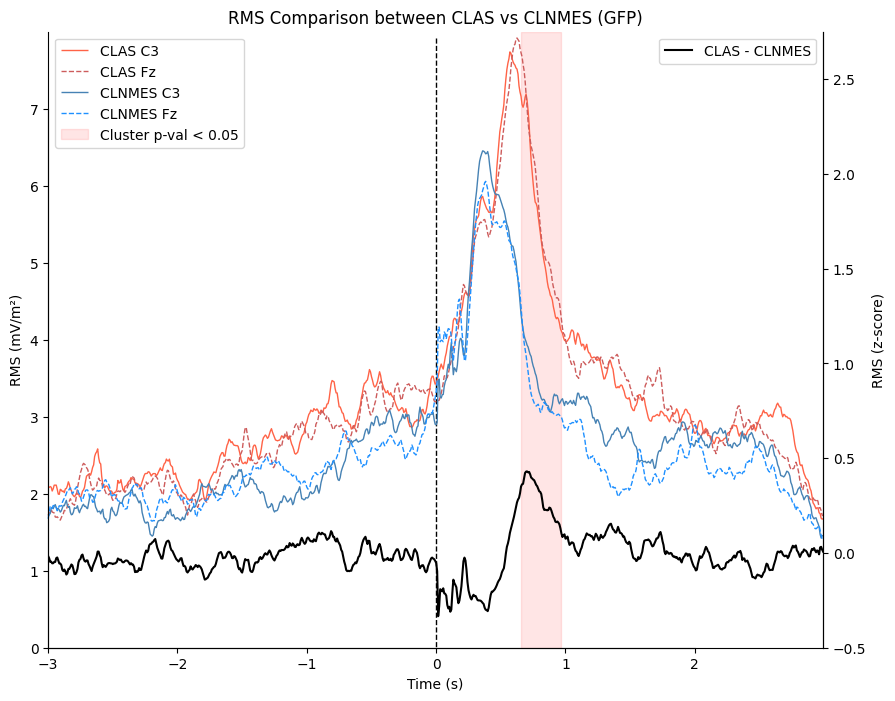

In [15]:
def plot_rms_contrasts_with_stats(df_evoked, times=(-2, 2), pval=0.05, n_permutations=1024):
    import matplotlib.patches as mpatches
    # Prepare evoked data
    df_evoked_ = df_evoked.copy()

    # Select only evoked objects with trials for all contrasts
    df_evoked_ = df_evoked_.groupby(['Subject']).filter(lambda x: len(x) == 2)

    # Create a dictionary with evoked objects for each condition
    evokeds = dict(
        CLAS_C3=list(df_evoked_.loc['pn'].Contrast_c3),
        CLAS_Fz=list(df_evoked_.loc['pn'].Contrast_fz),
        CLNMES_C3=list(df_evoked_.loc['nmes'].Contrast_c3),
        CLNMES_Fz=list(df_evoked_.loc['nmes'].Contrast_fz)
    )

    # Function to calculate gfp from evoked data dictionary
    def process_evoked_data_gfp(evokeds):
        results = {}
        for condition, evoked_list in evokeds.items():
            # Stack all data arrays vertically (assuming data shape is consistent)
            all_data = np.concatenate([np.expand_dims(evk.data, 1)*1e3 for evk in evoked_list], 1)
            all_data = scipy.stats.zscore(all_data, axis=-1)

            # Calculate the norm over columns (i.e., across trials), then normalize by sqrt(N)
            #norm_data = np.linalg.norm(all_data, axis=0) / np.sqrt(len(evoked_list)) 
            norm_data = np.sqrt((all_data**2).mean(axis=0))  # Calculate the GFP/RMS
                
            # Initialize the dictionary for the current condition
            results[condition] = {}
                    
            # Store the processed data back in a dictionary
            results[condition] = norm_data
        
        return results

    results_gfp = process_evoked_data_gfp(evokeds)

    # rms_all = []        
    # for condition, rms in results_gfp.items():
    #     # Slice the RMS data to the specified time range
    #     start_idx = evokeds['CLAS_C3'][0].time_as_index(times[0])[0]
    #     end_idx = evokeds['CLAS_C3'][0].time_as_index(times[1])[0]
    #     sliced_rms = rms[:, start_idx:end_idx]
    #     if sliced_rms.size == 0:
    #         raise ValueError(f"No data found for condition {condition} in the specified time range.")
    #     rms_all.append(np.expand_dims(sliced_rms, 1))

    # Compute the average of CLAS (C3 + Fz) and CLNMES (C3 + Fz)
    clas_avg = (results_gfp['CLAS_C3'] + results_gfp['CLAS_Fz']) / 2
    clnmes_avg = (results_gfp['CLNMES_C3'] + results_gfp['CLNMES_Fz']) / 2

    # Time indices based on the specified time range
    start_idx = evokeds['CLAS_C3'][0].time_as_index(times[0])[0]
    end_idx = evokeds['CLAS_C3'][0].time_as_index(times[1])[0]

    # Time vector for plotting
    times = np.arange(times[0] * 128, times[1] * 128) / 128
    t =  np.arange(-3 * 128, 3 * 128) / 128

    # Compute the difference between the two averages
    diff = clas_avg - clnmes_avg

    # Set the threshold for the cluster-based permutation test
    df = diff[0].shape[0] - 1  # degrees of freedom for the test
    thresh = scipy.stats.t.ppf(1 - pval / 2, df)  # two-tailed, t distribution
    
    # Run the cluster-based permutation test
    T_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(
        diff[:, start_idx:end_idx],
        n_permutations=1024,
        threshold=thresh,
        tail=1,
        n_jobs=-1,
        out_type="mask",
        seed=42
    )

    # Plot the results
    fig, ax = plt.subplots(1, figsize=(10, 8))

    # Plot the average difference
    mean_diff = diff.mean(axis=0)
    # twin axes for the average difference
    ax2 = ax.twinx()
    ax2.plot(t, mean_diff, label="CLAS - CLNMES", color='black')
    
    # Combine applies lambda data: np.sqrt((data**2).mean(axis=0)) for GFP
    #mne.viz.plot_compare_evokeds(evokeds, combine="gfp", ci=True, axes=ax, show=False)
    mne.viz.plot_compare_evokeds(
        evokeds,
        #colors=dict(CLAS_C3='r', CLAS_Fz='r', CLNMES_C3='b', CLNMES_Fz='b'),
        colors=dict(
            CLAS_C3='#FF6347',  # Tomato red
            CLAS_Fz='#CD5C5C',  # Indian red
            CLNMES_C3='#4682B4',  # Steel blue
            CLNMES_Fz='#1E90FF'  # Dodger blue
        ),
        linestyles=dict(
            CLAS_C3='-', CLAS_Fz='--', 
            CLNMES_C3='-', CLNMES_Fz='--'),
        styles=dict({
            "CLAS_C3": {"linewidth": 1}, "CLAS_Fz": {"linewidth": 1},
            "CLNMES_C3": {"linewidth": 1}, "CLNMES_Fz": {"linewidth": 1}
            }),

        combine="gfp", 
        time_unit="s",
        axes=ax, 
        show=False,
        ci=None, #.95  # Enable confidence intervals
        title="RMS Comparison between CLAS vs CLNMES", 
    ) # Plot RMS contrasts  

    print(cluster_p_values)

    # Plot significant clusters
    for cluster_idx, cluster in enumerate(clusters):
        if cluster_p_values[cluster_idx] < 0.05:
            # Let's assume 'sig' is your boolean array indicating significant cluster
            # sig = clusters[cluster_idx]
   
            # # Find indices where True segments start and end
            # starts = np.where(np.diff(sig.astype(int)) == 1)[1][0]
            # ends = np.where(np.diff(sig.astype(int)) == -1)[1][0]
            starts = cluster[0].start
            ends = cluster[0].stop
            
            # Convert indices to time values
            start_time = times[starts]
            end_time = times[ends]

            # Plot the highlighted region
            ax.axvspan(start_time, end_time, color='red', alpha=0.1)
    
    # Create a custom legend entry for the shaded area
    red_patch = mpatches.Patch(color='red', alpha=0.1, label='Cluster p-value < 0.05')
    handles, labels = ax.get_legend_handles_labels()
    handles.append(red_patch)
    labels.append('Cluster p-val < 0.05')
    # Remove underscores and set legend
    labels = [label.replace('_', ' ') for label in labels]
    ax.legend(handles, labels, loc='upper left')
    ax2.legend(loc='upper right')

    # Force the y-axis limit after all plotting is done
    ax.set_ylim(0, 8)
    ax2.set_ylim(-0.5, 2.75)
    ax.set_xlabel("Time (s)")
    ax2.set_ylabel("RMS (z-score)")
    ax.set_ylabel("RMS (mV/m²)")
    sns.despine(right=False)
    plt.show()


# Example usage
plot_rms_contrasts_with_stats(df_evoked, times=(-3, 3), pval=0.05, n_permutations=1024)

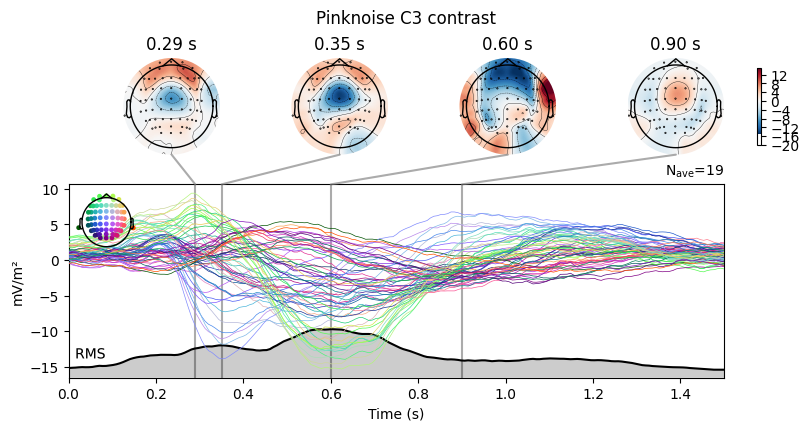

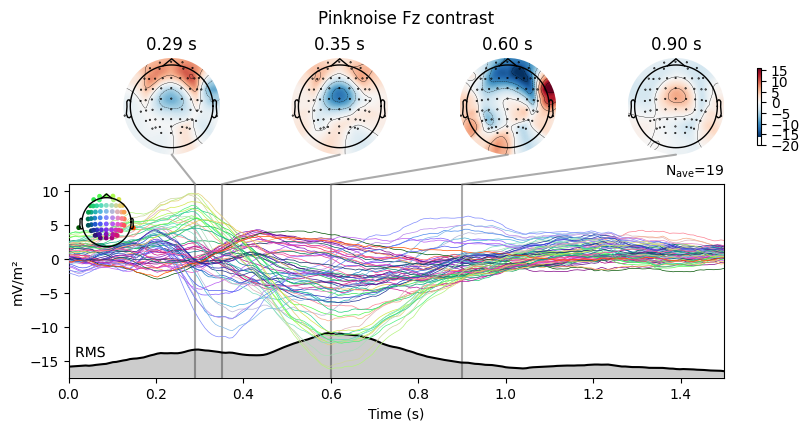

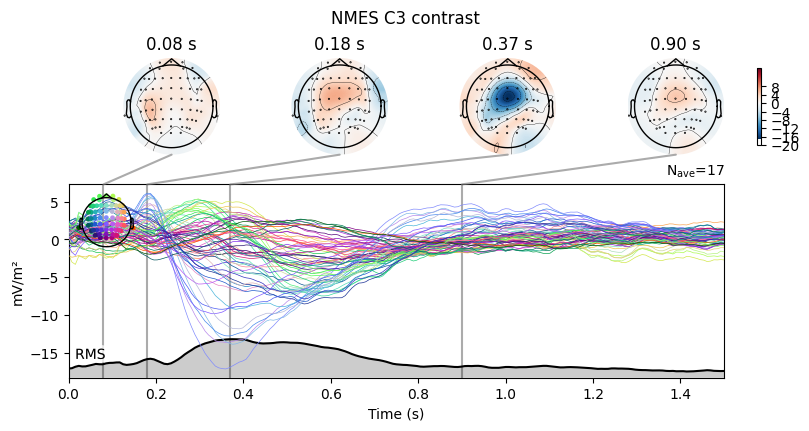

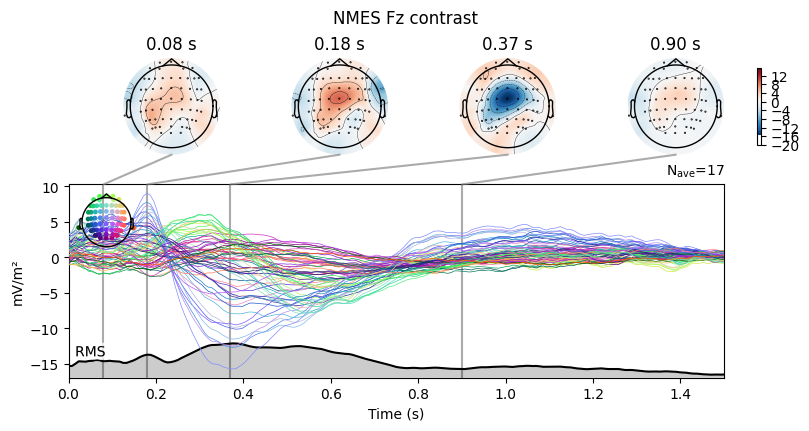

In [16]:
# Plot contrasts
plot_gavs_contrasts(df_evoked)

In [17]:
def double_contrast_erp(df_evoked):
    # Step 1: Reset the 'Night' from the index and aggregate if needed
    nmes_data = df_evoked.xs('nmes', level='Mode').reset_index('Night', drop=True)
    pn_data = df_evoked.xs('pn', level='Mode').reset_index('Night', drop=True)

    # Step 2: Form double contrast dataframe
    double_contrast_df = nmes_data[['Contrast_c3','Contrast_fz']].join(pn_data[['Contrast_c3', 'Contrast_fz']], 
                                                                       lsuffix='_nmes', rsuffix='_pn', 
                                                                       how='outer')

    # Step 3: Drop nans
    dc_df = double_contrast_df.dropna()

    # Step 4: Convert dataframes to numpy arrays
    C3_evokeds = [mne.combine_evoked([list(dc_df['Contrast_c3_nmes'])[i], 
                                      list(dc_df['Contrast_c3_pn'])[i]],
                                     weights=[1, -1]) for i in range(len(dc_df))]

    Fz_evokeds = [mne.combine_evoked([list(dc_df['Contrast_fz_nmes'])[i], 
                                      list(dc_df['Contrast_fz_pn'])[i]],
                                     weights=[1, -1]) for i in range(len(dc_df))]
    
    C3_Fz_evokeds_nmes = [mne.combine_evoked([list(dc_df['Contrast_c3_nmes'])[i],
                                              list(dc_df['Contrast_fz_nmes'])[i]],
                                            weights=[1, -1]) for i in range(len(dc_df))]
    
    C3_Fz_evokeds_pn = [mne.combine_evoked([list(dc_df['Contrast_c3_pn'])[i],
                                            list(dc_df['Contrast_fz_pn'])[i]],
                                          weights=[1, -1]) for i in range(len(dc_df))]
    
    C3_Fz_evokeds = [mne.combine_evoked([C3_evokeds[i], Fz_evokeds[i]],
                                        weights=[1, -1]) for i in range(len(dc_df))]

    return C3_evokeds, Fz_evokeds, C3_Fz_evokeds_nmes, C3_Fz_evokeds_pn, C3_Fz_evokeds

C3_evokeds, Fz_evokeds, C3_Fz_evokeds_nmes, C3_Fz_evokeds_pn, C3_Fz_evokeds = double_contrast_erp(df_evoked)

In [18]:
def group_sleep_epoch_double_stats(C3_evokeds, Fz_evokeds, times=(-0.02, 0.02), zscore=False):
    # copy dataframe
    df_evoked_ = df_evoked.copy()

    # prepare adjacency matrix (only takes eeg)
    adj_epochs = mne.read_epochs('/media/administrator/Sleep_Data/Processed/Sleep/Intermediate/LuPf_1_1-epo.fif').crop(-2, 2)
    adjacency, ch_names = mne.channels.find_ch_adjacency(adj_epochs.info, 'eeg')

    # extract evoked data 
    for con, name in zip([C3_evokeds, Fz_evokeds], ['C3 Double Contrast', 'Fz Double Contrast']):
        evk = con.copy()
        gavs = mne.grand_average(list(evk)).crop(tmin=times[0], tmax=times[1])
        evk_np = np.concatenate([np.expand_dims(evk[idx].copy().crop(tmin=times[0], tmax=times[1]).get_data(), 0)*1e3 
                                for idx in range(len(evk))], 0)
        contrast = np.swapaxes(evk_np, 2, 1)

        # zscore, if desired
        if zscore:           
            contrast = scipy.stats.zscore(contrast, axis=-1)

        # Threshold for cluster test
        pval = 0.05 
        dof = contrast.shape[0] - 1  # degrees of freedom for the test
        thresh = scipy.stats.t.ppf(1 - pval / 2, dof)  # two-tailed, t distribution

        # spatial permuation cluster test
        t_obs, clusters, cluster_p_values, h0 = mne.stats.permutation_cluster_1samp_test(
            contrast,                            # numpy array for contrast [n_subjects, n_voltage, n_channels]
            n_permutations=1024,                 # 1000 is the minimum
            threshold=thresh,                    # threshold for cluster formation
            tail=0,                              # two-tailed test (1 or -1 for one-tailed)
            n_jobs=-1,                           # increase value to speed up computations
            adjacency=adjacency,                 # sparse matrix for channel adjacency as computed above
            buffer_size=None,
            out_type='mask',                     # returns a mask map instead of indices of sig. points
            seed=1503
        )           

        if all(p > 0.05 for p in cluster_p_values):
            print('No significant clusters found')
            df_stats = pd.DataFrame({'Chan': ch_names, 
                                     'T-Stat': t_obs.mean(0).squeeze(), 
                                     'Sig': [False] * len(ch_names)})  # Assuming 64 channels
            mask = [False] * len(ch_names)
        else:
            min_p_value = min(cluster_p_values)
            print(f"P-Value: {min_p_value}")
            df_stats = pd.DataFrame({'Chan': ch_names, 
                                    'T-Stat': t_obs.mean(0).squeeze(), 
                                    'Sig': clusters[np.argmin(cluster_p_values)][0]}
                                    ) 
            mask = clusters[np.argmin(cluster_p_values)][0]


        df_stats = df_stats.set_index("Chan")

        unit='mV/m2'
        fig, ax = plt.subplots(1, 2, figsize=(8,6))

        im1, _ = mne.viz.plot_topomap(contrast.mean(0).mean(0).squeeze(), 
                                    pos=gavs.info,
                                    axes=ax[0], 
                                    cmap='RdBu_r',
                                    show=False, 
                                    names=None)
        cbar1 = fig.colorbar(im1, fraction=0.05, ax=ax[0])   
        cbar1.ax.set_ylabel(unit, rotation=270)
        plt.tight_layout()

        if all(p > 0.05 for p in cluster_p_values): 
            im2, _ = mne.viz.plot_topomap(t_obs.mean(0).squeeze(), 
                                        pos=gavs.info,
                                        axes=ax[1], 
                                        cmap='RdBu_r',
                                        names=None,
                                        show=False,  
                                    )
        else:
            im2, _ = mne.viz.plot_topomap(t_obs.mean(0).squeeze(), 
                            pos=gavs.info,
                            axes=ax[1], 
                            mask=mask,
                            cmap='RdBu_r',
                            names=None,
                            show=False,  
                            mask_params=dict(markersize=8, markerfacecolor='y')
                            )
        cbar2 = fig.colorbar(im2, fraction=0.05, ax=ax[1])   
        cbar2.ax.set_ylabel('t-stat', rotation=270)
        plt.tight_layout()
        plt.suptitle(name, fontsize=18)
        plt.show()

Times : 170 ms - 190 ms
P-Value: 0.0400390625


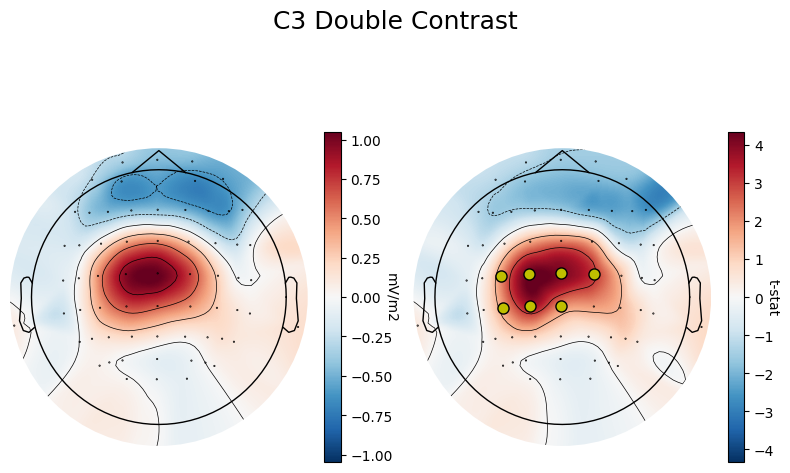

P-Value: 0.00390625


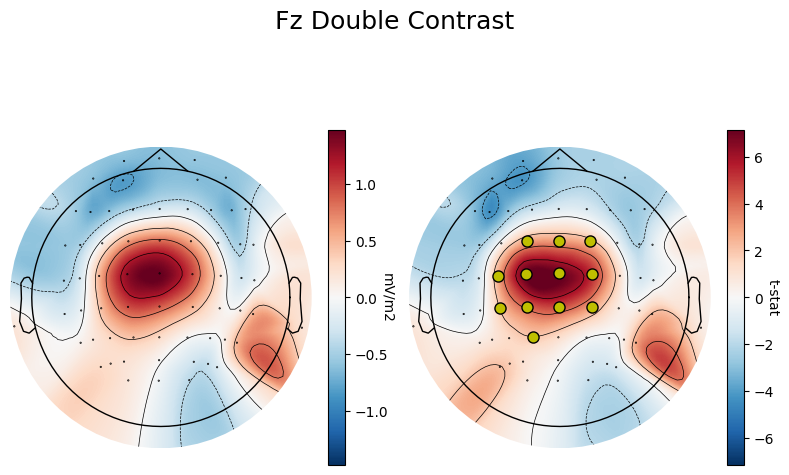

In [19]:
print('Times : 170 ms - 190 ms')
group_sleep_epoch_double_stats(C3_evokeds, Fz_evokeds, times=(0.17, 0.19), zscore=True)

Times : 240 ms - 260 ms
No significant clusters found


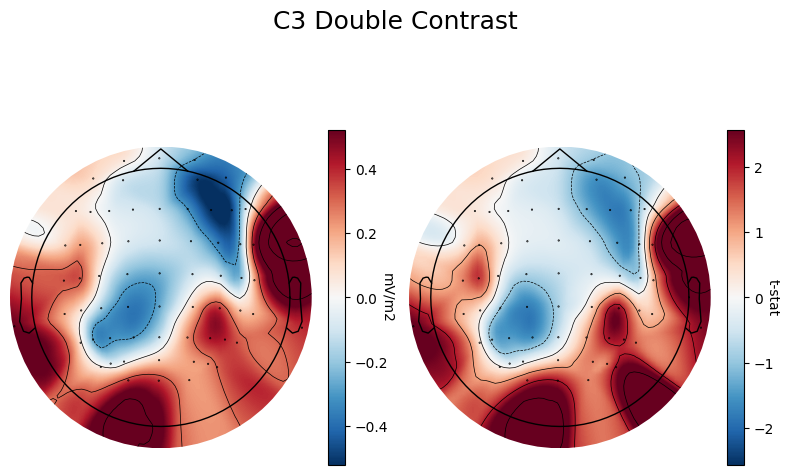

No significant clusters found


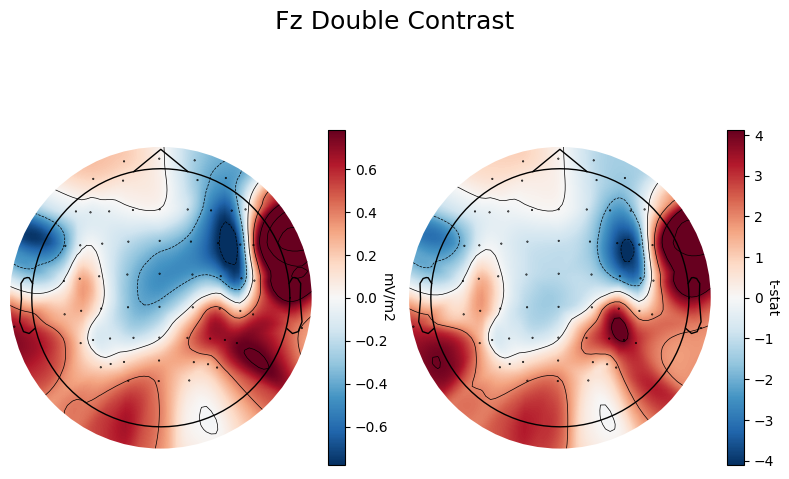

In [20]:
print('Times : 240 ms - 260 ms')
group_sleep_epoch_double_stats(C3_evokeds, Fz_evokeds, times=(0.24, 0.26), zscore=True)

Times : 350 ms - 380 ms
No significant clusters found


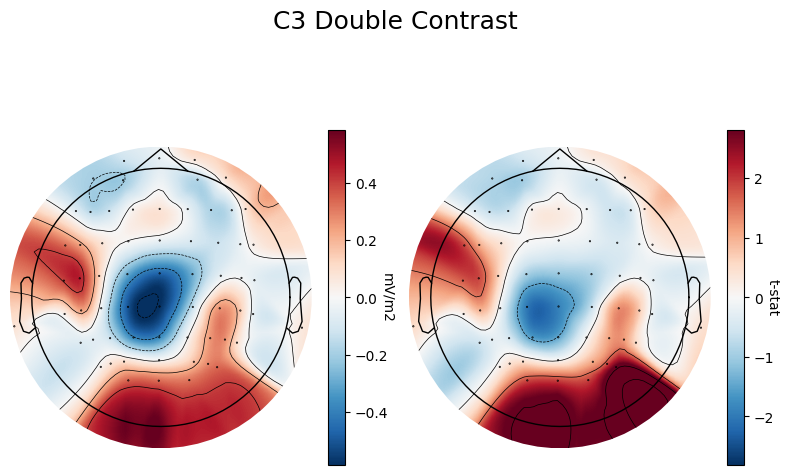

No significant clusters found


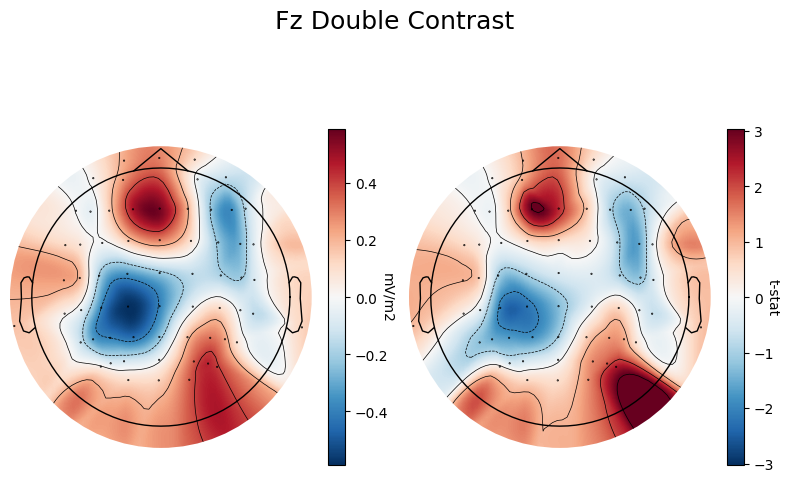

In [21]:
print('Times : 350 ms - 380 ms')
group_sleep_epoch_double_stats(C3_evokeds, Fz_evokeds, times=(0.35, 0.38), zscore=True)

Times : 580 ms - 620 ms
No significant clusters found


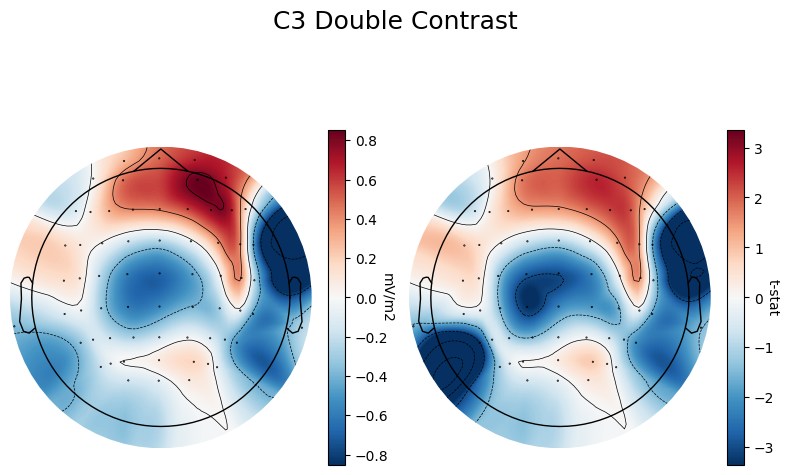

P-Value: 0.0341796875


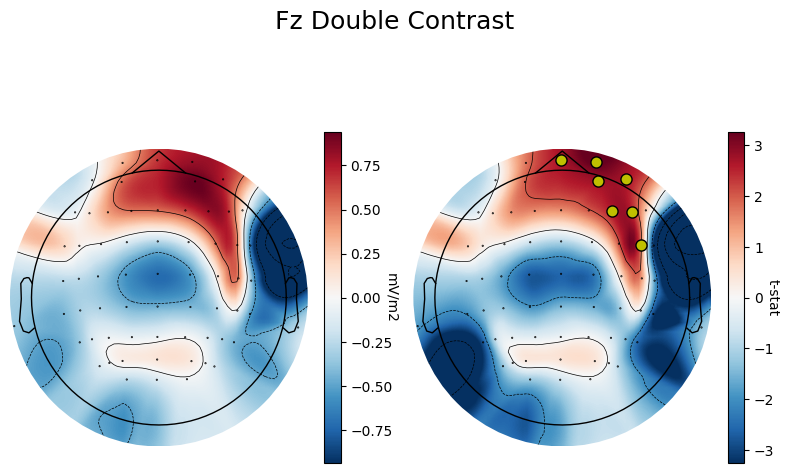

In [22]:
print('Times : 580 ms - 620 ms')
group_sleep_epoch_double_stats(C3_evokeds, Fz_evokeds, times= (0.58, 0.62), zscore=True)

Times : 900 ms - 1200 ms
No significant clusters found


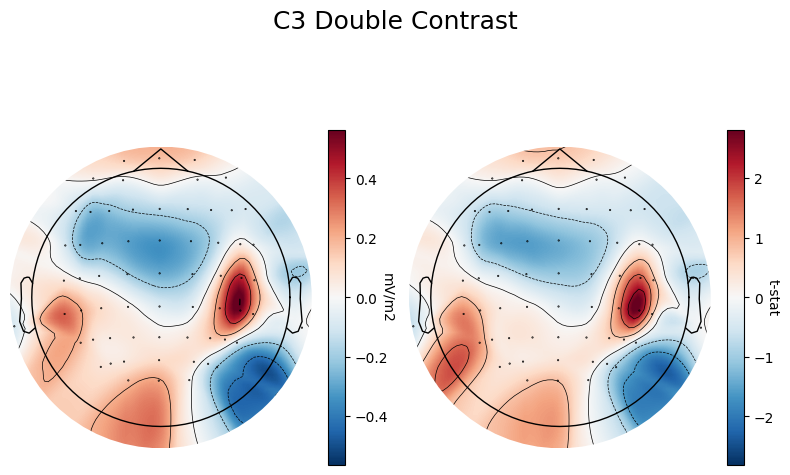

No significant clusters found


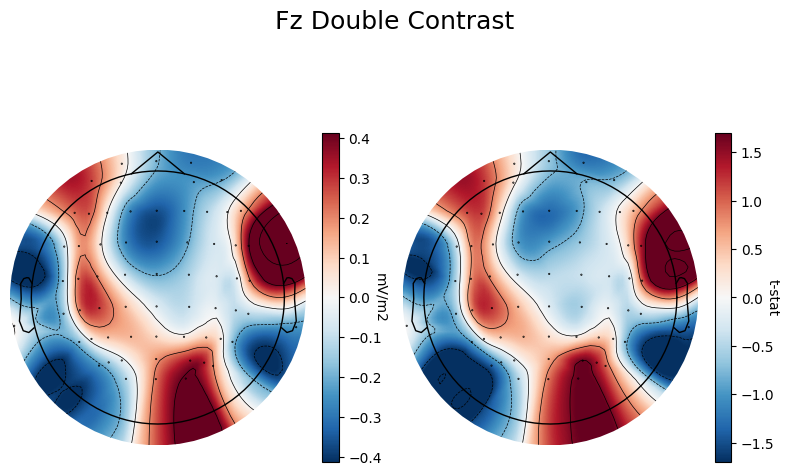

In [23]:
print('Times : 900 ms - 1200 ms')
group_sleep_epoch_double_stats(C3_evokeds, Fz_evokeds, times=(0.9, 1.2), zscore=True)

In [24]:
def group_sleep_epoch_stats(df_evoked, nmes_times=(-0.02, 0.02), pn_times=(-0.02, 0.02), zscore=True):
    # copy dataframe
    df_evoked_ = df_evoked.copy()

    # prepare adjacency matrix (only takes eeg)
    adj_epochs = mne.read_epochs('/media/administrator/Sleep_Data/Processed/Sleep/Intermediate/LuPf_1_1-epo.fif').crop(-2, 2)
    adjacency, ch_names = mne.channels.find_ch_adjacency(adj_epochs.info, 'eeg')

    # extract evoked data 
    for mode in ['pn','nmes']:
        if mode == 'pn':
            times = pn_times
        else:
            times = nmes_times
        for con in ['Contrast_c3', 'Contrast_fz']:
            obj = df_evoked_.loc[mode]

            evk = obj.reset_index()[con].copy()
            gavs = mne.grand_average(list(evk)).crop(tmin=times[0], tmax=times[1])
            evk_np = np.concatenate([np.expand_dims(evk[idx].copy().crop(tmin=times[0], tmax=times[1]).get_data(), 0)*1e3 
                                     for idx in range(len(evk))], 0)
            contrast = np.swapaxes(evk_np, 2, 1)

            if zscore:
                contrast = scipy.stats.zscore(contrast, axis=-1)
            
            #indices = adj_epochs.time_as_index(times)
            #contrast = np.array([evoked.data for evoked in obj[con]])[:,:,indices].mean(2, keepdims=True)*1e3
            #contrast = contrast.swapaxes(2,1)
            #gavs = mne.grand_average(list(obj[con])).crop(tmin=times[0], tmax=times[1])

            # Threshold for cluster test
            pval = 0.05 
            dof = contrast.shape[0] - 1  # degrees of freedom for the test
            thresh = scipy.stats.t.ppf(1 - pval / 2, dof)  # two-tailed, t distribution

            # spatial permuation cluster test
            t_obs, clusters, cluster_p_values, h0 = mne.stats.permutation_cluster_1samp_test(
                contrast,                           # numpy array for contrast [n_subjects, n_voltage, n_channels]
                n_permutations=1024,                # 1000 is the minimum
                threshold=thresh,                   # threshold for cluster formation
                tail=0,                             # two-tailed test (1 or -1 for one-tailed)
                n_jobs=-1,                          # increase value to speed up computations
                adjacency=adjacency,                # sparse matrix for channel adjacency as computed above
                buffer_size=None,
                out_type='mask',                    # returns a mask map instead of indices of sig. points
                seed=1503
            )           

            if all(p > 0.05 for p in cluster_p_values):
                print('No significant clusters found')
                df_stats = pd.DataFrame({'Chan': ch_names, 
                                        'T-Stat': t_obs.mean(0).squeeze(), 
                                        'Sig': [False] * len(ch_names)})  # Assuming 64 channels
                mask = [False] * len(ch_names)
            else:
                min_p_value = min(cluster_p_values)
                print(f"P-Value: {min_p_value}")
                df_stats = pd.DataFrame({'Chan': ch_names, 
                                        'T-Stat': t_obs.mean(0).squeeze(), 
                                        'Sig': clusters[np.argmin(cluster_p_values)][0]}
                                        ) 
                mask = clusters[np.argmin(cluster_p_values)][0]


                df_stats = df_stats.set_index("Chan")

                unit='mV/m2'
                fig, ax = plt.subplots(1, 2, figsize=(8,6))

                im1, _ = mne.viz.plot_topomap(contrast.mean(0).mean(0).squeeze(), 
                                            pos=gavs.info,
                                            axes=ax[0], 
                                            cmap='RdBu_r',
                                            show=False, 
                                            names=None)
                cbar1 = fig.colorbar(im1, fraction=0.05, ax=ax[0])   
                cbar1.ax.set_ylabel(unit, rotation=270)
                plt.tight_layout()

                if all(p > 0.05 for p in cluster_p_values): 
                    im2, _ = mne.viz.plot_topomap(t_obs.mean(0).squeeze(), 
                                                pos=gavs.info,
                                                axes=ax[1], 
                                                cmap='RdBu_r',
                                                names=None,
                                                show=False,  
                                            )
                else:
                    im2, _ = mne.viz.plot_topomap(t_obs.mean(0).squeeze(), 
                                    pos=gavs.info,
                                    axes=ax[1], 
                                    mask=mask,
                                    cmap='RdBu_r',
                                    names=None,
                                    show=False,  
                                    mask_params=dict(markersize=8, markerfacecolor='y')
                                    )
                cbar2 = fig.colorbar(im2, fraction=0.05, ax=ax[1])   
                cbar2.ax.set_ylabel('t-stat', rotation=270)
                plt.tight_layout()
                plt.suptitle(f'{mode.upper()} {con.split("_")[-1].upper()}', fontsize=18)
                plt.show()

P-Value: 0.0009765625


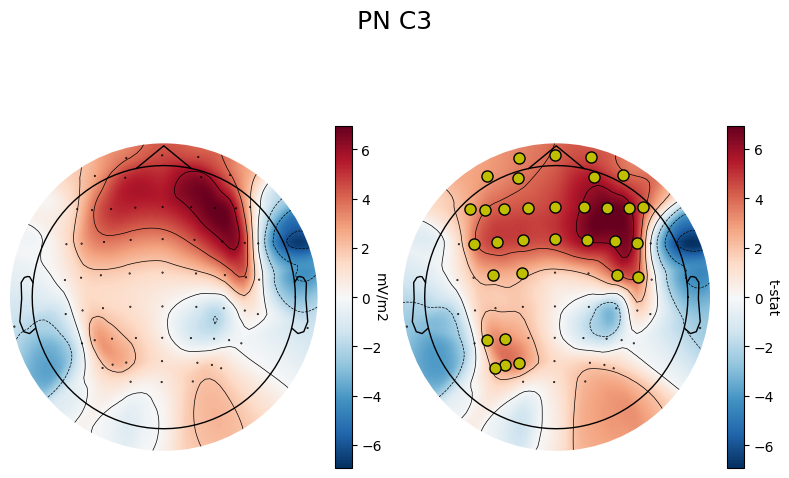

P-Value: 0.0009765625


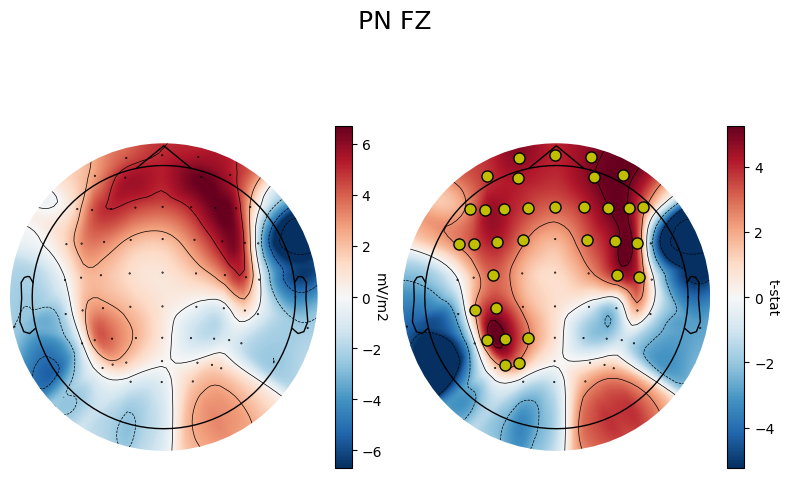

P-Value: 0.0009765625


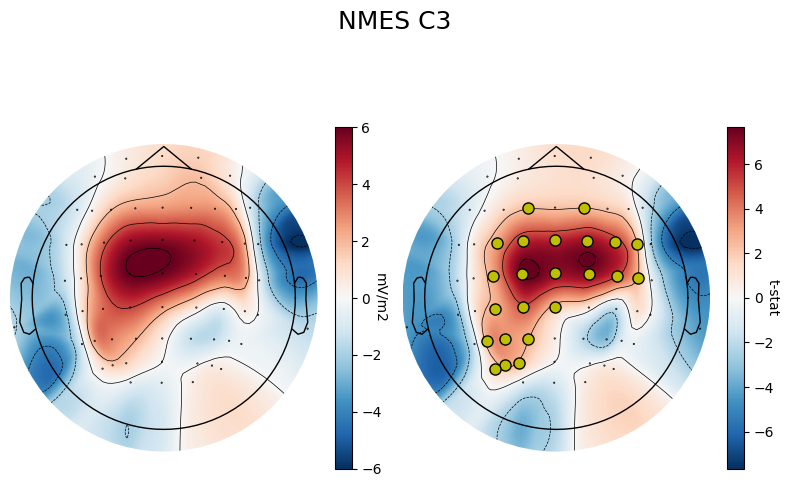

P-Value: 0.0009765625


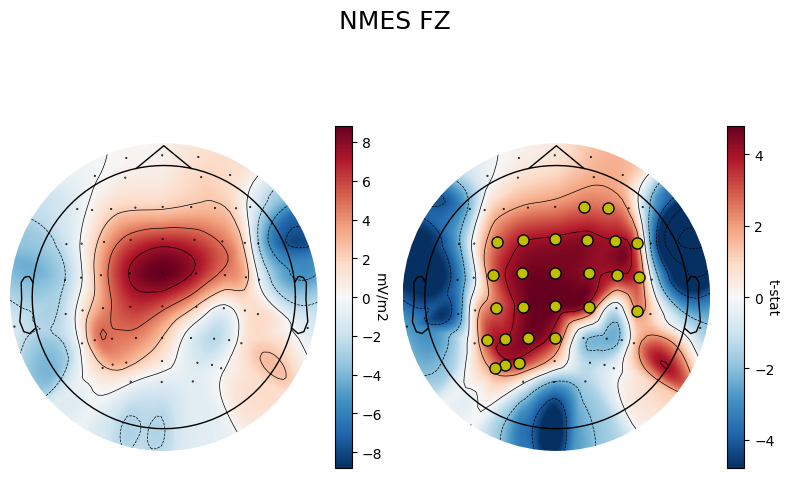

In [25]:
group_sleep_epoch_stats(df_evoked, nmes_times=(0.17, 0.19), pn_times=(0.17, 0.19), zscore=False)

P-Value: 0.0009765625


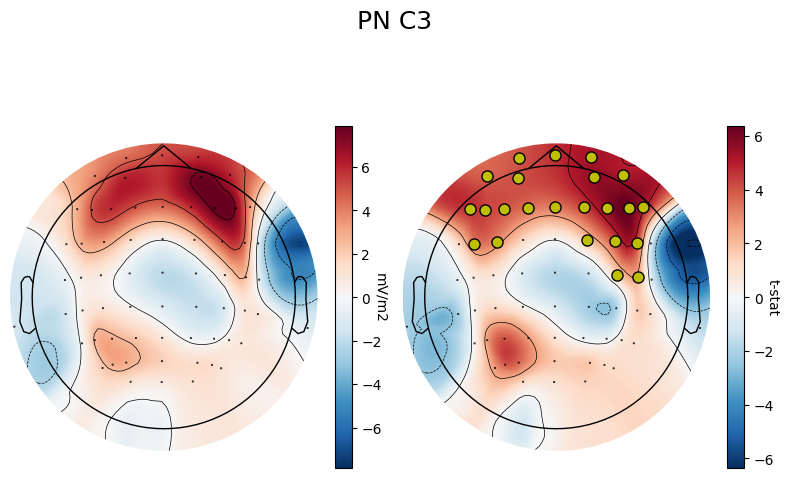

P-Value: 0.0009765625


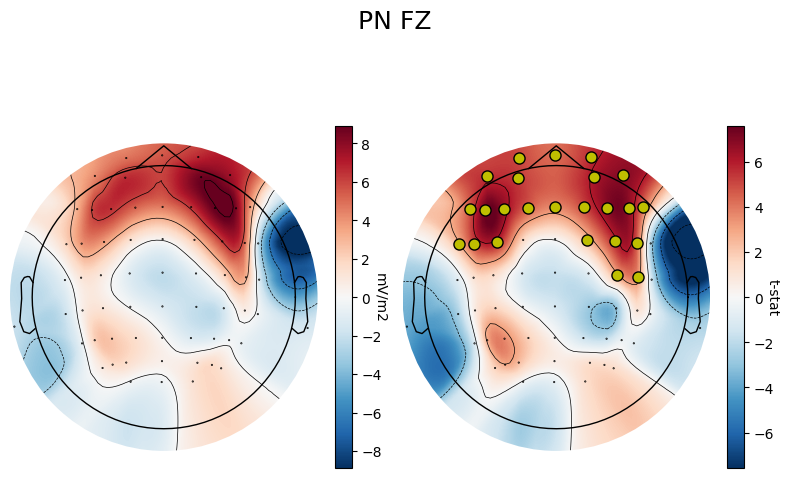

P-Value: 0.0009765625


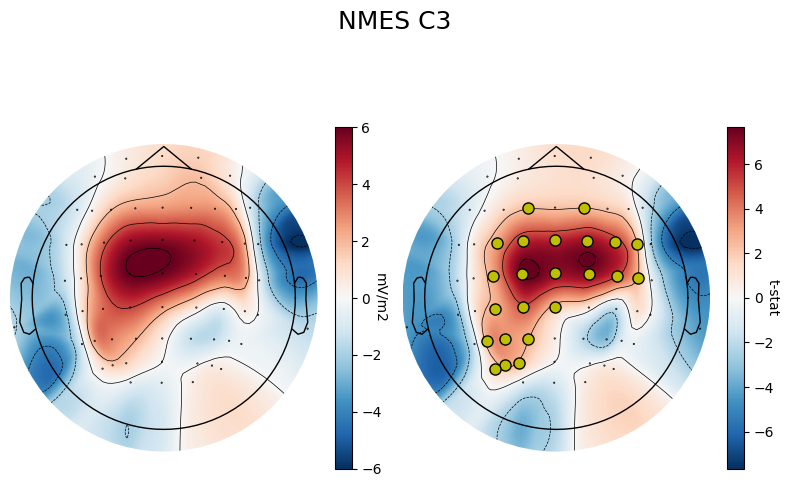

P-Value: 0.0009765625


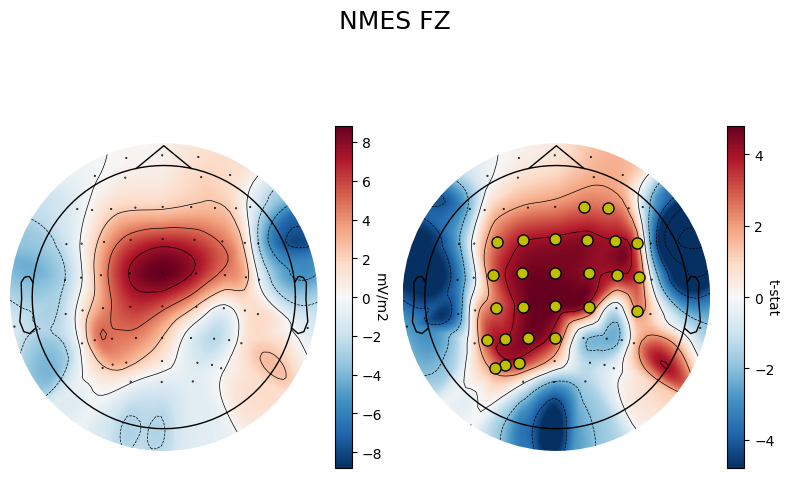

In [26]:
group_sleep_epoch_stats(df_evoked, nmes_times=(0.17, 0.19), pn_times=(0.24, 0.26), zscore=False)

P-Value: 0.0009765625


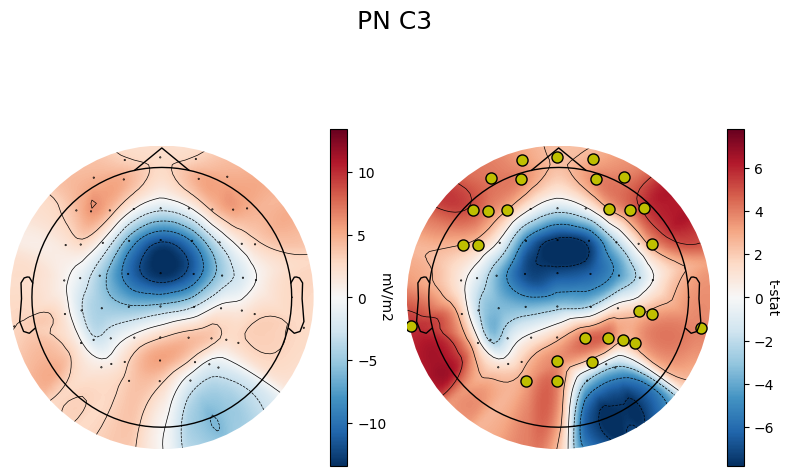

P-Value: 0.0009765625


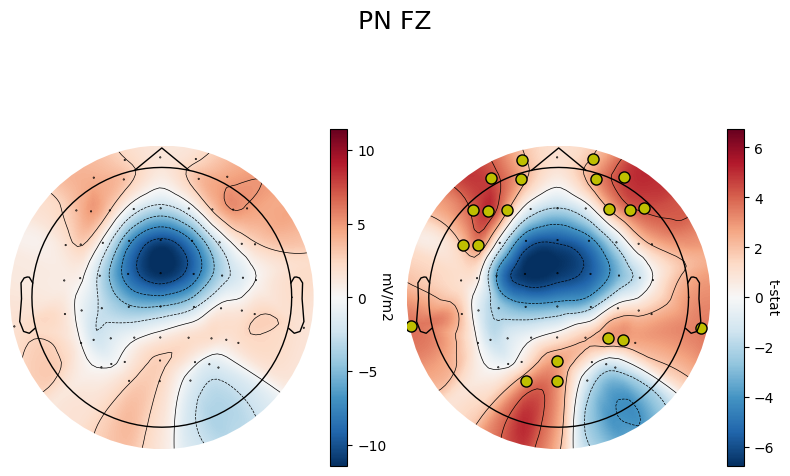

P-Value: 0.0009765625


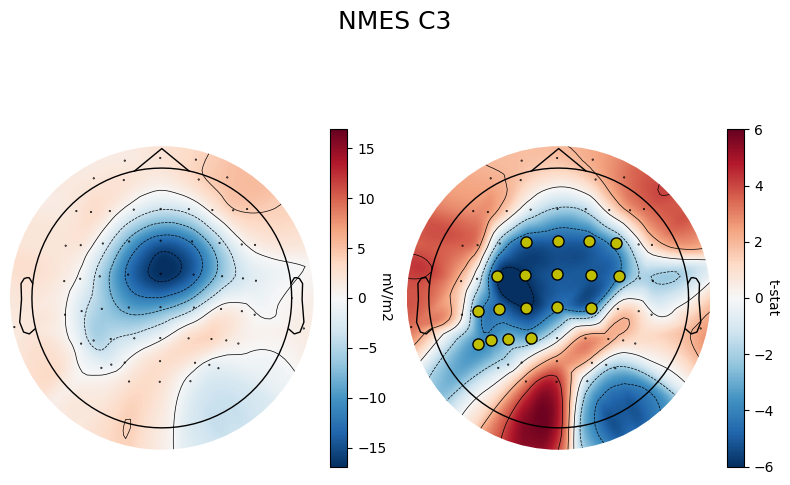

P-Value: 0.0009765625


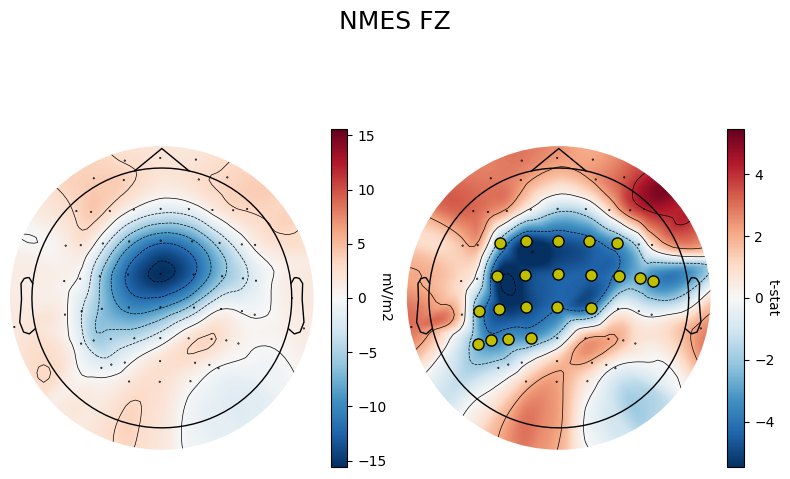

In [27]:
group_sleep_epoch_stats(df_evoked, nmes_times=(0.35, 0.38), pn_times=(0.35, 0.38), zscore=False)

P-Value: 0.0009765625


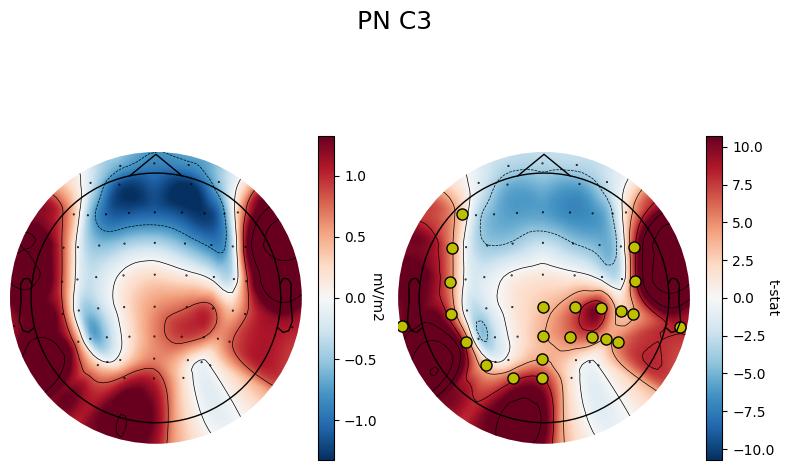

P-Value: 0.0009765625


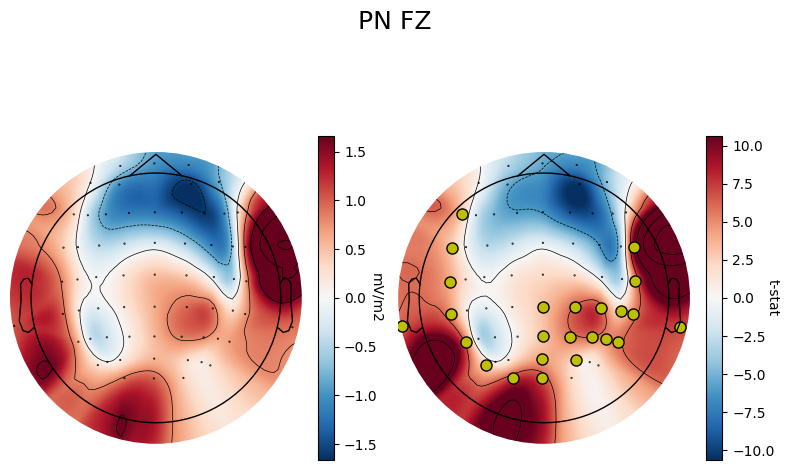

P-Value: 0.0009765625


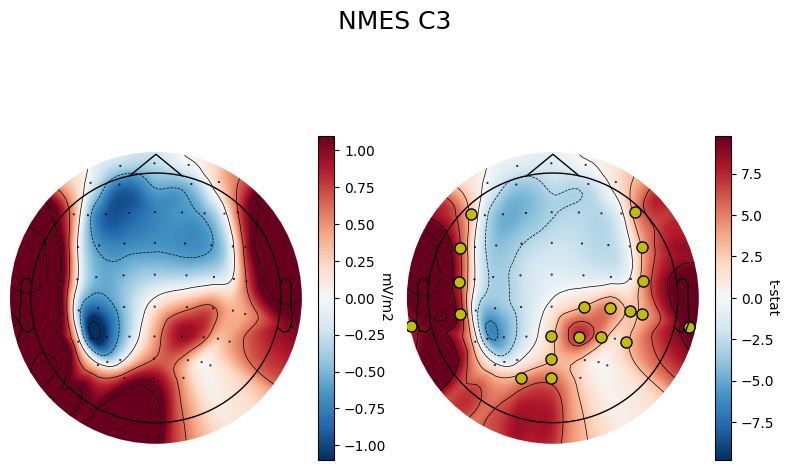

P-Value: 0.0009765625


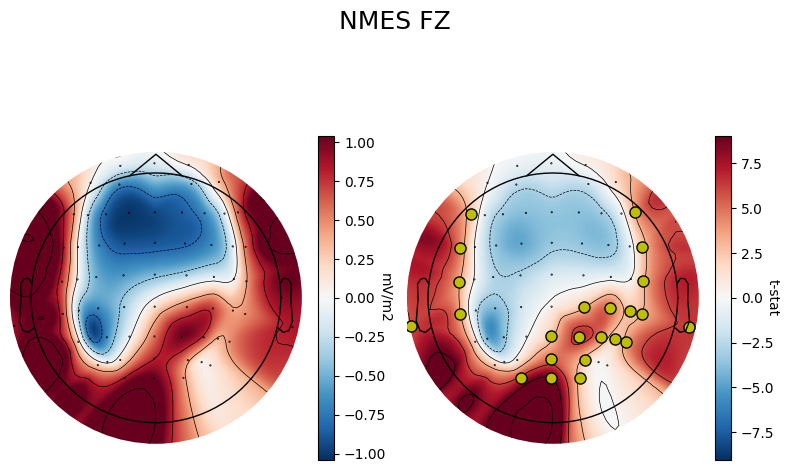

In [28]:
group_sleep_epoch_stats(df_evoked, nmes_times=(0.58, 0.62), pn_times=(0.58, 0.62))

P-Value: 0.0009765625


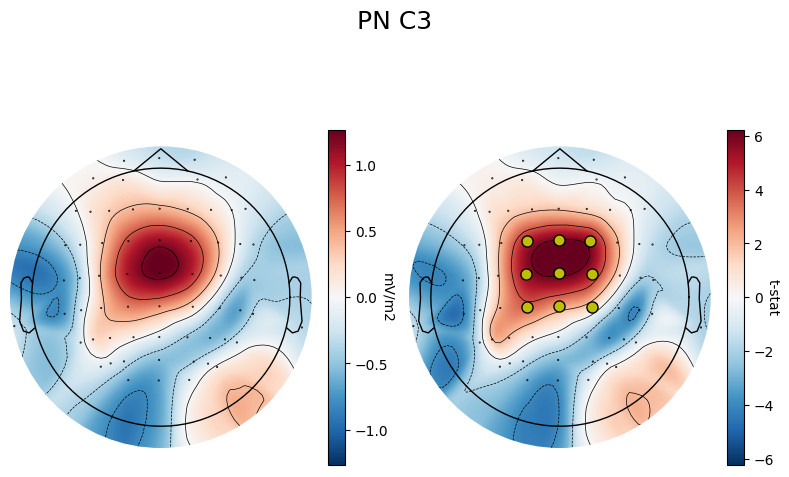

P-Value: 0.001953125


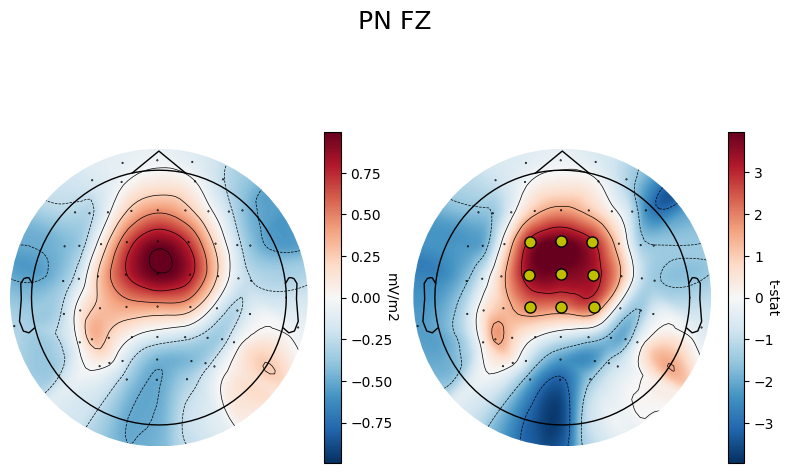

P-Value: 0.01171875


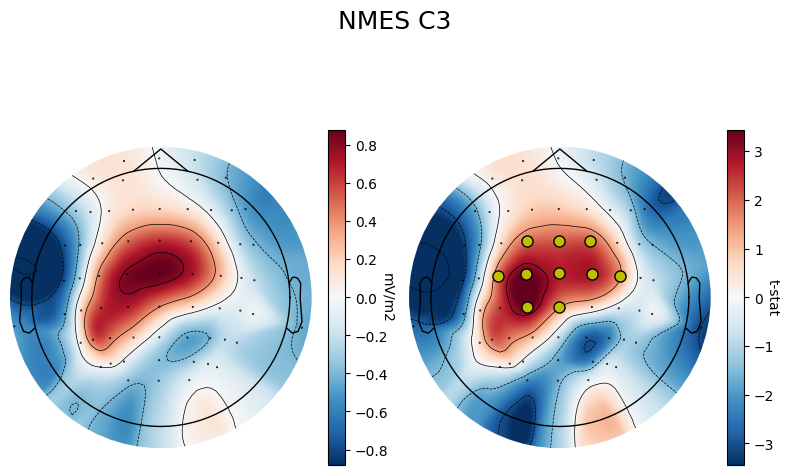

P-Value: 0.0009765625


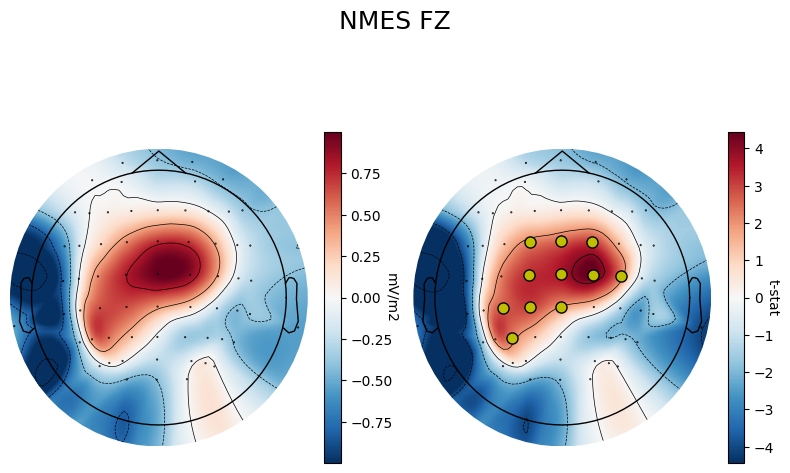

In [29]:
group_sleep_epoch_stats(df_evoked, nmes_times=(0.9, 1.2), pn_times=(0.9, 1.2))

### B.2. ERP and Topographic Consistency Analysis

In [30]:
# ERP/Topographic Consistency Analysis
df_tct = pd.read_csv(os.path.join(stats_path, 'df_tct.csv'), index_col=0)
df_tct = drop_bads_df(df_tct)
df_tct.groupby(['Mode', 'Stim', 'Target_Chan', 'Region', 'Latency']).mean(numeric_only=True)['ERP'].round(2)

Mode  Stim  Target_Chan  Region   Latency
nmes  sham  c3           Frontal  N550       0.08
                                  P200       1.15
                                  P900       0.02
                         Motor    N550      -0.09
                                  P200       1.91
                                  P900      -0.26
            fz           Frontal  N550      -0.65
                                  P200       2.16
                                  P900       0.37
                         Motor    N550       0.36
                                  P200      -0.03
                                  P900      -0.13
      stim  c3           Frontal  N550      -4.88
                                  P200       4.26
                                  P900       0.12
                         Motor    N550      -6.61
                                  P200       2.43
                                  P900       1.33
            fz           Frontal  N550      -5.49
        

In [31]:
df_tct[df_tct.Latency=='N550'].rm_anova(dv='ERP', within=['Mode', 'Region'], subject='Subject', detailed=True)

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,Mode,6.720422,1,15,6.720422,0.858884,0.368723,0.368723,0.014193,1.0
1,Region,9.859363,1,15,9.859363,0.926527,0.351029,0.351029,0.020685,1.0
2,Mode * Region,26.240736,1,15,26.240736,5.137087,0.038641,0.038641,0.053224,1.0


In [32]:
df_tct[df_tct.Latency=='N550'].groupby(['Mode','Region','Stim']).mean(numeric_only=True).ERP

Mode  Region   Stim
nmes  Frontal  sham   -0.286330
               stim   -5.184512
      Motor    sham    0.136301
               stim   -6.212136
pn    Frontal  sham   -0.758388
               stim   -7.342179
      Motor    sham   -0.485647
               stim   -4.404739
Name: ERP, dtype: float64

In [33]:
# Plot ERP results
def plot_erp_results(df_tct, method='ERP', name='ERP'):
    for latency in df_tct.Latency.unique():
        df_subset = df_tct[df_tct.Latency == latency]
        if method == 'ERP':
            g = sns.catplot(
                data=df_subset,
                kind="box",
                x="Region",
                y="ERP",
                hue="Stim",
                row="Mode",
                col="Target_Chan",
                palette="pastel",
                legend=True,
                showfliers=False,
            )

            # include points for data 
            g.map_dataframe(sns.stripplot, x="Region", y="ERP", 
                            hue="Stim", 
                            dodge=True, palette="pastel", size=10, alpha=0.5, linewidth=1)
        else:
            g = sns.catplot(
                data=df_subset,
                kind="box",
                x="Stim",
                y=method,
                hue="Stim",
                row="Mode",
                col="Target_Chan",
                palette="pastel",
                legend=True,
                showfliers=False,
            )

            # include points for data 
            g.map_dataframe(sns.stripplot, x="Stim", y=method, 
                            hue="Stim", 
                            dodge=False, palette="pastel", size=10, alpha=0.5, linewidth=1)

        g.set_axis_labels("", f"{name}", fontsize=14)
        g.set_titles("{col_name} Target ({row_name})", size=16)
        g.fig.suptitle(f"ERP Component: {latency}", fontsize=18, weight='bold') 

        # Adjust layout to add more space for the title
        plt.subplots_adjust(top=0.9)   

        # Save the figure
        spath = '/media/administrator/Sleep_Data/Figures/'
        g.savefig(f"{spath}{method}_{latency}.png", dpi=100)

        plt.show()


        # Run stats with LMM
        df_subset = df_subset.dropna()
        
        if method == 'ERP':
            model = sm.MixedLM.from_formula(f"{method} ~ Stim * Mode * Target_Chan * Region", groups="Subject", data=df_subset)
            #df_subset = df_subset[np.logical_and(df_subset.Target_Chan == 'c3', df_subset.Mode == 'nmes')]
            #model = sm.MixedLM.from_formula(f"{method} ~ Stim * Region", groups="Subject", data=df_subset)
        else:
            model = sm.MixedLM.from_formula(f"{method} ~ Stim + Mode + Target_Chan", groups="Subject", data=df_subset)
        model_fit = model.fit()
        print(model_fit.summary())

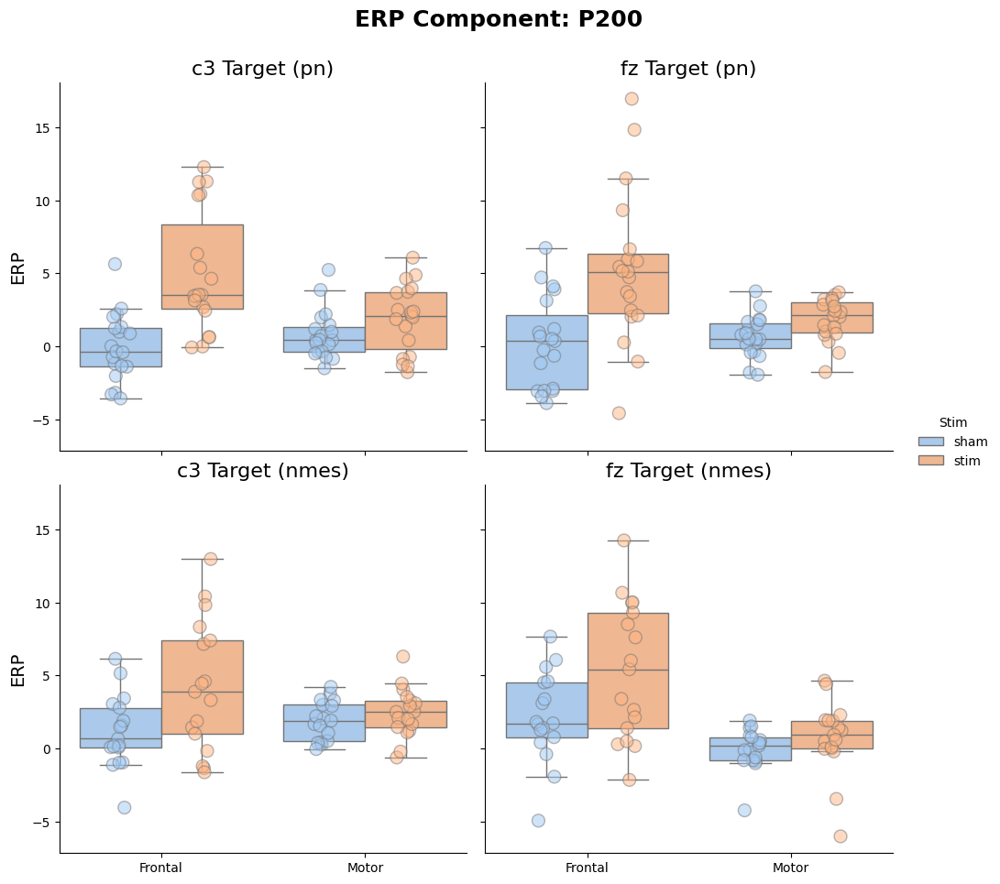

                               Mixed Linear Model Regression Results
Model:                           MixedLM                Dependent Variable:                ERP      
No. Observations:                288                    Method:                            REML     
No. Groups:                      20                     Scale:                             8.2182   
Min. group size:                 8                      Log-Likelihood:                    -702.8972
Max. group size:                 16                     Converged:                         Yes      
Mean group size:                 14.4                                                               
----------------------------------------------------------------------------------------------------
                                                          Coef.  Std.Err.   z    P>|z| [0.025 0.975]
----------------------------------------------------------------------------------------------------
Intercept             

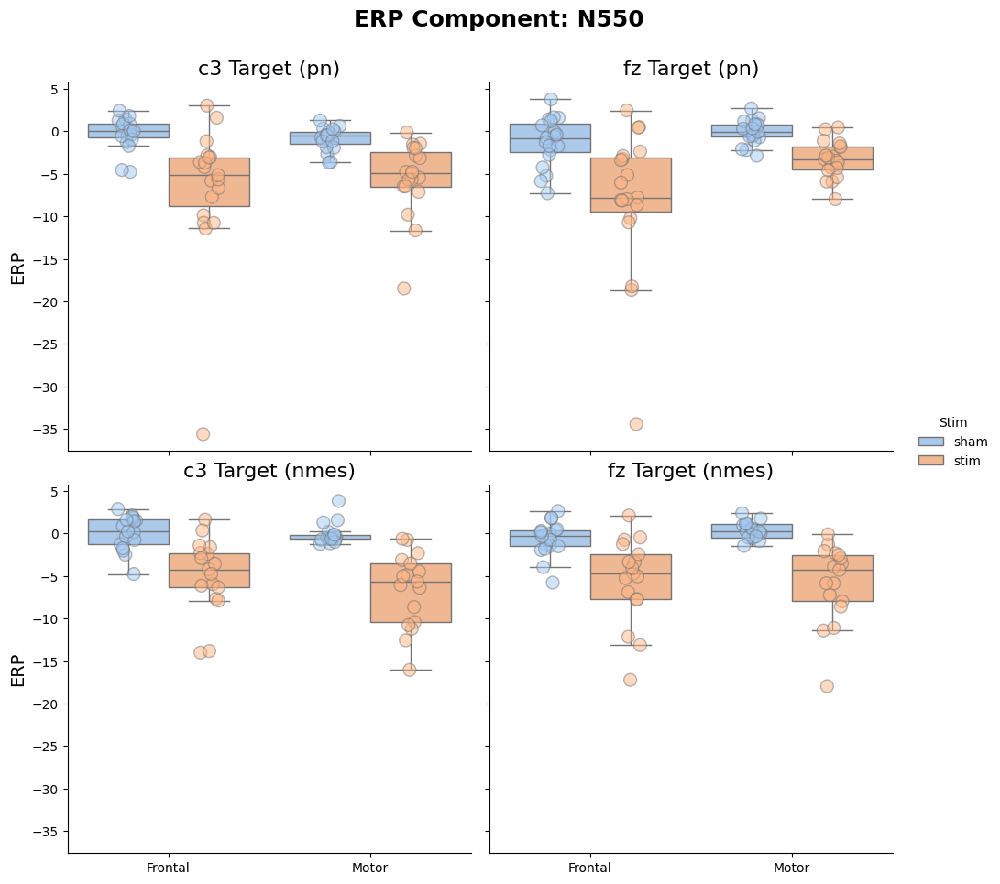

                               Mixed Linear Model Regression Results
Model:                           MixedLM                Dependent Variable:                ERP      
No. Observations:                288                    Method:                            REML     
No. Groups:                      20                     Scale:                             16.3605  
Min. group size:                 8                      Log-Likelihood:                    -794.0664
Max. group size:                 16                     Converged:                         Yes      
Mean group size:                 14.4                                                               
----------------------------------------------------------------------------------------------------
                                                          Coef.  Std.Err.   z    P>|z| [0.025 0.975]
----------------------------------------------------------------------------------------------------
Intercept             

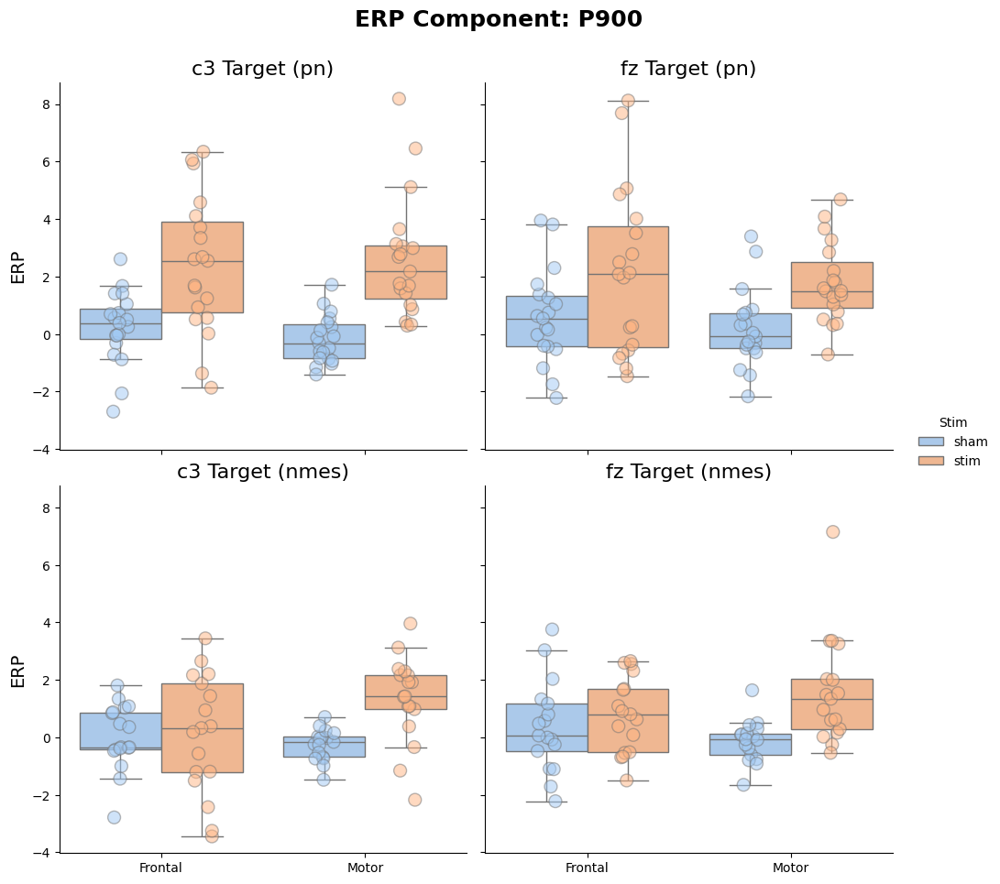

                               Mixed Linear Model Regression Results
Model:                           MixedLM                Dependent Variable:                ERP      
No. Observations:                288                    Method:                            REML     
No. Groups:                      20                     Scale:                             2.6350   
Min. group size:                 8                      Log-Likelihood:                    -545.6666
Max. group size:                 16                     Converged:                         Yes      
Mean group size:                 14.4                                                               
----------------------------------------------------------------------------------------------------
                                                          Coef.  Std.Err.   z    P>|z| [0.025 0.975]
----------------------------------------------------------------------------------------------------
Intercept             

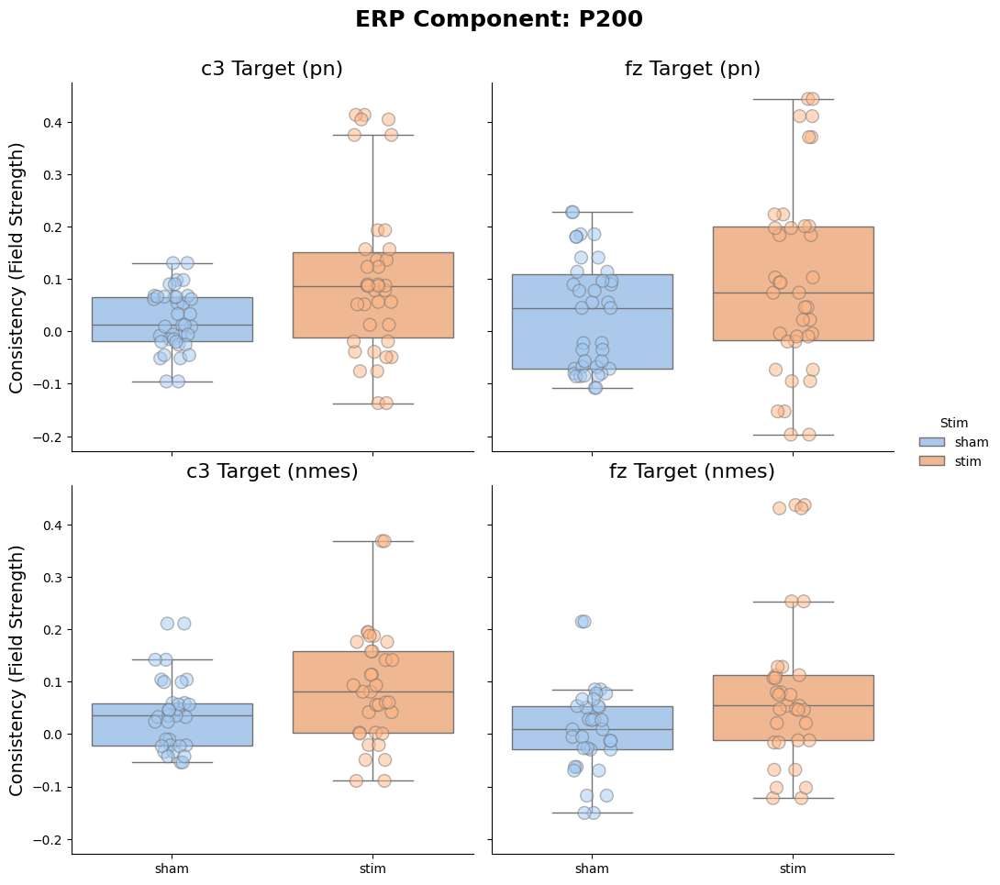

/home/administrator/anaconda3/envs/NDS/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


            Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: Consistency_RMS
No. Observations: 288     Method:             REML           
No. Groups:       20      Scale:              0.0108         
Min. group size:  8       Log-Likelihood:     211.8424       
Max. group size:  16      Converged:          Yes            
Mean group size:  14.4                                       
-------------------------------------------------------------
                   Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------
Intercept           0.030    0.020  1.522 0.128 -0.009  0.069
Stim[T.stim]        0.068    0.012  5.566 0.000  0.044  0.092
Mode[T.pn]          0.000    0.013  0.023 0.981 -0.025  0.026
Target_Chan[T.fz]  -0.007    0.012 -0.597 0.550 -0.031  0.017
Subject Var         0.005    0.018                           



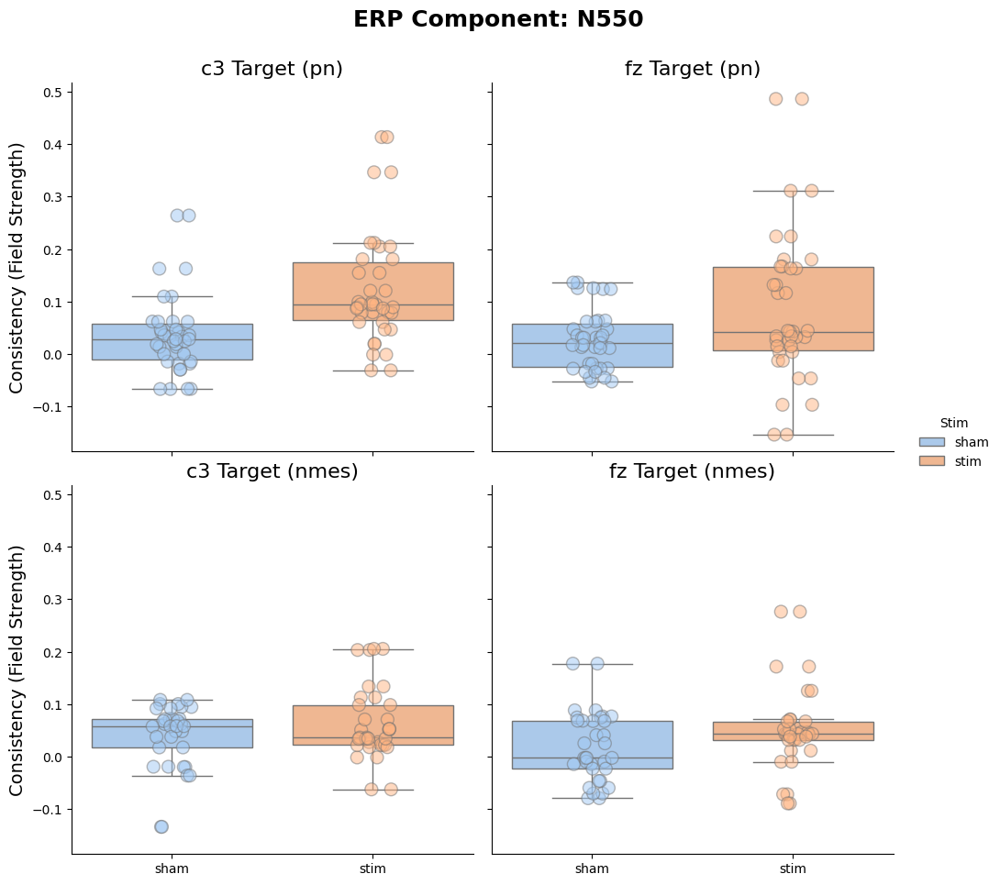

/home/administrator/anaconda3/envs/NDS/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


            Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: Consistency_RMS
No. Observations: 288     Method:             REML           
No. Groups:       20      Scale:              0.0069         
Min. group size:  8       Log-Likelihood:     281.9027       
Max. group size:  16      Converged:          Yes            
Mean group size:  14.4                                       
-------------------------------------------------------------
                   Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------
Intercept           0.034    0.013  2.589 0.010  0.008  0.059
Stim[T.stim]        0.052    0.010  5.316 0.000  0.033  0.071
Mode[T.pn]          0.018    0.010  1.746 0.081 -0.002  0.038
Target_Chan[T.fz]  -0.020    0.010 -2.013 0.044 -0.039 -0.001
Subject Var         0.001    0.008                           



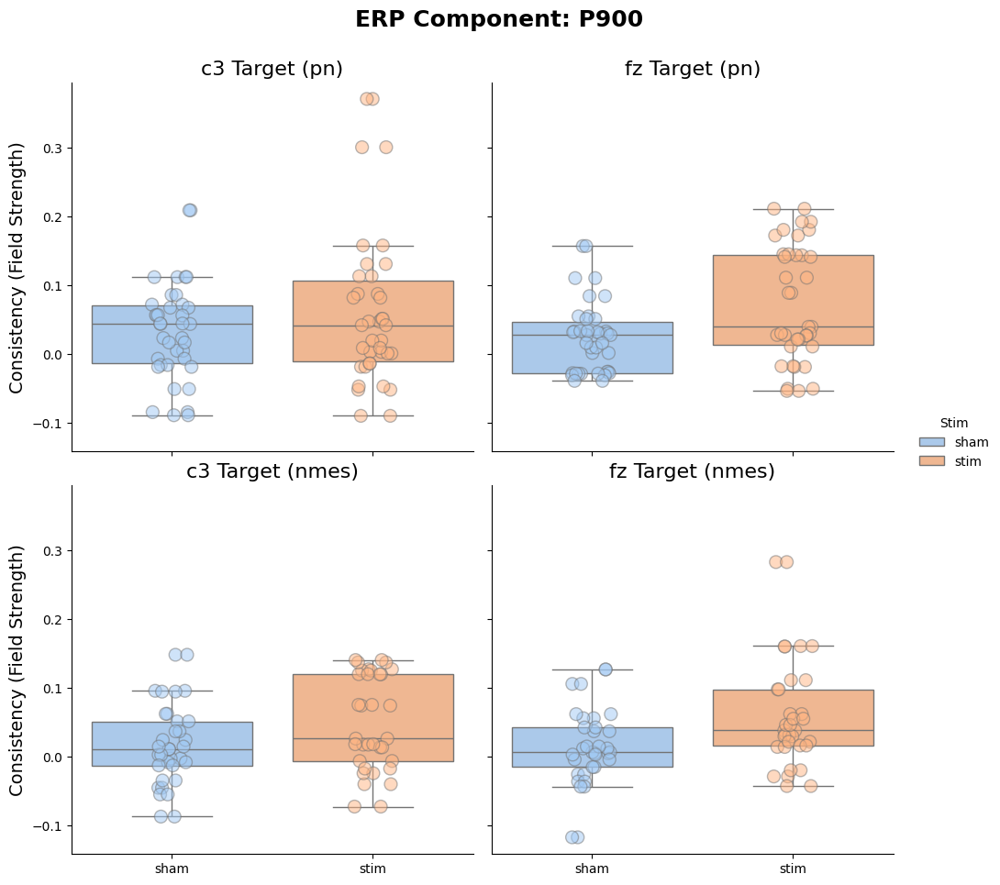

/home/administrator/anaconda3/envs/NDS/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


            Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: Consistency_RMS
No. Observations: 288     Method:             REML           
No. Groups:       20      Scale:              0.0048         
Min. group size:  8       Log-Likelihood:     331.2774       
Max. group size:  16      Converged:          Yes            
Mean group size:  14.4                                       
-------------------------------------------------------------
                     Coef. Std.Err.   z   P>|z| [0.025 0.975]
-------------------------------------------------------------
Intercept            0.025    0.012 2.083 0.037  0.001  0.049
Stim[T.stim]         0.040    0.008 4.855 0.000  0.024  0.055
Mode[T.pn]           0.002    0.009 0.285 0.776 -0.014  0.019
Target_Chan[T.fz]    0.002    0.008 0.280 0.779 -0.014  0.018
Subject Var          0.001    0.010                          



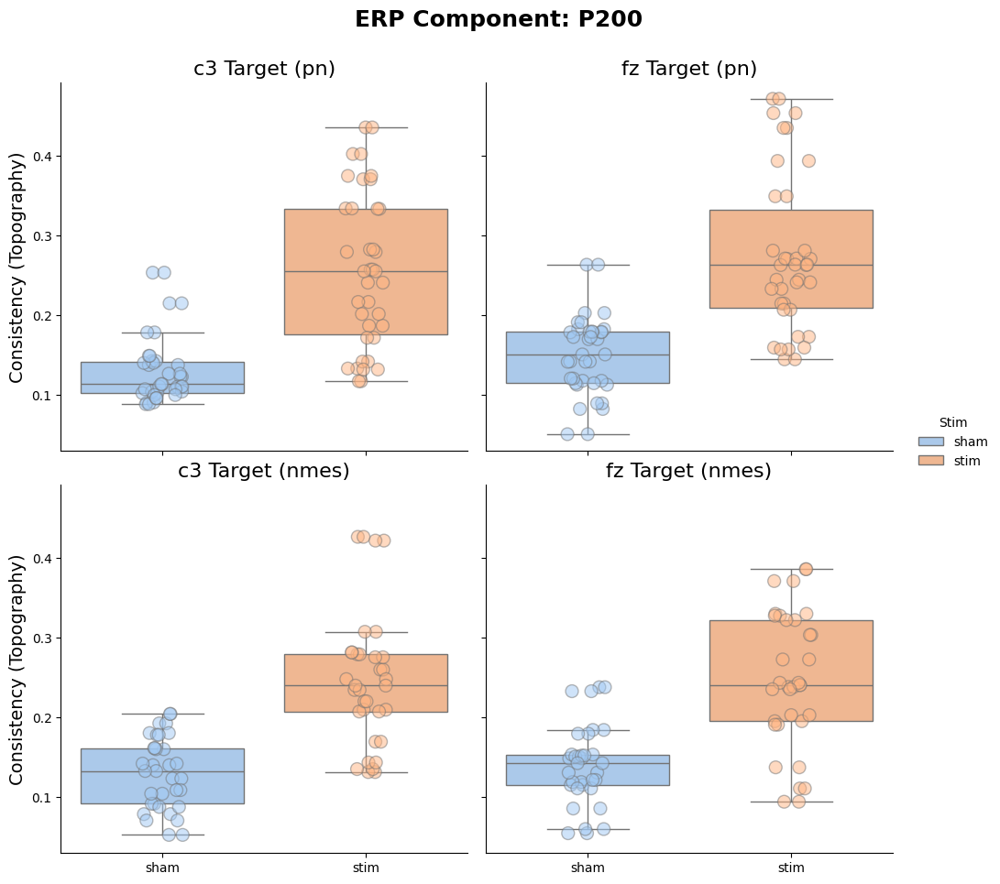

/home/administrator/anaconda3/envs/NDS/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


           Mixed Linear Model Regression Results
Model:              MixedLM Dependent Variable: Consistency
No. Observations:   288     Method:             REML       
No. Groups:         20      Scale:              0.0044     
Min. group size:    8       Log-Likelihood:     344.2786   
Max. group size:    16      Converged:          Yes        
Mean group size:    14.4                                   
-----------------------------------------------------------
                  Coef. Std.Err.   z    P>|z| [0.025 0.975]
-----------------------------------------------------------
Intercept         0.132    0.011 12.207 0.000  0.111  0.153
Stim[T.stim]      0.119    0.008 15.178 0.000  0.104  0.134
Mode[T.pn]        0.005    0.008  0.614 0.540 -0.011  0.021
Target_Chan[T.fz] 0.012    0.008  1.585 0.113 -0.003  0.028
Subject Var       0.001    0.007                           



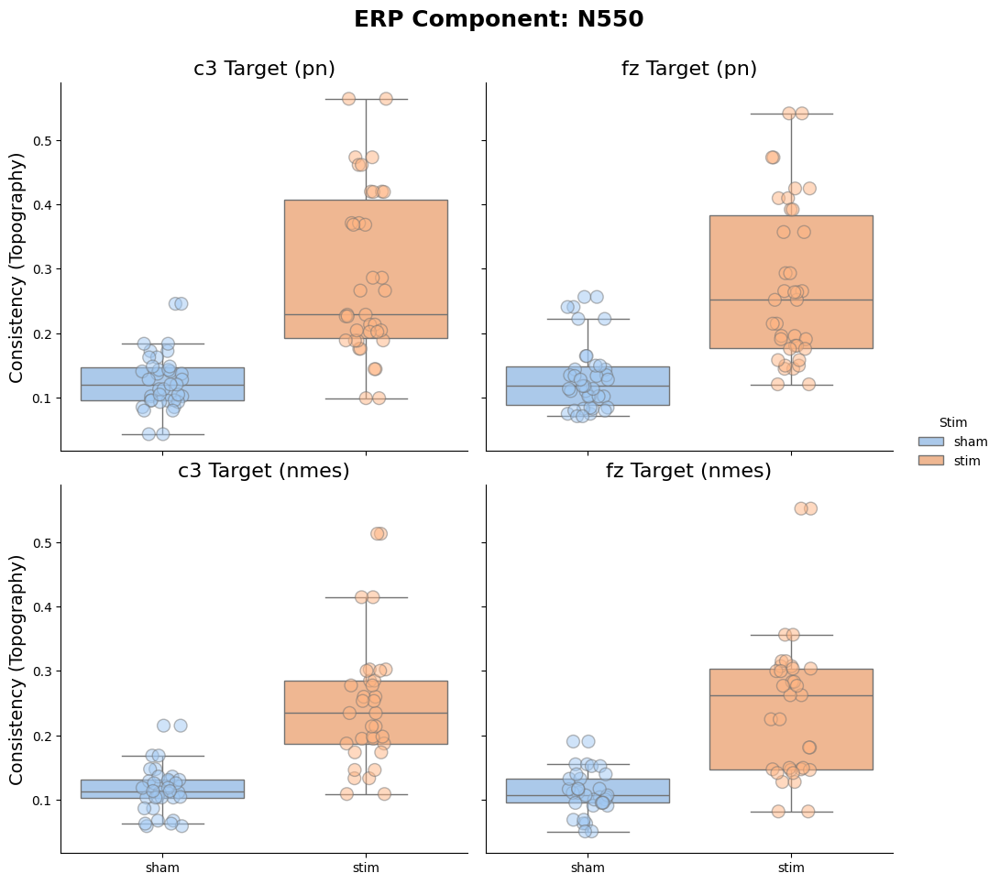

/home/administrator/anaconda3/envs/NDS/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


           Mixed Linear Model Regression Results
Model:             MixedLM  Dependent Variable:  Consistency
No. Observations:  288      Method:              REML       
No. Groups:        20       Scale:               0.0054     
Min. group size:   8        Log-Likelihood:      309.0118   
Max. group size:   16       Converged:           Yes        
Mean group size:   14.4                                     
------------------------------------------------------------
                  Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept          0.118    0.015  8.025 0.000  0.089  0.146
Stim[T.stim]       0.143    0.009 16.426 0.000  0.126  0.160
Mode[T.pn]         0.019    0.009  2.047 0.041  0.001  0.037
Target_Chan[T.fz] -0.004    0.009 -0.502 0.616 -0.021  0.013
Subject Var        0.003    0.014                           



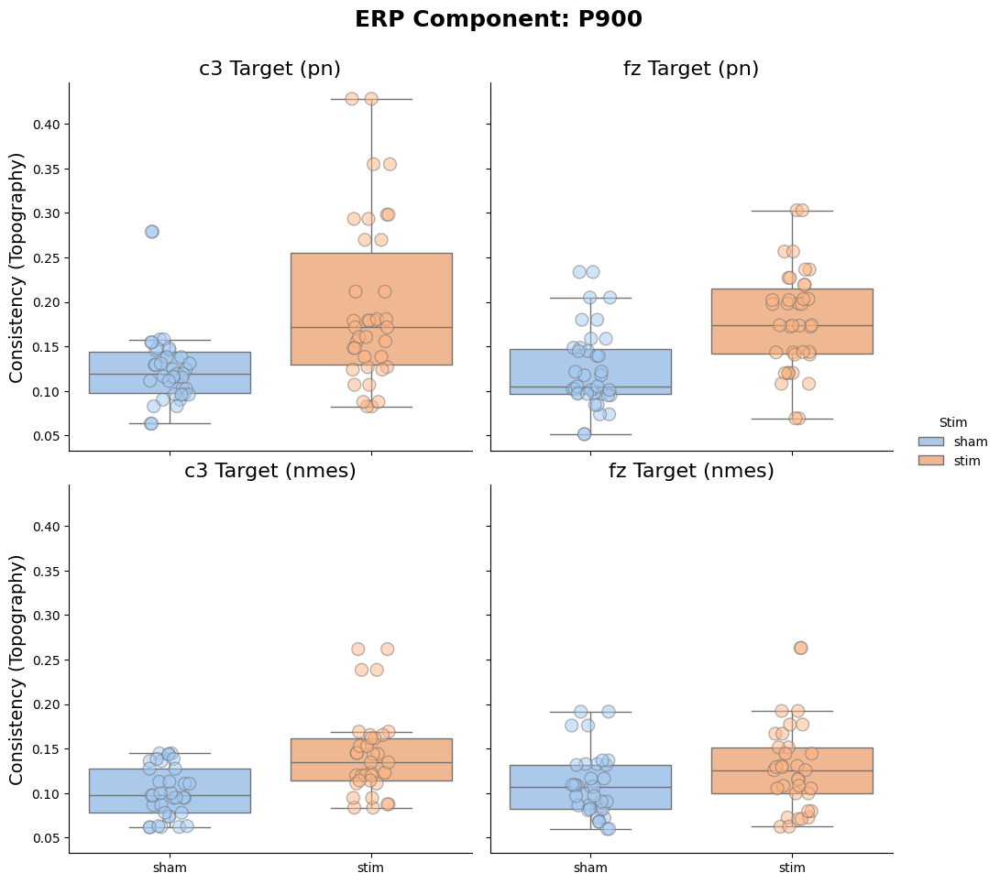

/home/administrator/anaconda3/envs/NDS/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


           Mixed Linear Model Regression Results
Model:             MixedLM  Dependent Variable:  Consistency
No. Observations:  288      Method:              REML       
No. Groups:        20       Scale:               0.0016     
Min. group size:   8        Log-Likelihood:      475.1029   
Max. group size:   16       Converged:           Yes        
Mean group size:   14.4                                     
------------------------------------------------------------
                  Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept          0.108    0.011  9.876 0.000  0.087  0.129
Stim[T.stim]       0.047    0.005 10.030 0.000  0.038  0.056
Mode[T.pn]         0.026    0.005  5.246 0.000  0.016  0.036
Target_Chan[T.fz] -0.006    0.005 -1.316 0.188 -0.015  0.003
Subject Var        0.002    0.017                           



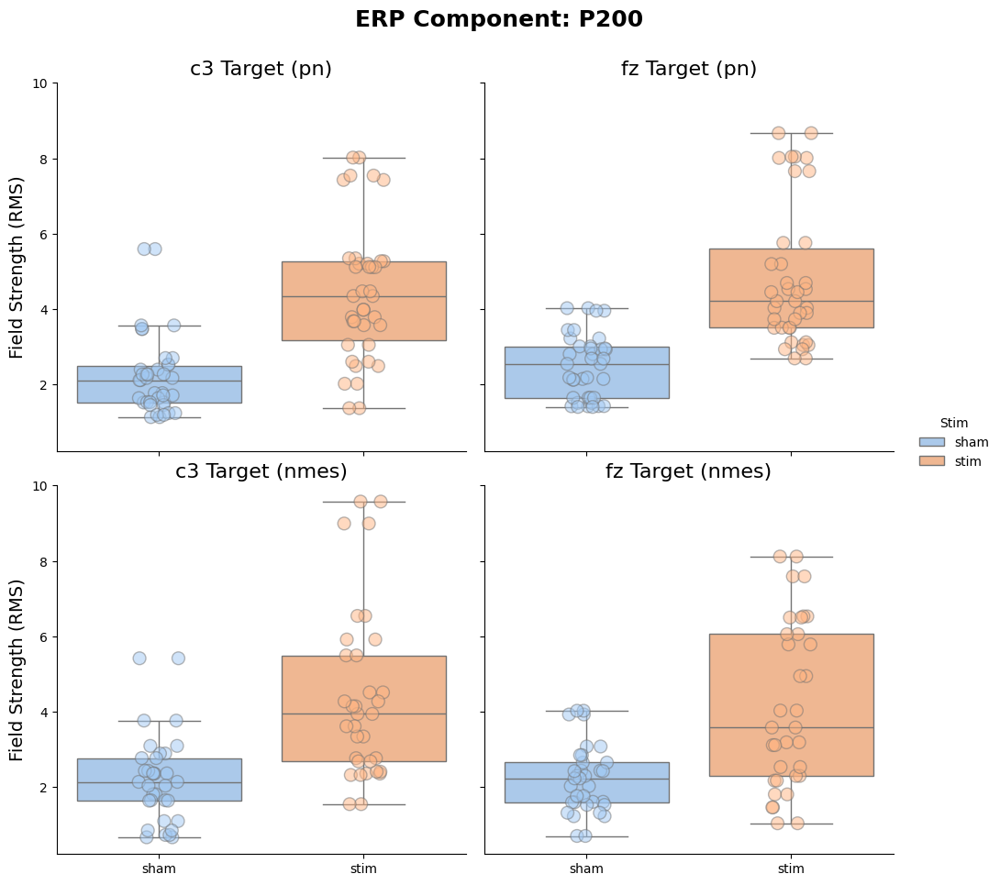

           Mixed Linear Model Regression Results
Model:             MixedLM  Dependent Variable:  RMS_Evoked
No. Observations:  288      Method:              REML      
No. Groups:        20       Scale:               1.7727    
Min. group size:   8        Log-Likelihood:      -513.0974 
Max. group size:   16       Converged:           Yes       
Mean group size:   14.4                                    
-----------------------------------------------------------
                  Coef. Std.Err.   z    P>|z| [0.025 0.975]
-----------------------------------------------------------
Intercept         2.250    0.266  8.457 0.000  1.728  2.771
Stim[T.stim]      2.173    0.157 13.846 0.000  1.865  2.480
Mode[T.pn]        0.073    0.165  0.444 0.657 -0.250  0.397
Target_Chan[T.fz] 0.116    0.157  0.740 0.460 -0.191  0.424
Subject Var       0.874    0.258                           



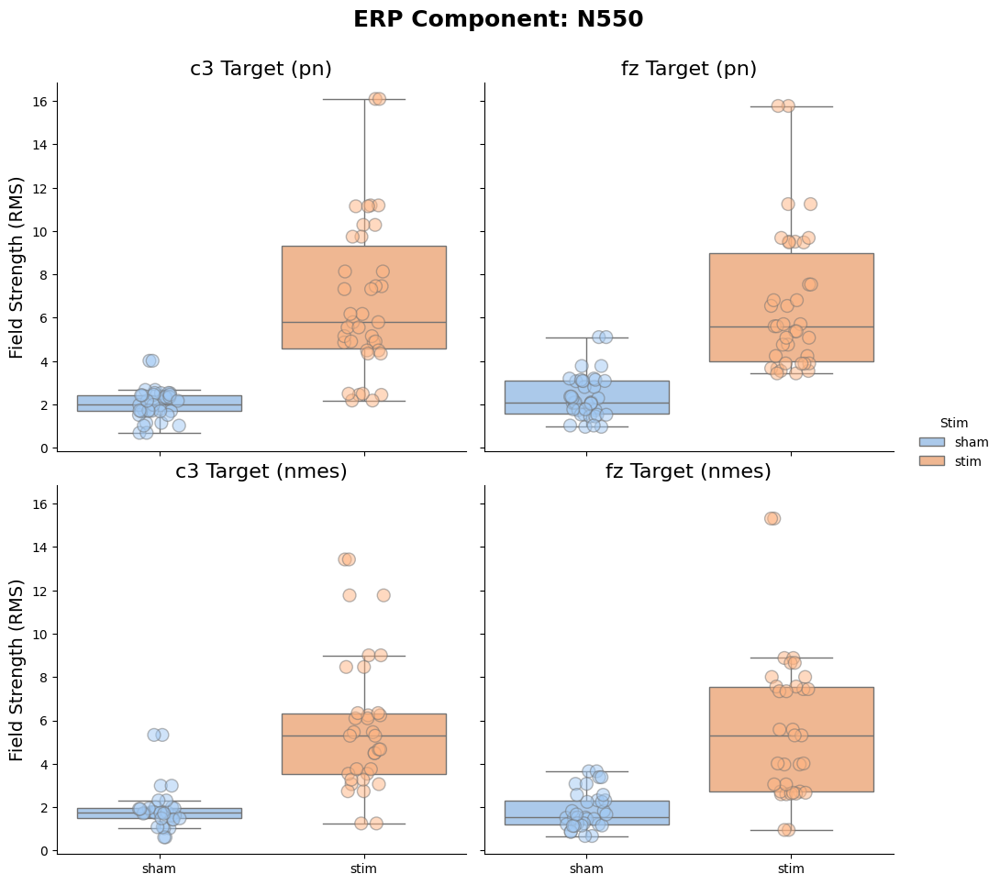

           Mixed Linear Model Regression Results
Model:              MixedLM  Dependent Variable:  RMS_Evoked
No. Observations:   288      Method:              REML      
No. Groups:         20       Scale:               4.7185    
Min. group size:    8        Log-Likelihood:      -647.4234 
Max. group size:    16       Converged:           Yes       
Mean group size:    14.4                                    
------------------------------------------------------------
                  Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept          1.768    0.368  4.806 0.000  1.047  2.488
Stim[T.stim]       4.217    0.256 16.471 0.000  3.715  4.718
Mode[T.pn]         0.594    0.267  2.228 0.026  0.071  1.117
Target_Chan[T.fz] -0.007    0.256 -0.026 0.979 -0.508  0.495
Subject Var        1.283    0.248                           



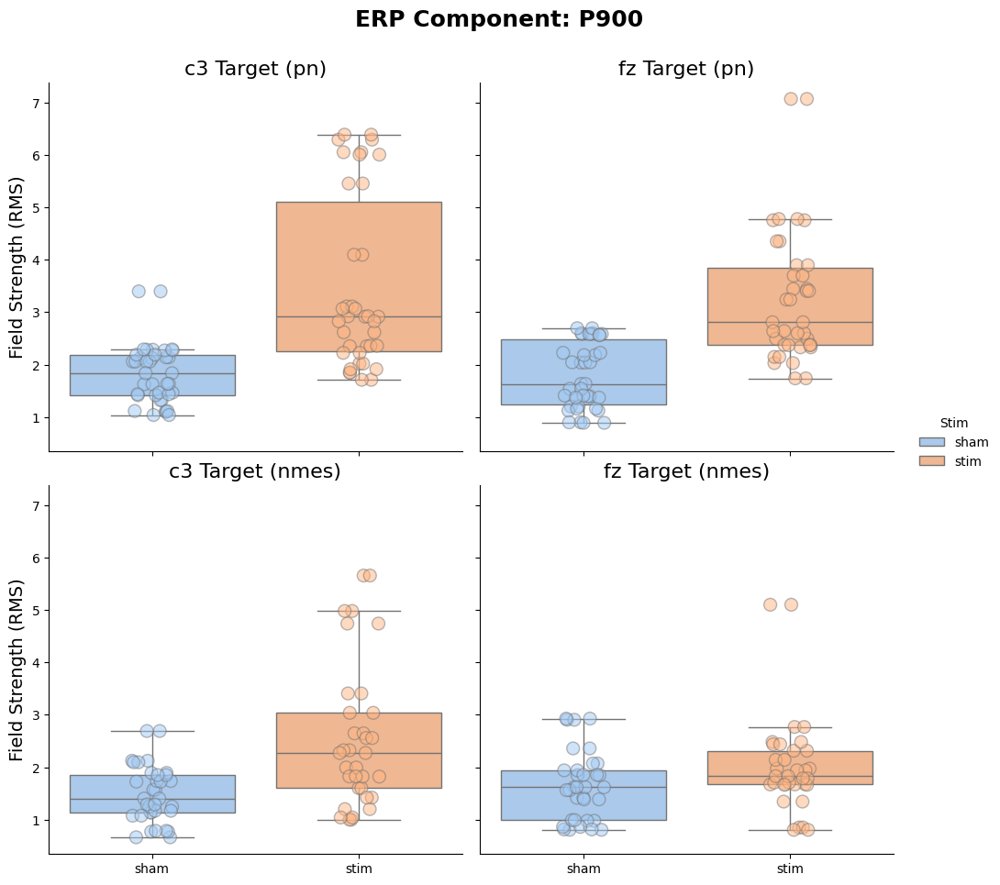

           Mixed Linear Model Regression Results
Model:              MixedLM  Dependent Variable:  RMS_Evoked
No. Observations:   288      Method:              REML      
No. Groups:         20       Scale:               0.7836    
Min. group size:    8        Log-Likelihood:      -396.7673 
Max. group size:    16       Converged:           Yes       
Mean group size:    14.4                                    
------------------------------------------------------------
                  Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept          1.499    0.174  8.609 0.000  1.158  1.841
Stim[T.stim]       1.169    0.104 11.204 0.000  0.964  1.373
Mode[T.pn]         0.573    0.110  5.231 0.000  0.358  0.788
Target_Chan[T.fz] -0.152    0.104 -1.459 0.145 -0.357  0.052
Subject Var        0.368    0.163                           



In [34]:
for col, name in zip(['ERP', 'Consistency_RMS', 'Consistency', 'RMS_Evoked'],
                     ['ERP', 'Consistency (Field Strength)', 'Consistency (Topography)', 'Field Strength (RMS)']):
    # Plotting
    plot_erp_results(df_tct, method=col, name=name)

In [35]:
# Statistic functions
def cluster_stats_rm_anova_3_factors(df_ndpac, target='ndPAC', test='Cluster', factors=['Mode', 'Stim', 'Target_Chan']):
    # Gather unique levels for each factor
    levels = {factor: df_ndpac[factor].unique() for factor in factors}
    num_levels = {factor: len(levels[factor]) for factor in levels}

    # Check if the design exceeds 2 levels per factor
    if any(level > 2 for level in num_levels.values()):
        raise ValueError("This function currently supports only 2 levels per factor.")

    # Initialize a structure to hold contrasts for each combination of factor levels
    contrasts = {level1: {level2: {} for level2 in levels[factors[1]]} for level1 in levels[factors[0]]}

    # Gather subjects present in all levels
    common_subjects = None

    for level1 in levels[factors[0]]:
        level1_common = None
        for level2 in levels[factors[1]]:
            for level3 in levels[factors[2]]:
                df_subset = df_ndpac[(df_ndpac[factors[0]] == level1) & 
                                     (df_ndpac[factors[1]] == level2) & 
                                     (df_ndpac[factors[2]] == level3)]
                grouped = df_subset.groupby(['Subject', 'Chan']).mean(numeric_only=True)[target].unstack()[list(df_ndpac.Chan.unique())]
                if level3 not in contrasts[level1][level2]:
                    contrasts[level1][level2][level3] = grouped
                if level1_common is None:
                    level1_common = set(grouped.index)
                else:
                    level1_common &= set(grouped.index)
        if common_subjects is None:
            common_subjects = level1_common
        else:
            common_subjects &= level1_common

    common_subjects = list(common_subjects)  # Convert to list to ensure consistent indexing
    num_subjects = len(common_subjects)
    num_channels = len(df_ndpac.Chan.unique())

    # Initialize the array with correct dimensions
    data_array = np.zeros((num_levels[factors[0]], num_levels[factors[1]], num_levels[factors[2]], num_subjects, num_channels))
    
    # Populate the array
    for i, level1 in enumerate(contrasts.keys()):
        for j, level2 in enumerate(contrasts[level1].keys()):
            for k, level3 in enumerate(contrasts[level1][level2].keys()):
                # Make sure to index only common subjects
                subset_data = contrasts[level1][level2][level3].loc[common_subjects].values
                data_array[i, j, k] = subset_data

    # Perform the factorial analysis
    reshaped_data = data_array.transpose(3, 0, 1, 2, 4).reshape(num_subjects, -1, num_channels)
    
    if test == 'Cluster':
        full_list = [reshaped_data[:, [i], :].copy() for i in range(reshaped_data.shape[1])]

        def stat_fun(effect):
            def inner_stat_fun(*args):
                result = mne.stats.f_mway_rm(
                    np.swapaxes(args, 1, 0),
                    factor_levels=[num_levels[factors[0]], num_levels[factors[1]], num_levels[factors[2]]],
                    effects=effect,
                    return_pvals=False,
                )[0]
                return result.flatten()
            return inner_stat_fun

        # Create adjacency
        Info = mne.create_info(df_ndpac.Chan.unique().tolist(), sfreq=128, ch_types="eeg")
        Info.set_montage(mne.channels.make_standard_montage('standard_1005'), match_case=False, on_missing="ignore")
        adjacency, ch_names = mne.channels.find_ch_adjacency(Info, 'eeg')
        
        effects = ["A", "B", "C", "A:B", "A:C", "B:C", "A:B:C"]
        effect_labels = factors + [factors[0] + " * " + factors[1], 
                                   factors[0] + " * " + factors[2], 
                                   factors[1] + " * " + factors[2],
                                   factors[0] + " * " + factors[1] + " * " + factors[2]]
        fvals, pvals, clusters_all = [], [], []
        
        for effect in effects:
            pthresh = 0.05
            f_thresh = mne.stats.f_threshold_mway_rm(reshaped_data.shape[0], [num_levels[factors[0]], num_levels[factors[1]], num_levels[factors[2]]], 
                                                     effect, pthresh)
    
            # Perform the permutation cluster test
            F_obs, clusters, cluster_p_values, h0 = mne.stats.permutation_cluster_test(
                full_list,
                stat_fun=stat_fun(effect),
                adjacency=adjacency,
                threshold=f_thresh,
                tail=1,  # f-test, so tail > 0
                n_jobs=-1,
                n_permutations=1024,
                buffer_size=None,
                out_type="mask",
            )
            
            # Append the observed F-values and cluster p-values
            fvals.append(F_obs)
            pvals.append(cluster_p_values)
            clusters_all.append(clusters)
        
        # Plot the results
        plot_cluster_results_3_factors(fvals, pvals, clusters_all, effect_labels, Info, target)

    else:
        fvals, pvals = mne.stats.f_mway_rm(reshaped_data, factor_levels=[num_levels[factors[0]], num_levels[factors[1]], num_levels[factors[2]]], effects="A*B*C")
        effect_labels = factors + [factors[0] + " * " + factors[1], 
                                   factors[0] + " * " + factors[2], 
                                   factors[1] + " * " + factors[2],
                                   factors[0] + " * " + factors[1] + " * " + factors[2]]
        plot_effects_3_factors(fvals, pvals, effect_labels, df_ndpac)

def plot_cluster_results_3_factors(fvals, pvals, clusters_all, effect_labels, Info, target):
    fig, axes = plt.subplots(2, 4, figsize=(15, 10), sharey=True, layout="constrained")
    axes = axes.flatten()
    for fval, pval, clusters, effect_label, ax in zip(fvals, pvals, clusters_all, effect_labels, axes):
        if len(pval) == 0 or all(pval > 0.05):
            im, cn = mne.viz.plot_topomap(fval.squeeze(), 
                                          pos=Info, 
                                          contours=1,
                                          mask=None,
                                          mask_params=dict(markersize=6, markerfacecolor='y'),
                                          sensors=False, 
                                          axes=ax, 
                                          show=False,
                                          names=None, 
                                          )
        else:
            im, cn = mne.viz.plot_topomap(fval.squeeze(), 
                                          pos=Info, 
                                          contours=1,
                                          mask=clusters[pval.argmin()].squeeze(),
                                          #mask=clusters[np.argsort(pval)[1]].squeeze(),
                                          mask_params=dict(markersize=6, markerfacecolor='y'),
                                          sensors=False, 
                                          axes=ax, 
                                          show=False,
                                          names=None, 
                                          )
        #ax.set_title(f"{effect_label} (p < 0.05)")
        ax.set_title(f"{effect_label}")
        # Add a colorbar
        cbar = plt.colorbar(ax.images[-1], ax=ax, orientation="horizontal")
        cbar.set_label("F-values")

    # Hide any remaining empty subplots
    for ax in axes[len(fvals):]:
        ax.axis('off')
        
    fig.suptitle(f'{target} rmANOVA Cluster Test', fontsize=18)

def plot_effects_3_factors(fvals, pvals, effect_labels, ndpac_df):
    Info = mne.create_info(ndpac_df.Chan.unique().tolist(), sfreq=128, ch_types="eeg")
    Info.set_montage(mne.channels.make_standard_montage('standard_1005'), 
                     match_case=False, on_missing="ignore")
    
    fig, axes = plt.subplots(2, 4, figsize=(15, 10), sharey=True, layout="constrained")
    axes = axes.flatten()
    for effect, pval, effect_label, ax in zip(fvals, pvals, effect_labels, axes):
        masks, _ = mne.stats.fdr_correction(pval)
        mne.viz.plot_topomap(effect, 
                             pos=Info, 
                             vlim=(0, 20),
                             contours=False,
                             mask=masks, 
                             mask_params=dict(markersize=6, markerfacecolor='y'), 
                             axes=ax, sensors=False, show=False)
        #ax.set_title(f"{effect_label} (p < 0.05)")
        ax.set_title(f"{effect_label}")
        # Add a colorbar
        cbar = plt.colorbar(ax.images[-1], ax=ax, orientation="horizontal")
        cbar.set_label("F-values")

def cluster_stats_rm_anova(df_ndpac, target='ndPAC', test='Cluster', factors=['Mode', 'Stim', 'Mode * Stim']):
    # Gather unique levels for each factor
    levels = {factor: df_ndpac[factor].unique() for factor in factors[:2]}  # Only need first two factors for levels
    num_levels = {factor: len(levels[factor]) for factor in levels}

    # Initialize a structure to hold contrasts for each combination of factor levels
    contrasts = {level: {} for level in levels[factors[0]]}
    
    # Gather subjects present in all levels
    common_subjects = None

    for level1 in levels[factors[0]]:
        level1_common = None
        for level2 in levels[factors[1]]:
            df_subset = df_ndpac[(df_ndpac[factors[0]] == level1) & (df_ndpac[factors[1]] == level2)]
            grouped = df_subset.groupby(['Subject', 'Chan']).mean(numeric_only=True)[target].unstack()[list(df_ndpac.Chan.unique())]
            contrasts[level1][level2] = grouped
            if level1_common is None:
                level1_common = set(grouped.index)
            else:
                level1_common &= set(grouped.index)
        if common_subjects is None:
            common_subjects = level1_common
        else:
            common_subjects &= level1_common

    common_subjects = list(common_subjects)  # Convert to list to ensure consistent indexing
    num_subjects = len(common_subjects)
    num_channels = len(df_ndpac.Chan.unique())

    # Initialize the array with correct dimensions
    data_array = np.zeros((num_levels[factors[0]], num_levels[factors[1]], num_subjects, num_channels))
    
    # Populate the array
    for i, level1 in enumerate(contrasts.keys()):
        for j, level2 in enumerate(levels[factors[1]]):
            # Make sure to index only common subjects
            subset_data = contrasts[level1][level2].loc[common_subjects].values
            data_array[i, j] = subset_data

    # Perform the factorial analysis
    reshaped_data = data_array.transpose(2, 0, 1, 3).reshape(num_subjects, -1, num_channels)
    
    if test == 'Cluster':
        full_list = [reshaped_data[:, [i], :].copy() for i in range(reshaped_data.shape[1])]

        def stat_fun(effect):
            def inner_stat_fun(*args):
                result = mne.stats.f_mway_rm(
                    np.swapaxes(args, 1, 0),
                    factor_levels=[num_levels[factors[0]], num_levels[factors[1]]],
                    effects=effect,
                    return_pvals=False,
                )[0]
                return result.flatten()
            return inner_stat_fun

        # Create adjacency
        Info = mne.create_info(df_ndpac.Chan.unique().tolist(), sfreq=128, ch_types="eeg")
        Info.set_montage(mne.channels.make_standard_montage('standard_1005'), match_case=False, on_missing="ignore")
        adjacency, ch_names = mne.channels.find_ch_adjacency(Info, 'eeg')
        
        effects = ["A", "B", "A:B"]
        effect_labels = factors[:3]  # ["Mode", "Stim", "Mode x Stim"]
        fvals, pvals, clusters_all = [], [], []
        
        for effect in effects:
            pthresh = 0.05
            f_thresh = mne.stats.f_threshold_mway_rm(reshaped_data.shape[0], [num_levels[factors[0]], num_levels[factors[1]]], 
                                                     effect, pthresh)
            
            # Perform the permutation cluster test
            F_obs, clusters, cluster_p_values, h0 = mne.stats.permutation_cluster_test(
                full_list,
                stat_fun=stat_fun(effect),
                adjacency=adjacency,
                threshold=f_thresh,
                tail=1,  # f-test, so tail > 0
                n_jobs=-1,
                n_permutations=1024,
                buffer_size=None,
                out_type="mask",
            )
            
            # Correct nans (if any)
            if np.any(np.isnan(F_obs)):
                # Prepare the data as EvokedArray (assuming F_obs is a 2D array: [n_channels, n_conditions])
                F_obs_array = np.atleast_2d(F_obs).T  # Transpose to fit (n_channels, n_times)
                evoked = mne.EvokedArray(F_obs_array, Info)
                
                # Mark channels with NaNs as bad
                bad_channels = [ch for ch, values in zip(Info['ch_names'], F_obs_array) if np.isnan(values).all()]
                evoked.info['bads'] = bad_channels
                
                # Interpolate bad channels
                evoked.interpolate_bads(reset_bads=False)
                
                # Extract the interpolated data
                F_obs = np.abs(evoked.data.T)
                        
            # Append the observed F-values and cluster p-values
            fvals.append(F_obs)
            pvals.append(cluster_p_values)
            clusters_all.append(clusters)
        
        # Plot the results
        plot_cluster_results(fvals, pvals, clusters_all, effect_labels, Info, target)

    else:
        fvals, pvals = mne.stats.f_mway_rm(reshaped_data, factor_levels=[num_levels[factors[0]], num_levels[factors[1]]], effects="A*B")
        effect_labels = factors[:3]  # ["Mode", "Stim", "Mode x Stim"]
        plot_effects(fvals, pvals, effect_labels, df_ndpac)

def plot_cluster_results(fvals, pvals, clusters_all, effect_labels, Info, target):
    fig, axes = plt.subplots(1, 3, figsize=(10, 5), sharey=True, layout="constrained")
    for fval, pval, clusters, effect_label, ax in zip(fvals, pvals, clusters_all, effect_labels, axes):
        if len(pval) == 0 or all(pval > 0.05):
            im, cn = mne.viz.plot_topomap(fval.squeeze(), 
                                          pos=Info, 
                                          contours=1,
                                          mask=None,
                                          mask_params=dict(markersize=6, markerfacecolor='y'),
                                          sensors=False, 
                                          axes=ax, 
                                          show=False,
                                          names=None, 
                                          )
        else:
            im, cn = mne.viz.plot_topomap(fval.squeeze(), 
                                          pos=Info, 
                                          contours=1,
                                          mask=clusters[pval.argmin()].squeeze(),
                                          mask_params=dict(markersize=6, markerfacecolor='y'),
                                          sensors=False, 
                                          axes=ax, 
                                          show=False,
                                          names=None, 
                                          )
        ax.set_title(f"{effect_label} (p < 0.05)")
        # Add a colorbar
        cbar = plt.colorbar(ax.images[-1], ax=ax, orientation="horizontal")
        cbar.set_label("F-values")
    fig.suptitle(f'{target} rmANOVA Cluster Test', fontsize=18)

def plot_effects(fvals, pvals, effect_labels, ndpac_df):
    Info = mne.create_info(ndpac_df.Chan.unique().tolist(), sfreq=128, ch_types="eeg")
    Info.set_montage(mne.channels.make_standard_montage('standard_1005'), 
                     match_case=False, on_missing="ignore")
    
    fig, axes = plt.subplots(1, 3, figsize=(10, 5), sharey=True, layout="constrained")
    for effect, pval, effect_label, ax in zip(fvals, pvals, effect_labels, axes):
        masks, _ = mne.stats.fdr_correction(pval)
        mne.viz.plot_topomap(effect, 
                             pos=Info, 
                             vlim=(0, 20),
                             contours=False,
                             mask=masks, 
                             mask_params=dict(markersize=6, markerfacecolor='y'), 
                             axes=ax, sensors=False, show=False)
        ax.set_title(f"{effect_label} (p < 0.05)")
        # Add a colorbar
        cbar = plt.colorbar(ax.images[-1], ax=ax, orientation="horizontal")
        cbar.set_label("F-values")

### C.1. Spectral Analysis

In [19]:
# Load PSD data
df_power = pd.read_csv(os.path.join(stats_path, 'df_power.csv'), index_col=0)
df_power = drop_bads_df(df_power)
df_power

,Subject,Night,Mode,Chan,Delta,Theta,Alpha,Sigma,Beta,Gamma,TotalAbsPow,FreqRes,Relative,Offset,Aperiodic,Stim,Target_Chan
0,LiFe,1,pn,Fp1,17441.037373,680.052103,346.080671,165.934065,70.620979,32.747914,19382.672823,0.748538,False,4.042741,2.386019,sham,c3
1,LiFe,1,pn,Fpz,22904.305009,957.598181,430.041816,161.912534,91.999235,48.804265,25428.928119,0.748538,False,4.336125,2.579603,sham,c3
2,LiFe,1,pn,Fp2,43956.973219,1449.853537,647.082031,215.841321,105.801421,49.481574,47665.599170,0.748538,False,4.448924,2.541904,sham,c3
3,LiFe,1,pn,F7,6947.935641,342.504318,221.213377,94.609371,65.591388,29.284466,7996.214414,0.748538,False,3.533569,2.070496,sham,c3
4,LiFe,1,pn,F3,27649.892942,1197.805438,647.823052,293.175182,134.431112,57.620623,31014.168231,0.748538,False,4.456873,2.547047,sham,c3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9979,AnSt,1,nmes,FT8,16410.382248,1121.354812,529.609465,177.697589,149.512095,50.573787,19213.041180,0.748538,False,4.290885,2.392543,stim,fz
9980,AnSt,1,nmes,TP7,17156.949725,1007.322568,482.413730,192.093699,178.922299,77.845490,19780.882868,0.748538,False,4.207989,2.299851,stim,fz
9981,AnSt,1,nmes,TP8,13103.481099,1336.880089,670.054919,218.976681,200.732371,45.340231,16537.597369,0.748538,False,4.535392,2.566781,stim,fz
9982,AnSt,1,nmes,PO7,13548.532278,1345.828297,637.682183,307.882012,152.786354,47.309890,16931.091760,0.748538,False,4.407029,2.477767,stim,fz


pn stim - sham c3


ValueError: No channels match the selection.

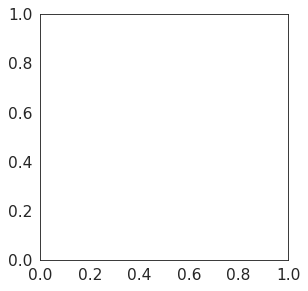

In [25]:
# Loop over modes, stimulation types, and target channels
for mode in df_power.Mode.unique():
    for target in df_power.Target_Chan.unique():
        # Separate stim and sham conditions
        df_stim = df_power[(df_power.Mode == mode) & (df_power.Stim == 'stim') & (df_power.Target_Chan == target)]
        df_sham = df_power[(df_power.Mode == mode) & (df_power.Stim == 'sham') & (df_power.Target_Chan == target)]
        
        # Filter to ensure balanced subjects
        df_stim = df_stim.groupby(['Subject']).filter(lambda x: len(x) == 2)
        df_sham = df_sham.groupby(['Subject']).filter(lambda x: len(x) == 2)
        
        # Group by channel and calculate the mean
        df_stim = df_stim.groupby('Chan').mean(numeric_only=True).reset_index()
        df_sham = df_sham.groupby('Chan').mean(numeric_only=True).reset_index()

        # Merge the two dataframes on 'Chan' to align channels before subtraction
        df_merged = pd.merge(df_stim, df_sham, on='Chan', suffixes=('_stim', '_sham'))
       
        # Calculate the difference: stim - sham, while retaining channel names
        df_merged['Sigma_diff'] = np.log10(df_merged['Sigma_stim']) - np.log10(df_merged['Sigma_sham'])
        
        # Prepare the dataframe for topoplot
        df_diff = df_merged[['Chan', 'Sigma_diff']].rename(columns={'Sigma_diff': 'Sigma'})
              
        print(f"{mode} stim - sham {target}")
        # Plot the difference using yasa.topoplot
        yasa.topoplot(df_diff.set_index('Chan')['Sigma'])
        plt.show()

### C.2. Time Frequency Analysis

In [50]:
# Load TFR data
df_tfr = pd.read_pickle(os.path.join(stats_path, 'df_tfr.p'))
df_tfr = drop_bads_df(df_tfr)

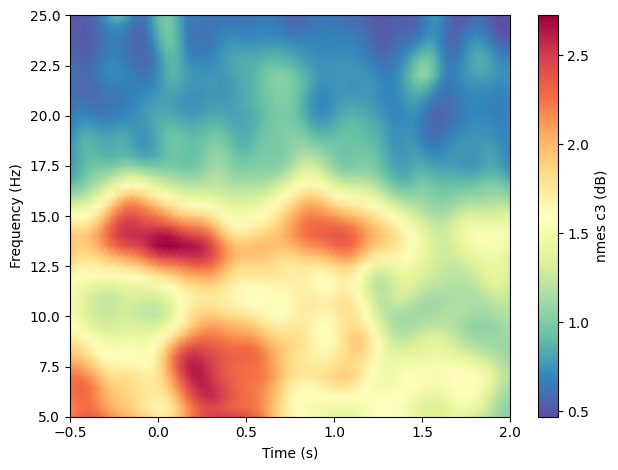

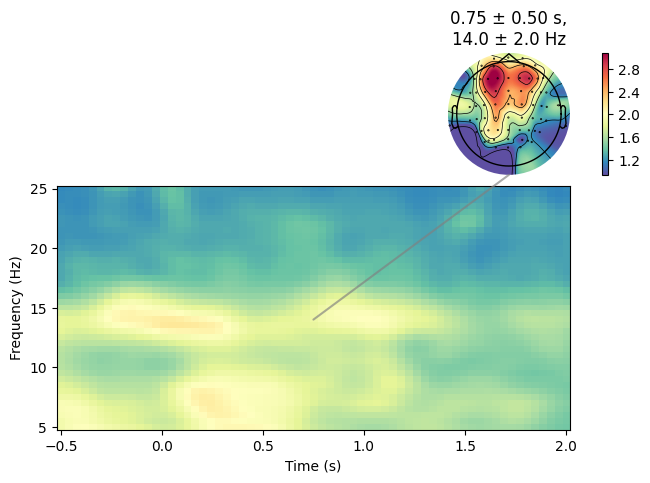

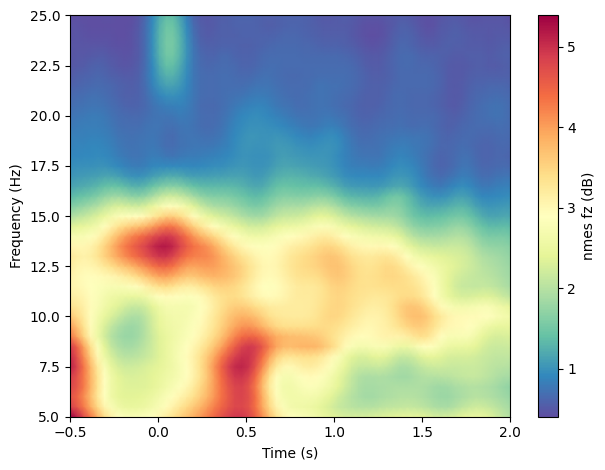

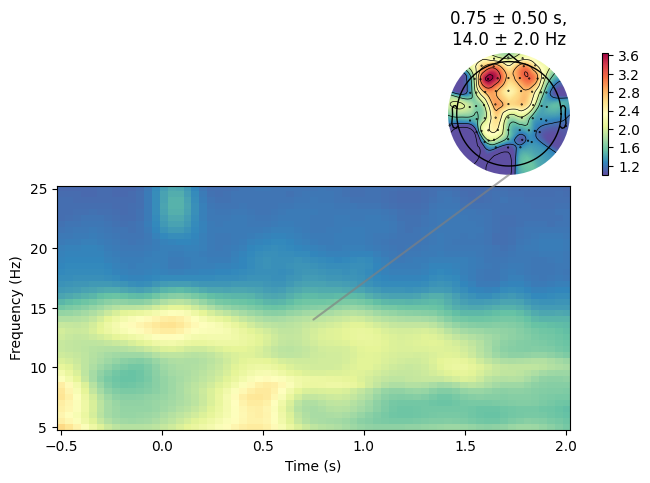

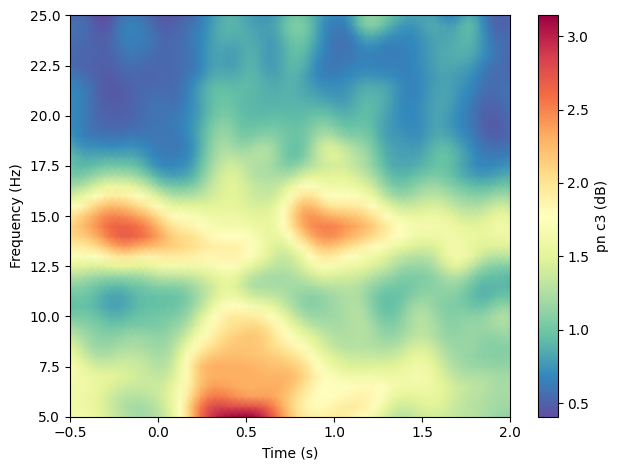

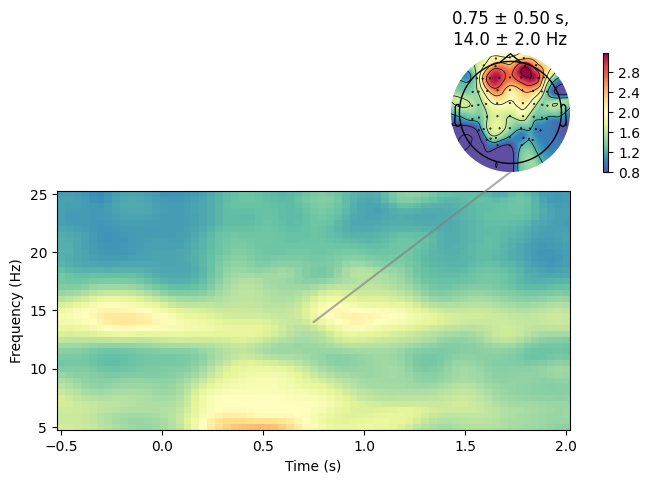

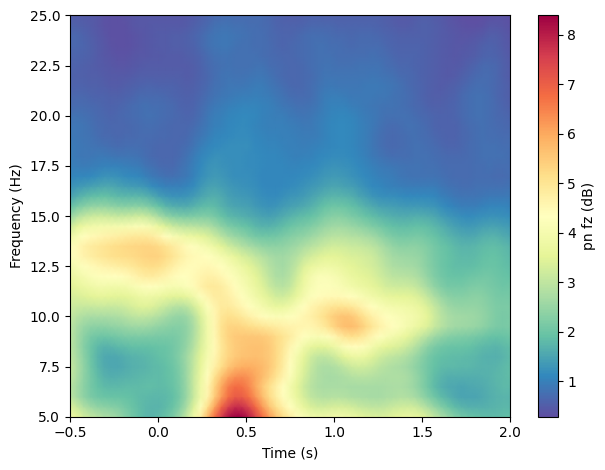

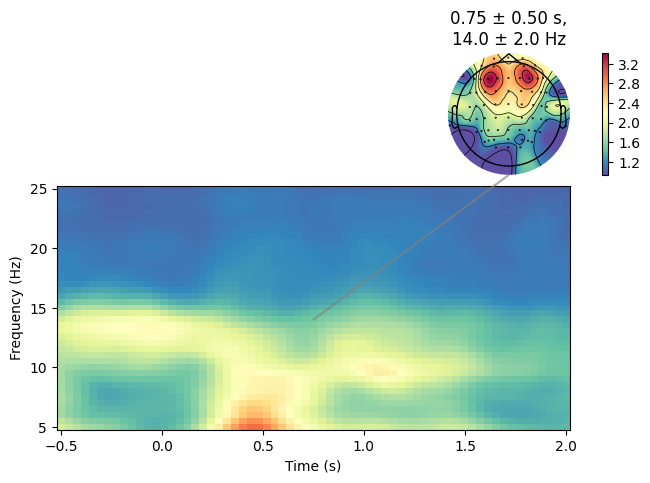

In [53]:
def plot_tfr_gav(df):
    for (mode, target), tfr_gav in df.groupby(['Mode','Target_chan']):
        
        gavs = list(tfr_gav['TFR'])
        
        if target == 'c3':
            coi = 'C3'
        else:
            coi = 'Fz'
            
        Sxx_ = np.concatenate([gavs[idx].copy().crop(tmin=-0.5, tmax=2).pick(coi).data 
                              #[gavs[idx].copy().crop(tmin=-0.5, tmax=2).data.mean(0, keepdims=True)#.pick('Fz').data 
                               for idx in range(len(gavs))], 0)
        con = np.concatenate([np.expand_dims(gavs[idx].copy().crop(tmin=-0.5, tmax=2).data, 0) 
                              for idx in range(len(gavs))], 0)
        times = gavs[0].copy().crop(tmin=-0.5, tmax=2).times
        freqs = gavs[0].freqs
        
        fig, ax = plt.subplots()
        vmin, vmax = np.percentile(Sxx_, [0 + 2.5, 100 - 2.5])
        norm = Normalize(vmin=vmin, vmax=vmax)
        CM = ax.pcolormesh(times, freqs, Sxx_.mean(0).squeeze(), 
                           shading='gouraud', cmap='Spectral_r', 
                           rasterized = True, antialiased=True, 
                           #norm=norm
                           )
        ax.set_ylabel('Frequency (Hz)')
        ax.set_xlabel('Time (s)')
        cbar = plt.colorbar(CM, ax=ax)
        cbar.set_label(f'{mode} {target} (dB)')
        plt.tight_layout()
                   
        # Plotting with MNE      
        mne.grand_average(gavs).plot_joint(baseline=None, picks=coi, 
                                           cmap='Spectral_r', vlim=(vmin,vmax),
                                           tmin=-0.5, tmax=2, mode='mean',
                                           #timefreqs={(1, 13): (1, 4)})
                                           timefreqs={(.75, 14): (1, 4)})

plot_tfr_gav(df_tfr)

### D. Complexity Analysis

#### D1. PCI complexity

In [29]:
# Load PCI data
df_pci = pd.read_pickle(stats_path + 'df_pci.p')
df_pci = drop_bads_df(df_pci)
df_pci.reset_index(drop=True, inplace=True)

In [30]:
df_pci.columns

Index(['Subject', 'Night', 'Target_chan', 'Mode', 'Latency', 'PCI'], dtype='object')

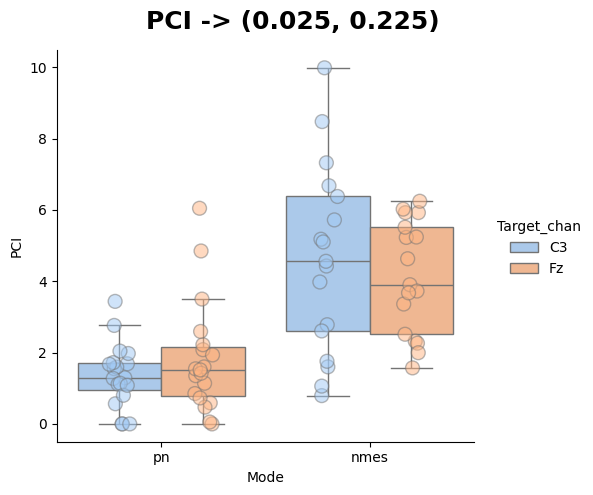

           Mixed Linear Model Regression Results
Model:               MixedLM  Dependent Variable:  PCI      
No. Observations:    72       Method:              REML     
No. Groups:          20       Scale:               2.9822   
Min. group size:     2        Log-Likelihood:      -142.0805
Max. group size:     4        Converged:           Yes      
Mean group size:     3.6                                    
------------------------------------------------------------
                  Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept          4.364    0.370 11.782 0.000  3.638  5.090
Mode[T.pn]        -2.788    0.410 -6.803 0.000 -3.591 -1.985
Target_chan[T.Fz]  0.012    0.407  0.030 0.976 -0.786  0.810
Subject Var        0.138    0.207                           



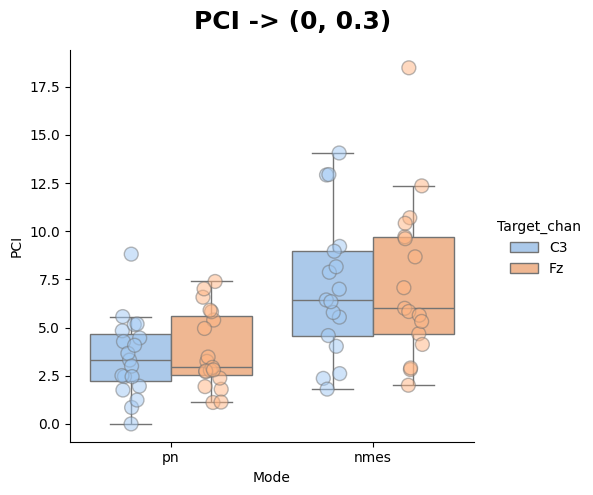

           Mixed Linear Model Regression Results
Model:               MixedLM  Dependent Variable:  PCI      
No. Observations:    72       Method:              REML     
No. Groups:          20       Scale:               7.3707   
Min. group size:     2        Log-Likelihood:      -178.0646
Max. group size:     4        Converged:           Yes      
Mean group size:     3.6                                    
------------------------------------------------------------
                  Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept          7.094    0.653 10.858 0.000  5.814  8.375
Mode[T.pn]        -3.635    0.653 -5.564 0.000 -4.916 -2.355
Target_chan[T.Fz]  0.340    0.640  0.531 0.595 -0.914  1.594
Subject Var        1.930    0.529                           



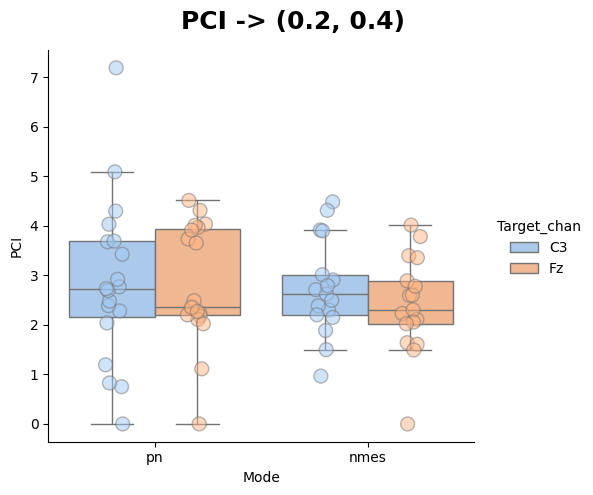

           Mixed Linear Model Regression Results
Model:               MixedLM  Dependent Variable:  PCI      
No. Observations:    72       Method:              REML     
No. Groups:          20       Scale:               1.5103   
Min. group size:     2        Log-Likelihood:      -117.7589
Max. group size:     4        Converged:           Yes      
Mean group size:     3.6                                    
------------------------------------------------------------
                  Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept          2.667    0.259 10.284 0.000  2.159  3.176
Mode[T.pn]         0.266    0.291  0.913 0.361 -0.305  0.837
Target_chan[T.Fz] -0.185    0.290 -0.638 0.523 -0.753  0.383
Subject Var        0.028    0.132                           



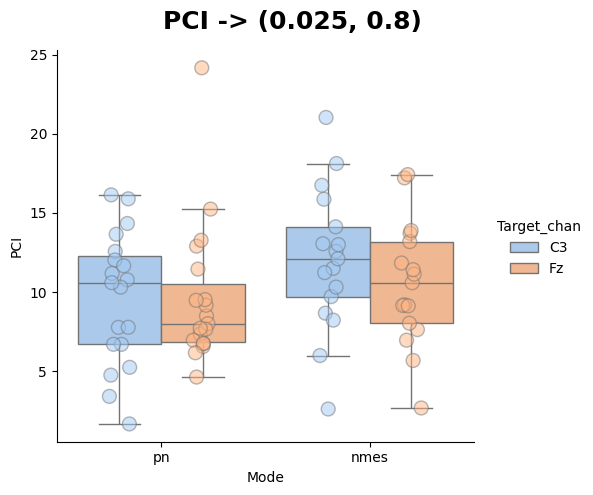

           Mixed Linear Model Regression Results
Model:               MixedLM  Dependent Variable:  PCI      
No. Observations:    72       Method:              REML     
No. Groups:          20       Scale:               17.3196  
Min. group size:     2        Log-Likelihood:      -202.6560
Max. group size:     4        Converged:           Yes      
Mean group size:     3.6                                    
------------------------------------------------------------
                  Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept         11.709    0.902 12.984 0.000  9.942 13.477
Mode[T.pn]        -1.729    1.001 -1.727 0.084 -3.690  0.233
Target_chan[T.Fz] -0.750    0.981 -0.764 0.445 -2.672  1.173
Subject Var        0.732    0.550                           



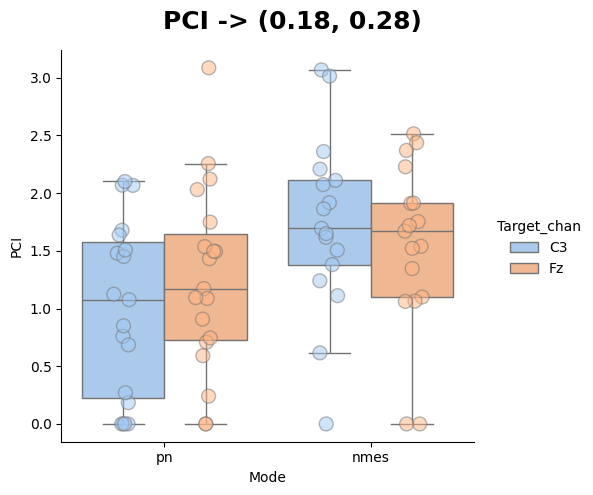

           Mixed Linear Model Regression Results
Model:              MixedLM   Dependent Variable:   PCI     
No. Observations:   72        Method:               REML    
No. Groups:         20        Scale:                0.5154  
Min. group size:    2         Log-Likelihood:       -84.1625
Max. group size:    4         Converged:            Yes     
Mean group size:    3.6                                     
------------------------------------------------------------
                  Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept          1.613    0.164  9.860 0.000  1.293  1.934
Mode[T.pn]        -0.513    0.172 -2.986 0.003 -0.849 -0.176
Target_chan[T.Fz]  0.042    0.169  0.251 0.802 -0.289  0.374
Subject Var        0.078    0.110                           



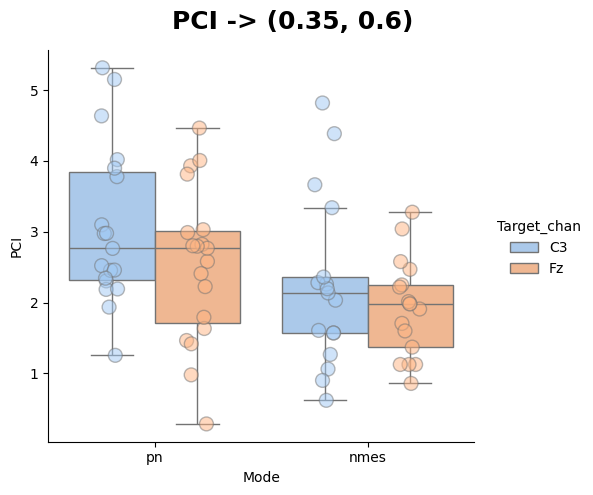

           Mixed Linear Model Regression Results
Model:               MixedLM  Dependent Variable:  PCI      
No. Observations:    72       Method:              REML     
No. Groups:          20       Scale:               0.8789   
Min. group size:     2        Log-Likelihood:      -104.0781
Max. group size:     4        Converged:           Yes      
Mean group size:     3.6                                    
------------------------------------------------------------
                  Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept          2.338    0.223 10.464 0.000  1.900  2.776
Mode[T.pn]         0.674    0.227  2.967 0.003  0.229  1.119
Target_chan[T.Fz] -0.431    0.221 -1.949 0.051 -0.864  0.002
Subject Var        0.200    0.181                           



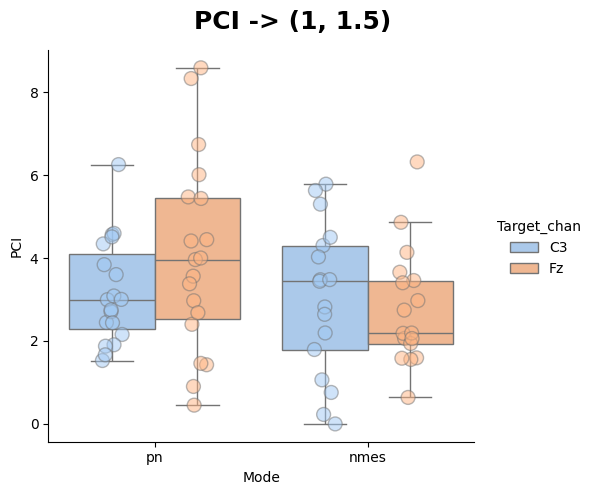

/home/administrator/anaconda3/envs/NDS/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


          Mixed Linear Model Regression Results
Model:             MixedLM  Dependent Variable:  PCI      
No. Observations:  72       Method:              REML     
No. Groups:        20       Scale:               3.1231   
Min. group size:   2        Log-Likelihood:      -142.2233
Max. group size:   4        Converged:           Yes      
Mean group size:   3.6                                    
----------------------------------------------------------
                  Coef. Std.Err.   z   P>|z| [0.025 0.975]
----------------------------------------------------------
Intercept         2.735    0.368 7.434 0.000  2.014  3.456
Mode[T.pn]        0.697    0.417 1.670 0.095 -0.121  1.514
Target_chan[T.Fz] 0.341    0.417 0.819 0.413 -0.475  1.158
Subject Var       0.000    0.183                          



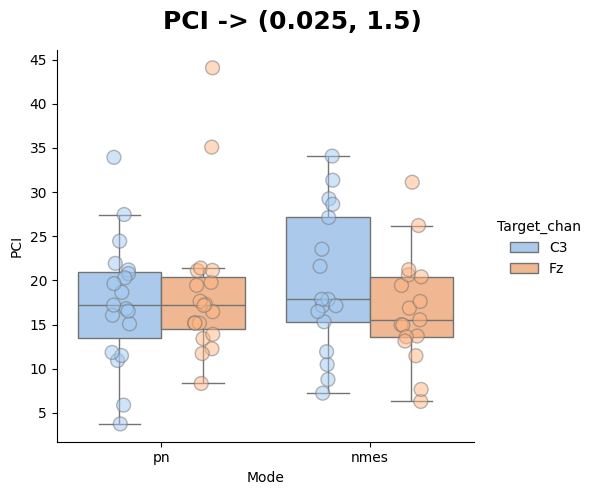

           Mixed Linear Model Regression Results
Model:               MixedLM  Dependent Variable:  PCI      
No. Observations:    72       Method:              REML     
No. Groups:          20       Scale:               49.5009  
Min. group size:     2        Log-Likelihood:      -241.4738
Max. group size:     4        Converged:           Yes      
Mean group size:     3.6                                    
------------------------------------------------------------
                  Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept         18.868    1.608 11.731 0.000 15.716 22.021
Mode[T.pn]        -0.344    1.696 -0.203 0.839 -3.668  2.980
Target_chan[T.Fz] -0.806    1.658 -0.486 0.627 -4.056  2.444
Subject Var        7.136    1.173                           



In [31]:
def plot_pci_results(df_pci):    
    for latency in df_pci.Latency.unique():
        df_subset = df_pci[df_pci.Latency == latency]
        
        g = sns.catplot(
            data=df_subset,
            kind="box",
            x="Mode",
            y="PCI",
            hue="Target_chan",
            palette="pastel",
            legend=True,
            showfliers=False,
        )

        # include points for data 
        g.map_dataframe(sns.stripplot, x="Mode", y="PCI", 
                        hue="Target_chan", 
                        dodge=True, palette="pastel", size=10, alpha=0.5, linewidth=1)


        #g.set_axis_labels("Mode", f"{latency}", fontsize=14)
        g.fig.suptitle(f"PCI -> {latency}", fontsize=18, weight='bold') 

        # Adjust layout to add more space for the title
        plt.subplots_adjust(top=0.9)   

        # Save the figure
        spath = '/media/administrator/Sleep_Data/Figures/'
        g.savefig(f"{spath}_{latency}_pci.png", dpi=100)

        plt.show()


        # Run stats with LMM
        df_subset = df_subset.dropna()
        model = sm.MixedLM.from_formula("PCI ~ Mode + Target_chan", groups="Subject", data=df_subset)
        model_fit = model.fit()
        print(model_fit.summary())

plot_pci_results(df_pci)

In [32]:
# RM-ANOVA
for latency in df_pci.Latency.unique():
    print(f"\n** {latency} LATENCY **")
    #print(df_pci[df_pci.Latency==latency].rm_anova(dv='PCI', within=['Mode', 'Target_chan'], subject='Subject', detailed=False).round(3))


** (0.025, 0.225) LATENCY **

** (0, 0.3) LATENCY **

** (0.2, 0.4) LATENCY **

** (0.025, 0.8) LATENCY **

** (0.18, 0.28) LATENCY **

** (0.35, 0.6) LATENCY **

** (1, 1.5) LATENCY **

** (0.025, 1.5) LATENCY **


#### D2. Lempel-Ziv Complexity

In [33]:
# Load Lempel-Ziv data
df_lziv = pd.read_pickle(stats_path + 'df_lziv.p')
df_lziv = drop_bads_df(df_lziv)
df_lziv.reset_index(drop=True, inplace=True)
df_lziv

,Subject,Night,Target_chan,Stim,Mode,Chan,Lempel_Ziv
0,LiFe,1,C3,stim,pn,Fp1,0.223447
1,LiFe,1,C3,stim,pn,Fpz,0.211821
2,LiFe,1,C3,stim,pn,Fp2,0.198335
3,LiFe,1,C3,stim,pn,F7,0.264834
4,LiFe,1,C3,stim,pn,F3,0.223214
...,...,...,...,...,...,...,...
9211,AnSt,1,Fz,sham,nmes,FT8,0.227569
9212,AnSt,1,Fz,sham,nmes,TP7,0.240885
9213,AnSt,1,Fz,sham,nmes,TP8,0.271366
9214,AnSt,1,Fz,sham,nmes,PO7,0.247100


In [34]:
def cluster_stats_rm_anova_3_factors(df_ndpac, target='ndPAC', test='Cluster', factors=['Mode', 'Stim', 'Target_Chan']):
    # Gather unique levels for each factor
    levels = {factor: df_ndpac[factor].unique() for factor in factors}
    num_levels = {factor: len(levels[factor]) for factor in levels}

    # Check if the design exceeds 2 levels per factor
    if any(level > 2 for level in num_levels.values()):
        raise ValueError("This function currently supports only 2 levels per factor.")

    # Initialize a structure to hold contrasts for each combination of factor levels
    contrasts = {level1: {level2: {} for level2 in levels[factors[1]]} for level1 in levels[factors[0]]}

    # Gather subjects present in all levels
    common_subjects = None

    for level1 in levels[factors[0]]:
        level1_common = None
        for level2 in levels[factors[1]]:
            for level3 in levels[factors[2]]:
                df_subset = df_ndpac[(df_ndpac[factors[0]] == level1) & 
                                     (df_ndpac[factors[1]] == level2) & 
                                     (df_ndpac[factors[2]] == level3)]
                grouped = df_subset.groupby(['Subject', 'Chan']).mean(numeric_only=True)[target].unstack()[list(df_ndpac.Chan.unique())]
                if level3 not in contrasts[level1][level2]:
                    contrasts[level1][level2][level3] = grouped
                if level1_common is None:
                    level1_common = set(grouped.index)
                else:
                    level1_common &= set(grouped.index)
        if common_subjects is None:
            common_subjects = level1_common
        else:
            common_subjects &= level1_common

    common_subjects = list(common_subjects)  # Convert to list to ensure consistent indexing
    num_subjects = len(common_subjects)
    num_channels = len(df_ndpac.Chan.unique())

    # Initialize the array with correct dimensions
    data_array = np.zeros((num_levels[factors[0]], num_levels[factors[1]], num_levels[factors[2]], num_subjects, num_channels))
    
    # Populate the array
    for i, level1 in enumerate(contrasts.keys()):
        for j, level2 in enumerate(contrasts[level1].keys()):
            for k, level3 in enumerate(contrasts[level1][level2].keys()):
                # Make sure to index only common subjects
                subset_data = contrasts[level1][level2][level3].loc[common_subjects].values
                data_array[i, j, k] = subset_data

    # Perform the factorial analysis
    reshaped_data = data_array.transpose(3, 0, 1, 2, 4).reshape(num_subjects, -1, num_channels)
    
    if test == 'Cluster':
        full_list = [reshaped_data[:, [i], :].copy() for i in range(reshaped_data.shape[1])]

        def stat_fun(effect):
            def inner_stat_fun(*args):
                result = mne.stats.f_mway_rm(
                    np.swapaxes(args, 1, 0),
                    factor_levels=[num_levels[factors[0]], num_levels[factors[1]], num_levels[factors[2]]],
                    effects=effect,
                    return_pvals=False,
                )[0]
                return result.flatten()
            return inner_stat_fun

        # Create adjacency
        Info = mne.create_info(df_ndpac.Chan.unique().tolist(), sfreq=128, ch_types="eeg")
        Info.set_montage(mne.channels.make_standard_montage('standard_1005'), match_case=False, on_missing="ignore")
        adjacency, ch_names = mne.channels.find_ch_adjacency(Info, 'eeg')
        
        effects = ["A", "B", "C", "A:B", "A:C", "B:C", "A:B:C"]
        effect_labels = factors + [factors[0] + " * " + factors[1], 
                                   factors[0] + " * " + factors[2], 
                                   factors[1] + " * " + factors[2],
                                   factors[0] + " * " + factors[1] + " * " + factors[2]]
        fvals, pvals, clusters_all = [], [], []
        
        for effect in effects:
            pthresh = 0.05
            f_thresh = mne.stats.f_threshold_mway_rm(reshaped_data.shape[0], [num_levels[factors[0]], num_levels[factors[1]], num_levels[factors[2]]], 
                                                     effect, pthresh)
    
            # Perform the permutation cluster test
            F_obs, clusters, cluster_p_values, h0 = mne.stats.permutation_cluster_test(
                full_list,
                stat_fun=stat_fun(effect),
                adjacency=adjacency,
                threshold=f_thresh,
                tail=1,  # f-test, so tail > 0
                n_jobs=-1,
                n_permutations=1024,
                buffer_size=None,
                out_type="mask",
            )
            
            # Append the observed F-values and cluster p-values
            fvals.append(F_obs)
            pvals.append(cluster_p_values)
            clusters_all.append(clusters)
        
        # Plot the results
        plot_cluster_results_3_factors(fvals, pvals, clusters_all, effect_labels, Info, target)
        #plot_raw_differences(data_array, levels, factors, Info, df_ndpac)

    else:
        fvals, pvals = mne.stats.f_mway_rm(reshaped_data, factor_levels=[num_levels[factors[0]], num_levels[factors[1]], num_levels[factors[2]]], effects="A*B*C")
        effect_labels = factors + [factors[0] + " * " + factors[1], 
                                   factors[0] + " * " + factors[2], 
                                   factors[1] + " * " + factors[2],
                                   factors[0] + " * " + factors[1] + " * " + factors[2]]
        plot_effects_3_factors(fvals, pvals, effect_labels, df_ndpac)

def plot_cluster_results_3_factors(fvals, pvals, clusters_all, effect_labels, Info, target):
    fig, axes = plt.subplots(2, 4, figsize=(15, 10), sharey=True, layout="constrained")
    axes = axes.flatten()
    for fval, pval, clusters, effect_label, ax in zip(fvals, pvals, clusters_all, effect_labels, axes):
        if len(pval) == 0 or all(pval > 0.05):
            im, cn = mne.viz.plot_topomap(fval.squeeze(), 
                                          pos=Info, 
                                          contours=1,
                                          mask=None,
                                          mask_params=dict(markersize=6, markerfacecolor='y'),
                                          sensors=False, 
                                          axes=ax, 
                                          show=False,
                                          names=None)
        else:
            im, cn = mne.viz.plot_topomap(fval.squeeze(), 
                                          pos=Info, 
                                          contours=1,
                                          mask=clusters[pval.argmin()].squeeze(),
                                          mask_params=dict(markersize=6, markerfacecolor='y'),
                                          sensors=False, 
                                          axes=ax, 
                                          show=False,
                                          names=None)
        ax.set_title(f"{effect_label}")
        cbar = plt.colorbar(ax.images[-1], ax=ax, orientation="horizontal")
        cbar.set_label("F-values")

    # Hide any remaining empty subplots
    for ax in axes[len(fvals):]:
        ax.axis('off')
        
    fig.suptitle(f'{target} rmANOVA Cluster Test', fontsize=18)
    plt.show()

def plot_raw_differences(data_array, levels, factors, info, df_ndpac):
    num_channels = data_array.shape[-1]
    channel_names = df_ndpac['Chan'].unique()

    fig, axes = plt.subplots(2, 4, figsize=(15, 10), sharey=True, layout="constrained")
    axes = axes.flatten()

    for i, (level1, level2) in enumerate(zip(levels[factors[0]], levels[factors[1]])):
        diff = data_array[1, i, :, :, :] - data_array[0, i, :, :, :]
        mean_diff = np.mean(diff, axis=0)  # Average over subjects

        im, cn = mne.viz.plot_topomap(mean_diff, 
                                      pos=info, 
                                      contours=1,
                                      sensors=False, 
                                      axes=axes[i], 
                                      show=False,
                                      names=None)
        axes[i].set_title(f'{factors[0]} {level1} - {factors[1]} {level2}')

    # Hide any remaining empty subplots
    for ax in axes[len(levels[factors[0]]):]:
        ax.axis('off')

    fig.suptitle('Raw Differences Between Conditions', fontsize=18)
    plt.show()

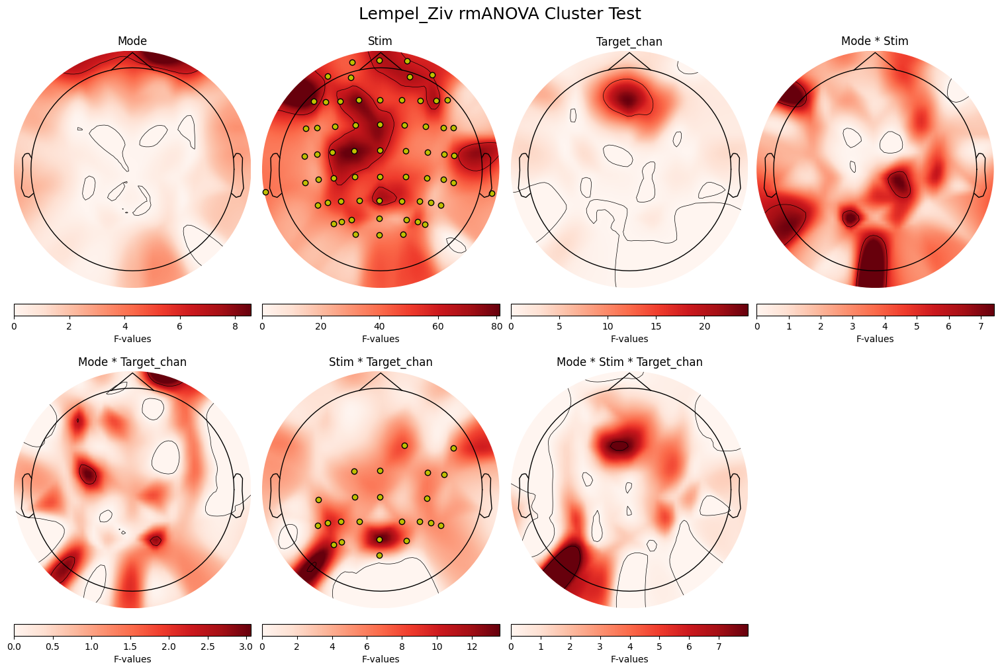

In [35]:
res = cluster_stats_rm_anova_3_factors(df_lziv, target='Lempel_Ziv', test='Cluster', factors=['Mode', 'Stim','Target_chan'])

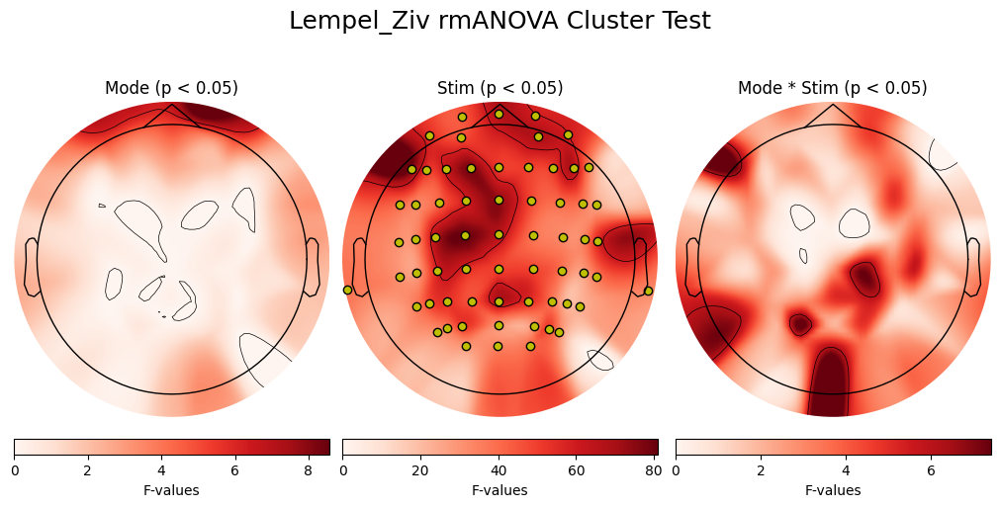

In [36]:
res = cluster_stats_rm_anova(df_lziv, target='Lempel_Ziv', test='Cluster', factors=['Mode', 'Stim', 'Mode * Stim'])

In [37]:
# RM-ANOVA
df_lziv.rm_anova(dv='Lempel_Ziv', within=['Mode', 'Stim'], subject='Subject', detailed=True)

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,Mode,0.001108,1,15,0.001108,1.401277,0.254930,0.254930,0.022556,1.0
1,Stim,0.005594,1,15,0.005594,59.770763,0.000001,0.000001,0.104326,1.0
2,Mode * Stim,0.000347,1,15,0.000347,2.810499,0.114361,0.114361,0.007171,1.0


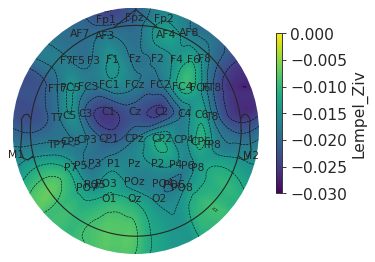

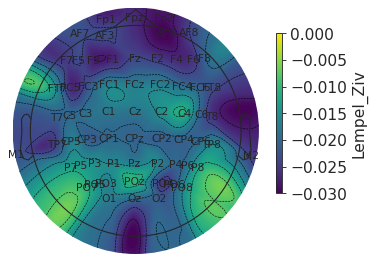

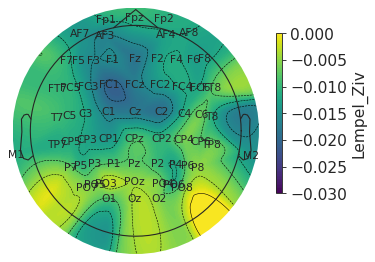

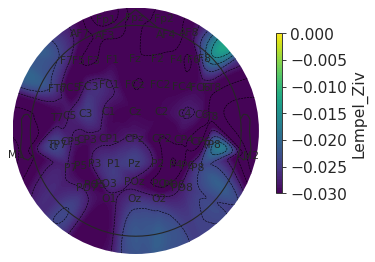

In [38]:
p1 = yasa.topoplot(df_lziv.groupby(['Mode','Stim','Target_chan','Chan']).mean(numeric_only=True).loc['nmes', 'stim', 'C3'].Lempel_Ziv - 
                   df_lziv.groupby(['Mode','Stim','Target_chan','Chan']).mean(numeric_only=True).loc['nmes', 'sham', 'C3'].Lempel_Ziv, 
                   cmap='viridis', vmin=-0.03, vmax=0)
p2 = yasa.topoplot(df_lziv.groupby(['Mode','Stim','Target_chan','Chan']).mean(numeric_only=True).loc['pn', 'stim','Fz'].Lempel_Ziv - 
                   df_lziv.groupby(['Mode','Stim','Target_chan','Chan']).mean(numeric_only=True).loc['pn', 'sham','Fz'].Lempel_Ziv, 
                   cmap='viridis', vmin=-0.03, vmax=0)
p3 = yasa.topoplot(df_lziv.groupby(['Mode','Stim','Target_chan','Chan']).mean(numeric_only=True).loc['nmes', 'stim', 'Fz'].Lempel_Ziv - 
                   df_lziv.groupby(['Mode','Stim','Target_chan','Chan']).mean(numeric_only=True).loc['nmes', 'sham', 'Fz'].Lempel_Ziv, 
                   cmap='viridis', vmin=-0.03, vmax=0)
p4 = yasa.topoplot(df_lziv.groupby(['Mode','Stim','Target_chan','Chan']).mean(numeric_only=True).loc['pn', 'stim', 'C3'].Lempel_Ziv - 
                   df_lziv.groupby(['Mode','Stim','Target_chan','Chan']).mean(numeric_only=True).loc['pn', 'sham', 'C3'].Lempel_Ziv, 
                   cmap='viridis', vmin=-0.03, vmax=0)

### E. SO-Spindle Coupling (ndPAC)

In [39]:
# Load data
df_ndpac = pd.read_csv(os.path.join(stats_path, 'df_ndpac.csv'), index_col=0)
df_ndpac = drop_bads_df(df_ndpac)
df_ndpac = df_ndpac[df_ndpac.Session=='Post'].reset_index(drop=True)

In [40]:
def ndPAC_stats(df, session='Post'):
    # Filter the data to include only post-session measurements
    df_post = df[df['Session'] == session]
    
    for mode in df_post.Mode.unique():
        # Separate data by Target_Chan and Stim type
        c3_stim = df_post[(df_post['Target_Chan'] == 'c3') & (df_post['Stim'] == 'stim') & (df_post['Mode'] == mode)]
        c3_sham = df_post[(df_post['Target_Chan'] == 'c3') & (df_post['Stim'] == 'sham') & (df_post['Mode'] == mode)]
        fz_stim = df_post[(df_post['Target_Chan'] == 'fz') & (df_post['Stim'] == 'stim') & (df_post['Mode'] == mode)]
        fz_sham = df_post[(df_post['Target_Chan'] == 'fz') & (df_post['Stim'] == 'sham') & (df_post['Mode'] == mode)]
    
        # prepare adjacency matrix, must load non-csd mne epochs info
        adj_epochs = mne.read_epochs('/media/administrator/Sleep_Data/Processed/Sleep/Intermediate/LuPf_1_1-epo.fif')
        adjacency, ch_names = mne.channels.find_ch_adjacency(adj_epochs.info, 'eeg')
        
        # Calculate the contrasts (stim - sham)
        c3_stim_ = c3_stim.groupby(['Subject','Chan']).mean(numeric_only=True).ndPAC.unstack().reindex(columns=ch_names).to_numpy() 
        c3_sham_ = c3_sham.groupby(['Subject','Chan']).mean(numeric_only=True).ndPAC.unstack().reindex(columns=ch_names).to_numpy()
        #contrast_c3 = ((c3_stim_ - c3_sham_)/(c3_sham_))*100
        contrast_c3 = c3_stim_ - c3_sham_
        fz_stim_ = fz_stim.groupby(['Subject','Chan']).mean(numeric_only=True).ndPAC.unstack().reindex(columns=ch_names).to_numpy()
        fz_sham_ = fz_sham.groupby(['Subject','Chan']).mean(numeric_only=True).ndPAC.unstack().reindex(columns=ch_names).to_numpy()
        #contrast_fz = ((fz_stim_ - fz_sham_)/(fz_sham_))*100
        contrast_fz = fz_stim_ - fz_sham_

        
        # Plot both contrasts
        for con, target in zip([contrast_c3, contrast_fz], ['C3', 'Fz']):

            # Cluster test 
            # spatial permuation cluster test
            pval = 0.05 
            dof = con.shape[0] - 1  # degrees of freedom for the test
            thresh = scipy.stats.t.ppf(1 - pval / 2, dof)  # two-tailed, t distribution

            t_obs, clusters, cluster_p_values, h0 = mne.stats.permutation_cluster_1samp_test(
                con,                                # numpy array for contrast [n_subjects, n_voltage, n_channels]
                n_permutations=1024,                # 1000 is the minimum
                threshold=thresh, 
                tail=0,                             # two-tailed test (1 or -1 for one-tailed)
                n_jobs=-1,                          # increase value to speed up computations
                adjacency=adjacency,                # sparse matrix for channel adjacency as computed above
                buffer_size=None,
                out_type='mask',                    # returns a mask map instead of indices of sig. points
                seed=1503
            )
            
            df_stats = pd.DataFrame({'Chan': ch_names,
                                    'T-Stat': t_obs, 
                                    'Pval': clusters[cluster_p_values.argmin()],
                                    #'Pval': cluster_p_values,
                                    })
            df_stats = df_stats.set_index("Chan")
            df_stats['Sig'] = (df_stats['Pval'] >= 0.05)

            #plot = yasa.topoplot(df_stats['T-Stat'], mask=df_stats['Sig'], contours=0)    
            #print(cluster_p_values.min())
            #plt.show()
            
            if all(cluster_p_values > 0.05):
                fig, axes = plt.subplots(1, 1, figsize=(5, 5), layout="constrained")
                im, cn = mne.viz.plot_topomap(df_stats['T-Stat'], 
                                            pos=adj_epochs.info, 
                                            contours=0,
                                            mask=None,
                                            mask_params=dict(markersize=6, markerfacecolor='y'),
                                            sensors=False, 
                                            axes=axes, 
                                            show=False, names=None)
            else:
                fig, axes = plt.subplots(1, 1, figsize=(5, 5), layout="constrained")
                im, cn = mne.viz.plot_topomap(df_stats['T-Stat'], 
                            pos=adj_epochs.info, 
                            contours=0,
                            mask=df_stats['Sig'],
                            mask_params=dict(markersize=6, markerfacecolor='y'),
                            sensors=False, 
                            axes=axes, 
                            show=False, names=None)
            cbar = plt.colorbar(axes.images[-1], ax=axes, orientation="horizontal")
            cbar.set_label("T-values")
            fig.suptitle(f"ndPAC Cluster Test ({mode.upper()} - {target})", fontsize=18)

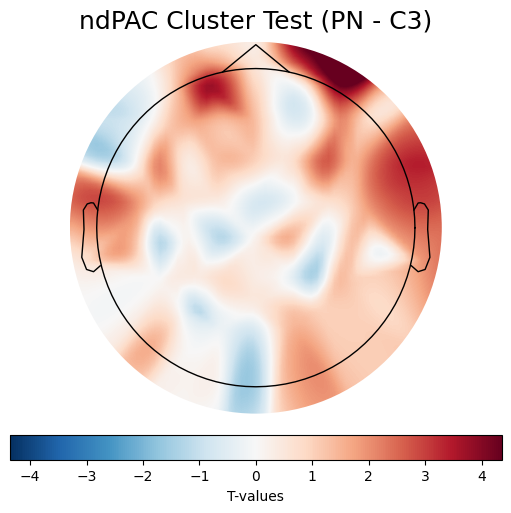

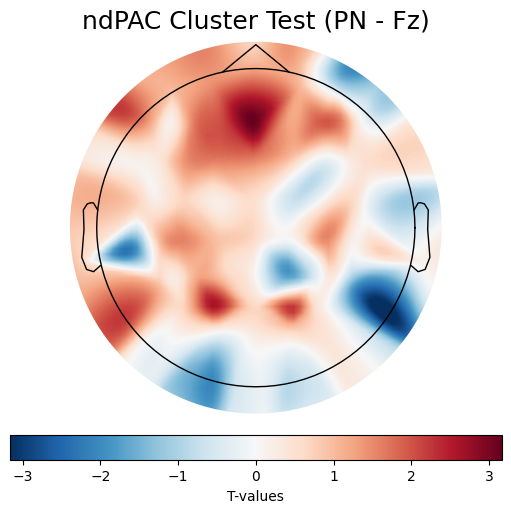

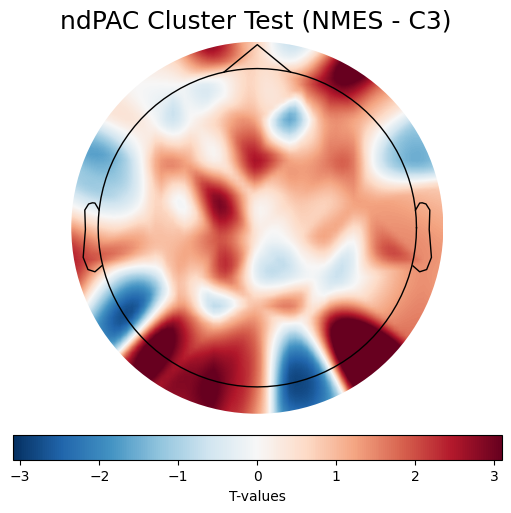

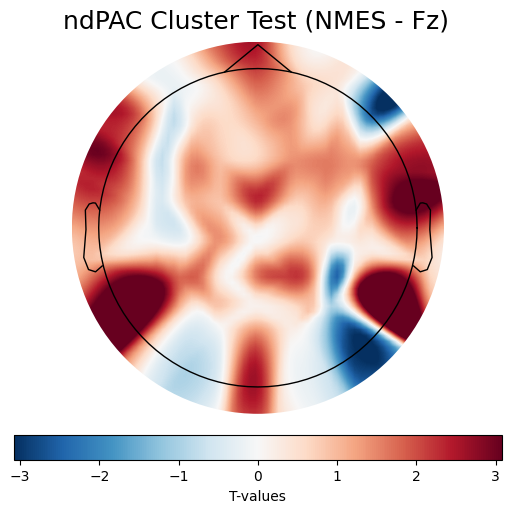

In [41]:
ndPAC_stats(df_ndpac, session='Post')

Mode  Stim
nmes  sham    0.270874
      stim    0.275307
pn    sham    0.266065
      stim    0.271368
Name: ndPAC, dtype: float64

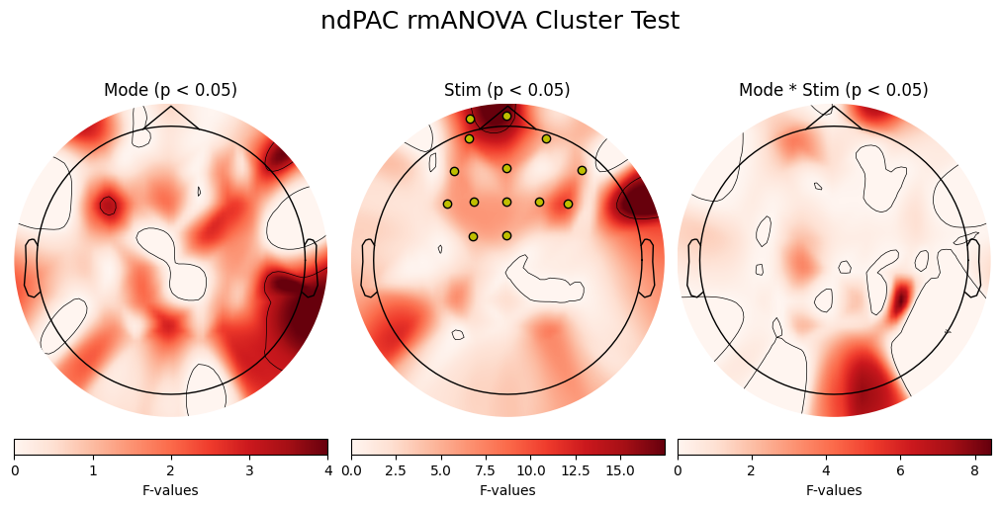

In [42]:
# ndPAC stats
#res = cluster_stats_rm_anova(df_ndpac[df_ndpac.Target_Chan=='c3'], target='ndPAC', test='Cluster', factors=['Mode','Stim','Mode * Stim'])
#res = cluster_stats_rm_anova(df_ndpac[df_ndpac.Target_Chan=='fz'], target='ndPAC', test='Cluster', factors=['Mode','Stim','Mode * Stim'])
res = cluster_stats_rm_anova(df_ndpac, target='ndPAC', test='Cluster', factors=['Mode','Stim','Mode * Stim'])
df_ndpac.groupby(['Mode','Stim']).mean(numeric_only=True).ndPAC
#res = cluster_stats_rm_anova(df_ndpac, target='PhaseAtSigmaPeak', test='Cluster')

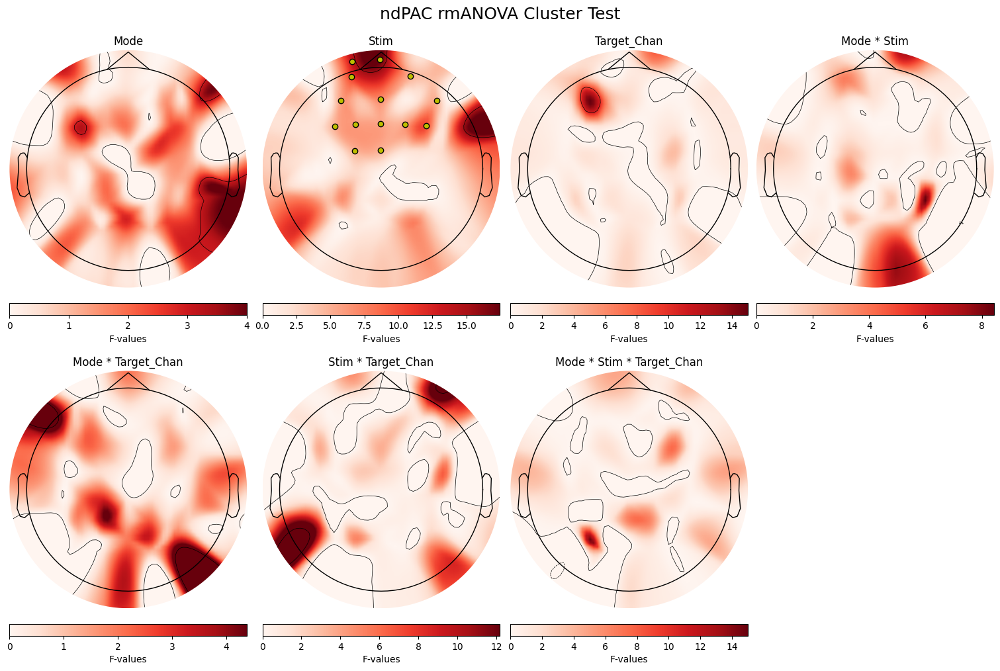

In [43]:
cluster_stats_rm_anova_3_factors(df_ndpac, target='ndPAC', test='Cluster', factors=['Mode', 'Stim', 'Target_Chan'])

### F. SO-Spindle Coupling (ergPAC)

### G. Time reversed multivariate Granger causality


In [27]:
# Load data
df_gc = pd.read_csv(os.path.join(stats_path, 'df_gc.csv'), index_col=0)
df_gc = drop_bads_df(df_gc)

<Axes: xlabel='Freqs', ylabel='Net_GC'>

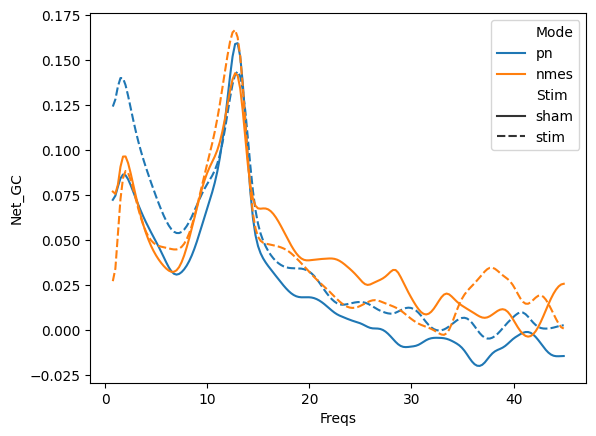

In [28]:
sns.lineplot(df_gc, x='Freqs', y='Net_GC', hue='Mode', style='Stim', errorbar=None)

## 2. Sleep Macroarchitecture Analysis 

### A. Sleep Statistics 

### B. Transition Probabilities

## 3. Sleep Microarchitecture Analysis

### A. Power Spectral Analysis

### B. SO/Spindle Coupling

### C. Slow Waves Statistics

In [7]:
# Load slow wave and spindle data
df_sw = pd.read_csv(os.path.join(stats_path, 'df_sw.csv'), index_col=0)
df_sw = drop_bads_df(df_sw)
df_sw.rename(columns={'Channel':'Chan'}, inplace=True) 
df_sw

,Stage,Chan,Subject,Night,Mode,75_Thresh,Count,Density,Duration,ValNegPeak,ValPosPeak,PTP,Slope,Frequency,PhaseAtSigmaPeak,ndPAC,CooccurringSpindle,DistanceSpindleToSW
0,2,AF3,TiKl,1,pn,25,1195,5.141628,1.183349,-20.463985,17.264983,37.728968,149.723277,0.894241,-1.258231,0.292286,0.082845,-0.264836
1,2,AF4,TiKl,1,pn,25,1083,4.659735,1.216701,-23.492278,17.221387,40.713665,156.299211,0.867292,0.137238,0.299891,0.103416,-0.030413
2,2,AF7,TiKl,1,pn,25,1333,5.735389,1.052654,-18.816955,17.286193,36.103148,151.330629,0.978870,-1.718457,0.282493,0.037509,-0.402656
3,2,AF8,TiKl,1,pn,25,915,3.936895,1.251316,-23.638008,16.973532,40.611540,151.770507,0.846026,0.041800,0.298936,0.102732,-0.173371
4,2,C1,TiKl,1,pn,25,786,3.381857,1.263797,-18.421126,17.859795,36.280921,148.170186,0.844106,0.310257,0.304297,0.156489,-0.134591
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4985,3,Pz,JaGr,1,pn,25,1379,29.392540,1.134687,-26.250416,24.712288,50.962704,211.806465,0.933772,-0.735269,0.296975,0.019579,-0.010417
4986,3,T7,JaGr,1,pn,25,884,18.841918,1.216080,-23.130143,20.503936,43.634078,167.880420,0.865796,1.563965,0.282929,0.002262,0.601562
4987,3,T8,JaGr,1,pn,25,530,11.296625,1.225133,-18.431040,16.457456,34.888496,134.913149,0.852863,-2.189729,0.273347,0.009434,0.381250
4988,3,TP7,JaGr,1,pn,25,807,17.200710,1.191624,-21.697136,19.161212,40.858348,159.196743,0.885702,-0.764126,0.290721,0.003717,0.523438


In [8]:
def group_microarchiteture_stats(df_sw, stage=2, feature='ndPAC'):

    df_sw = df_sw.groupby('Subject').filter(lambda x: set(x['Mode']) >= {'pn', 'nmes'})
    df_sw = df_sw[df_sw.Stage==stage]
    
    df_nmes = df_sw[(df_sw.Mode == 'nmes')]
    df_nmes = df_nmes.fillna(1)
    df_pn = df_sw[(df_sw.Mode == 'pn')]
    df_pn = df_pn.fillna(1)
    
    unique_channels = df_nmes['Chan'].unique()
    
    # if feature == 'Aperiodic' or feature == 'Offset':
    contrast = (
        df_nmes.pivot_table(index='Subject', 
                            columns='Chan', 
                            values=feature, 
                            aggfunc='mean').reindex(columns=unique_channels, level=1).values  
        -                    
        df_pn.pivot_table(index='Subject', 
                            columns='Chan',
                            values=feature, 
                            aggfunc='mean').reindex(columns=unique_channels, level=1).values
    ) 
    
    contrast[1, 17] = 0
                                                                              
    # Adjacency matrix
    adj_epochs = mne.read_epochs('/media/administrator/Sleep_Data/Processed/Sleep/Intermediate/LuPf_1_1-epo.fif')
    adjacency, ch_names = mne.channels.find_ch_adjacency(adj_epochs.info, 'eeg')
    
    # Permutation Test
    pval = 0.05
    dof = contrast.shape[0] - 1  # degrees of freedom for the test
    if all(np.sign(contrast.mean(0)) == -1.0):
        cmap = 'Blues'
        #tail = -1
        #thresh = scipy.stats.t.ppf(pval, dof)  # One-tailed test (left tail)
    elif any(np.sign(contrast.mean(0)) == -1.0):
        cmap = 'RdBu_r'
        #tail = 0
        #thresh = scipy.stats.t.ppf(1 - pval / 2, dof)  # two-tailed, t distribution
    else:
        cmap = 'Reds'
        #tail = 1
        #thresh = scipy.stats.t.ppf(1 - pval, dof)

    tail = 0
    thresh = scipy.stats.t.ppf(1 - pval / 2, dof)  
        
    t_obs, clusters, cluster_p_values, h0 = mne.stats.permutation_cluster_1samp_test(
        contrast,                            # numpy array for contrast [n_subjects, n_channels]
        n_permutations=1024,                 # 1000 is the minimum
        threshold=2,                    # threshold for cluster formation
        tail=tail,                           # 0 for two-tailed test (1 or -1 for one-tailed)
        n_jobs=-1,                           # increase value to speed up computations
        adjacency=adjacency,                 # sparse matrix for channel adjacency as computed above
        buffer_size=None,
        out_type='mask',                     # returns a mask map instead of indices of sig. points
        seed=1503
    )
    
    # Get significant clusters
    if all(p > 0.05 for p in cluster_p_values):
        print(f'No significant clusters found for {feature} -> {tail} tail Permutation Test')
        df_stats = pd.DataFrame({'Chan': ch_names, 
                                 'Power': contrast.mean(0).squeeze(), 
                                 'T-Stat': t_obs.squeeze(),
                                 'Null' : [False] * len(ch_names),
                                 'Sig': [False] * len(ch_names)})
    else:
        min_p_value = min(cluster_p_values)
        print(f"P-Value: {min_p_value} for {feature} -> {tail} tail Permutation Test")
        df_stats = pd.DataFrame({'Chan': ch_names, 
                                 'Power': contrast.mean(0).squeeze(), 
                                 'T-Stat': t_obs.squeeze(), 
                                 'Null' : [False] * len(ch_names),
                                 'Sig': clusters[np.argmin(cluster_p_values)]})
    
    # Set channel as index
    df_stats = df_stats.set_index("Chan")
    
    # Plot feature and stats
    fig, ax = plt.subplots(1, 2, figsize=(8, 4))
    
    if feature == 'Aperiodic':
        unit = '\u0394' + ' Spectral Exponent' 
    else:
        unit = '\u0394' + f' {feature}'
    
    # Plot topomaps
    topoplot(df_stats['Power'], 
             mask=df_stats['Null'], 
             cmap=cmap,
             names=None,
             axes=ax[0],
             cbar_title=unit,
            )
    
    topoplot(df_stats['T-Stat'], 
             mask=df_stats['Sig'], 
             cmap=cmap,
             names=None,
             axes=ax[1],
             mask_params=dict(markersize=6, markerfacecolor='y'), 
             )
    
    if stage == 2:
        fig.suptitle(f'NREM2 {unit} (CLNMES - CLAS)', fontsize=18)
    else:
        fig.suptitle(f'SWS {unit} (CLNMES - CLAS)', fontsize=18)
        
    plt.tight_layout()
    plt.show()

No significant clusters found for Density -> 0 tail Permutation Test


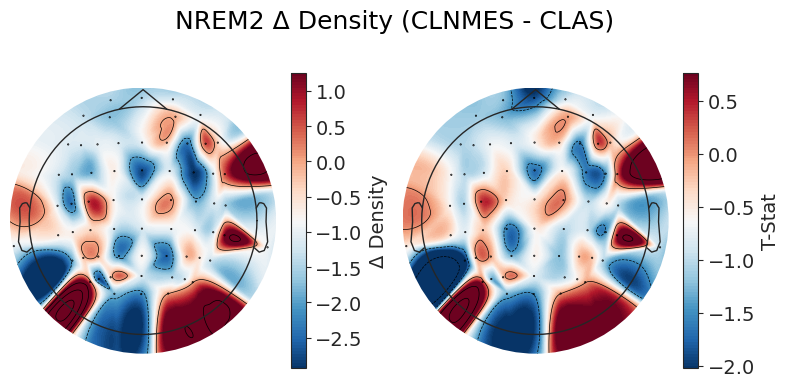

In [ ]:
group_microarchiteture_stats(df_sw, stage=2, feature='ndPAC')

In [ ]:
# res = cluster_stats_rm_anova(df_sw, target='ndPAC', test='Cluster', factors=['Mode', 'Stage', 'Mode * Stage'])
# df_sw.groupby(['Mode','Stage']).median(numeric_only=True).ndPAC

NameError: name 'cluster_stats_rm_anova' is not defined

Mode  Stage
nmes  2         2.969555
      3        16.653061
pn    2         3.971936
      3        15.653229
Name: Density, dtype: float64

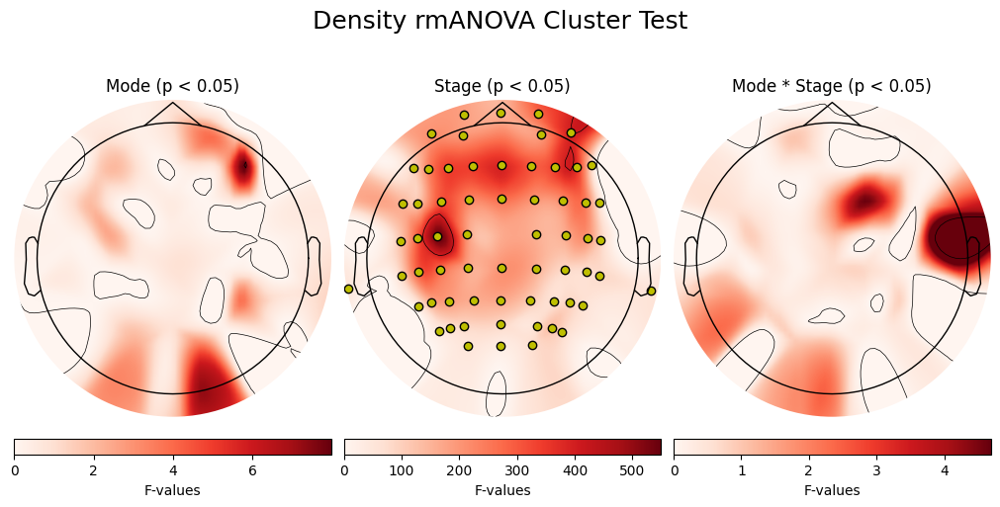

In [ ]:
res = cluster_stats_rm_anova(df_sw, target='Density', test='Cluster', factors=['Mode','Stage', 'Mode * Stage'])
df_sw.groupby(['Mode','Stage']).median(numeric_only=True).Density

Mode  Stage
nmes  2        0.080000
      3        0.006670
pn    2        0.075758
      3        0.007861
Name: CooccurringSpindle, dtype: float64

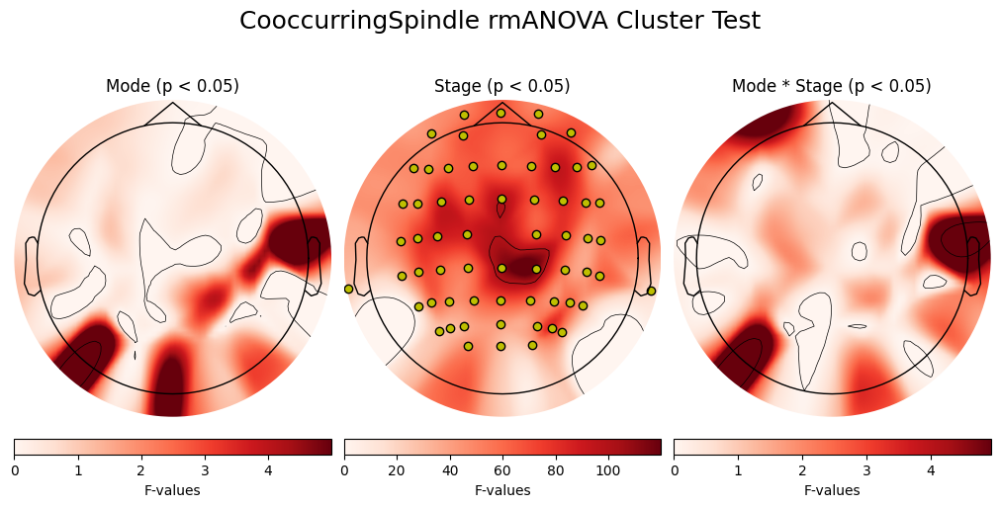

In [ ]:
res = cluster_stats_rm_anova(df_sw, target='CooccurringSpindle', test='Cluster', factors=['Mode','Stage', 'Mode * Stage'])
df_sw.groupby(['Mode','Stage']).median(numeric_only=True).CooccurringSpindle

Mode  Stage
nmes  2        0.862846
      3        0.887668
pn    2        0.866724
      3        0.874720
Name: Frequency, dtype: float64

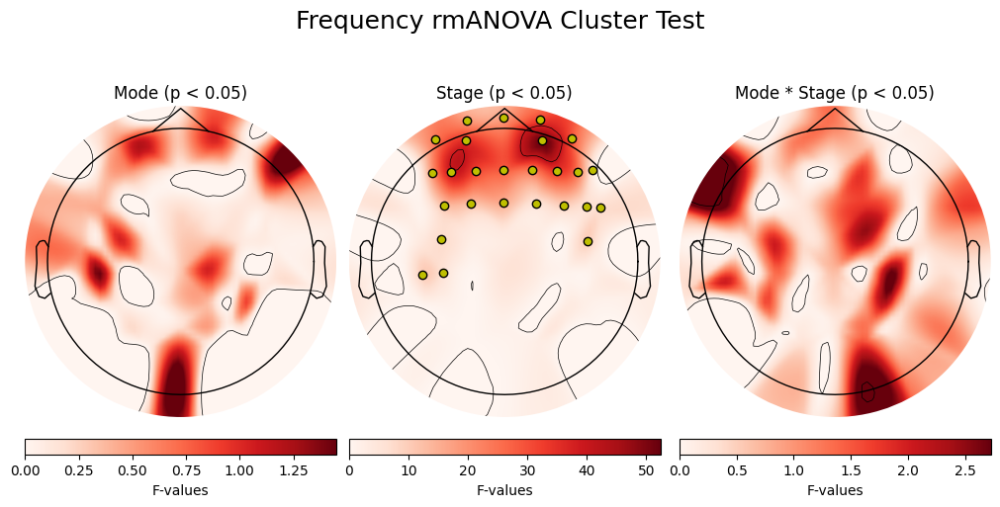

In [ ]:
res = cluster_stats_rm_anova(df_sw, target='Frequency', test='Cluster', factors=['Mode','Stage', 'Mode * Stage'])
df_sw.groupby(['Mode','Stage']).median(numeric_only=True).Frequency

Mode  Stage
nmes  2        37.721515
      3        40.982421
pn    2        40.057473
      3        42.474700
Name: PTP, dtype: float64

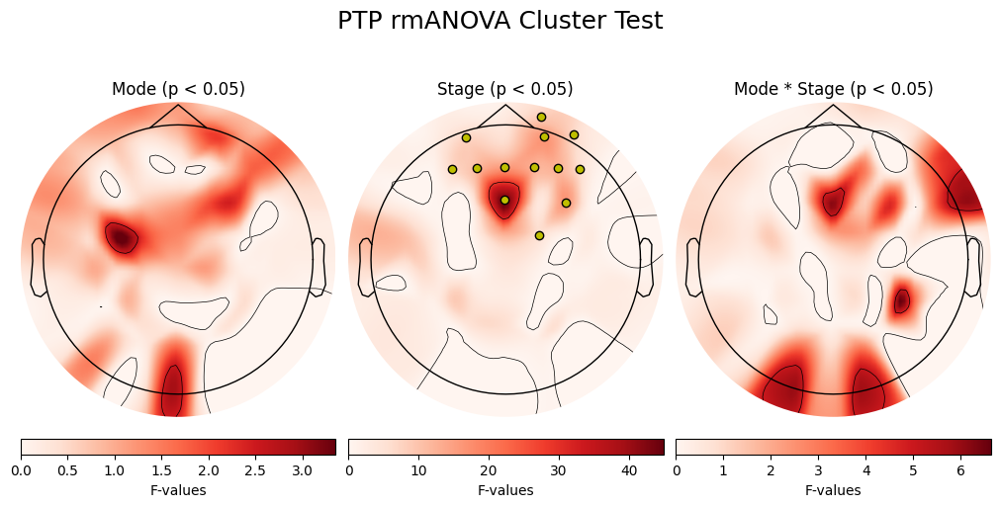

In [ ]:
res = cluster_stats_rm_anova(df_sw, target='PTP', test='Cluster', factors=['Mode','Stage', 'Mode * Stage'])
df_sw.groupby(['Mode','Stage']).median(numeric_only=True).PTP

### D. Spindle Statistics

In [ ]:
# Load spindle data
df_sp = pd.read_csv(os.path.join(stats_path, 'df_spindles.csv'), index_col=0)
df_sp = drop_bads_df(df_sp)
df_sp.rename(columns={'Channel':'Chan'}, inplace=True)
df_sp

,Stage,Chan,Subject,Night,Mode,Count,Density,Duration,Amplitude,RMS,AbsPower,RelPower,Frequency,Oscillations,Symmetry
0,2,AF3,TiKl,1,pn,1140,4.904984,0.888322,24.498359,5.335010,1.196386,0.242258,12.737617,10.571053,0.513917
1,2,AF4,TiKl,1,pn,963,4.143421,0.886853,26.647217,5.828579,1.260503,0.221809,12.620962,10.460021,0.506875
2,2,AF7,TiKl,1,pn,1140,4.904984,0.907860,20.259543,4.385413,1.026542,0.236535,12.533664,10.652632,0.511520
3,2,AF8,TiKl,1,pn,1064,4.577985,0.904106,23.735439,5.184114,1.173218,0.221514,12.484680,10.606203,0.519589
4,2,C1,TiKl,1,pn,1314,5.653639,0.874738,27.780977,6.070774,1.305117,0.251984,13.682284,10.696347,0.479432
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4651,3,Pz,JaGr,1,pn,35,0.746004,1.131027,283.378840,56.149721,2.959428,0.134318,13.671209,12.628571,0.502714
4652,3,T7,JaGr,1,pn,24,0.511545,0.797852,35.545689,7.352394,1.309717,0.134250,13.844828,9.291667,0.473463
4653,3,T8,JaGr,1,pn,36,0.767318,0.814236,35.272721,7.424703,1.248793,0.133253,13.701867,9.361111,0.503632
4654,3,TP7,JaGr,1,pn,35,0.746004,0.908036,41.725058,8.567326,1.402996,0.148854,13.811708,10.742857,0.506933


In [ ]:
# Drop subject DoGi
df_sp = df_sp[df_sp.Subject != 'DoGi']

/tmp/ipykernel_1537794/1804699895.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  nmes_sp = yasa.topoplot(df_sp[df_sp.Stage==2].groupby(['Mode','Chan']).mean().Density.loc['nmes'] -
/tmp/ipykernel_1537794/1804699895.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_sp[df_sp.Stage==2].groupby(['Mode','Chan']).mean().Density.loc['pn'])


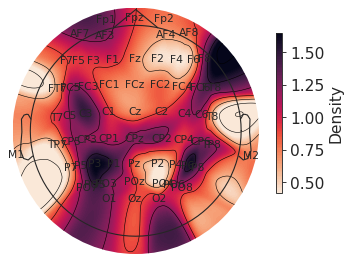

In [ ]:
nmes_sp = yasa.topoplot(df_sp[df_sp.Stage==2].groupby(['Mode','Chan']).mean().Density.loc['nmes'] -
                        df_sp[df_sp.Stage==2].groupby(['Mode','Chan']).mean().Density.loc['pn'])

In [ ]:
def one_sample_cluster_test(df_ndpac, target='Density', test='Cluster', factor='Mode'):
    # Gather unique levels for the factor
    levels = df_ndpac[factor].unique()
    num_levels = len(levels)

    if num_levels != 2:
        raise ValueError("This function is designed to compare exactly two levels of the factor.")
    
    # Initialize a structure to hold contrasts for each level of the factor
    contrasts = {}

    # Gather subjects present in all levels
    common_subjects = None

    for level in levels:
        df_subset = df_ndpac[df_ndpac[factor] == level]
        grouped = df_subset.groupby(['Subject', 'Chan']).mean(numeric_only=True)[target].unstack()[list(df_ndpac.Chan.unique())]
        contrasts[level] = grouped
        if common_subjects is None:
            common_subjects = set(grouped.index)
        else:
            common_subjects &= set(grouped.index)

    common_subjects = list(common_subjects)  # Convert to list to ensure consistent indexing
    num_subjects = len(common_subjects)
    num_channels = len(df_ndpac.Chan.unique())

    # Initialize the array with correct dimensions
    data_array = np.zeros((num_levels, num_subjects, num_channels))
    
    # Populate the array
    for i, level in enumerate(contrasts.keys()):
        subset_data = contrasts[level].loc[common_subjects].values
        data_array[i] = subset_data

    # Subtract the two modes
    diff_data = data_array[1] - data_array[0]

    # impute 1 where nan is in the data
    diff_data[np.isnan(diff_data)] = 1

    # threshold for cluster test
    pval = 0.05
    dof = diff_data.shape[0] - 1  # degrees of freedom for the test
    thresh = scipy.stats.t.ppf(1 - pval / 2, dof)  # two-tailed, t distribution

    # adjacency matrix
    Info = mne.create_info(df_ndpac.Chan.unique().tolist(), sfreq=128, ch_types="eeg")
    Info.set_montage(mne.channels.make_standard_montage('standard_1005'), match_case=False, on_missing="ignore")
    adjacency, ch_names = mne.channels.find_ch_adjacency(Info, 'eeg')

    if test == 'Cluster':
        # Perform the permutation cluster test
        T_obs, clusters, cluster_p_values, h0 = mne.stats.permutation_cluster_1samp_test(
            diff_data,
            threshold=thresh,
            adjacency=adjacency,
            tail=0,  # two-tailed test
            n_jobs=-1,
            n_permutations=1024,
            buffer_size=None,
            out_type="mask",
        )
        
        # Plot the results
        plot_one_sample_cluster_results([T_obs], [cluster_p_values], [clusters], [factor], diff_data, df_ndpac)

    else:
        raise ValueError("Currently, only 'Cluster' test is supported for one-sample test")

def plot_one_sample_cluster_results(fvals, pvals, clusters_all, effect_labels, diff_data, df_ndpac):
    Info = mne.create_info(df_ndpac.Chan.unique().tolist(), sfreq=128, ch_types="eeg")
    Info.set_montage(mne.channels.make_standard_montage('standard_1005'), match_case=False, on_missing="ignore")
    
    fig, axes = plt.subplots(1, 1, sharey=True)
    ax = axes
    fval, pval, clusters, effect_label = fvals[0], pvals[0], clusters_all[0], effect_labels[0]
    
    if len(pval) == 0 or all(pval > 0.05):
        im, cn = mne.viz.plot_topomap(fval.squeeze(), 
                                      pos=Info, 
                                      contours=1,
                                      mask=None,
                                      mask_params=dict(markersize=6, markerfacecolor='y'),
                                      sensors=False, 
                                      axes=ax, 
                                      show=False,
                                      names=None, 
                                      )
    else:
        im, cn = mne.viz.plot_topomap(fval.squeeze(), 
                                      pos=Info, 
                                      contours=1,
                                      mask=clusters[pval.argmin()].squeeze(),
                                      mask_params=dict(markersize=6, markerfacecolor='y'),
                                      sensors=False, 
                                      axes=ax, 
                                      show=False,
                                      names=None, 
                                      )
    ax.set_title(f"{effect_label} (p < 0.05)")
    # Add a colorbar
    cbar = plt.colorbar(ax.images[-1], ax=ax, orientation="vertical")
    cbar.set_label("T-values")
    fig.suptitle(f'Cluster Test', fontsize=18)

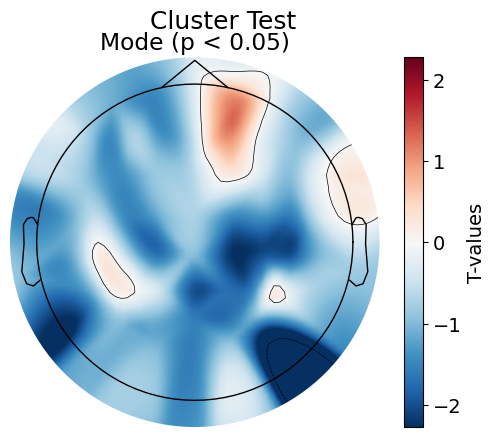

In [ ]:
one_sample_cluster_test(df_sp[df_sp.Stage==2], target='Amplitude', test='Cluster', factor='Mode')

In [ ]:
df_sp_n2 = df_sp[df_sp.Stage==2]
df_sp_n2_nmes = df_sp_n2[df_sp_n2.Mode=='nmes']
df_sp_n2_pn = df_sp_n2[df_sp_n2.Mode=='pn']

In [ ]:
# get mask for sensorimotor cortex
mask = np.zeros(Info['nchan'])
mask[[Info.ch_names.index(ch) for ch in ['C3', 'C4', 'Cz', 'CP3', 'CP4', 'CPz']]] = 1

# get mask for frontal cortex
mask = np.zeros(Info['nchan'])


In [ ]:
pg.ttest(x = df_sp_n2_nmes[df_sp_n2_nmes.Chan=='C3'].dropna().Density, 
         y = df_sp_n2_pn[df_sp_n2_pn.Chan=='C3'].dropna().Density,
         paired=False)

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.859623,31.942011,two-sided,0.072171,"[-0.14, 3.1]",0.635909,1.213,0.434643


## 4. Sleep Heart Rate Variability Analysis

In [ ]:
df_hrv = pd.read_csv(stats_path + 'df_sleep_hrv.csv', index_col=0)
df_hrv = drop_bads_df(df_hrv)

In [ ]:
# functions
def group_aperiodic_stats(df_power, stage=2, feature='Theta'):

    df_power = df_power.groupby('Subject').filter(lambda x: set(x['Mode']) >= {'pn', 'nmes'})
    df_power = df_power[df_power.Stage==stage]
    
    df_nmes = df_power[(df_power.Mode == 'nmes')]
    df_pn = df_power[(df_power.Mode == 'pn')]
    
    unique_channels = df_nmes['Channel'].unique()
    
    # if feature == 'Aperiodic' or feature == 'Offset':
    contrast = (
        df_nmes.pivot_table(index='Subject', 
                            columns='Channel', 
                            values=feature, 
                            aggfunc='mean').reindex(columns=unique_channels, level=1).values  
        -                    
        df_pn.pivot_table(index='Subject', 
                            columns='Channel',
                            values=feature, 
                            aggfunc='mean').reindex(columns=unique_channels, level=1).values
    )
    # else: 
    #     contrast = (
    #         scipy.stats.zscore(df_nmes.pivot_table(index='Subject', 
    #                            columns='Channel', 
    #                            values=feature, 
    #                            aggfunc='mean').reindex(columns=unique_channels, level=1).values, -1)  
    #         -                    
    #         scipy.stats.zscore(df_pn.pivot_table(index='Subject', 
    #                            columns='Channel',
    #                            values=feature, 
    #                            aggfunc='mean').reindex(columns=unique_channels, level=1).values, -1)
    #     )
        
                                                        
    # Adjacency matrix
    adj_epochs = mne.read_epochs('/media/administrator/Sleep_Data/Processed/Sleep/Intermediate/LuPf_1_1-epo.fif')
    adjacency, ch_names = mne.channels.find_ch_adjacency(adj_epochs.info, 'eeg')
    
    # Permutation Test
    pval = 0.05
    dof = contrast.shape[0] - 1  # degrees of freedom for the test
    if all(np.sign(contrast.mean(0)) == -1.0):
        cmap = 'Blues'
        #tail = -1
        #thresh = scipy.stats.t.ppf(pval, dof)  # One-tailed test (left tail)
    elif any(np.sign(contrast.mean(0)) == -1.0):
        cmap = 'RdBu_r'
        #tail = 0
        #thresh = scipy.stats.t.ppf(1 - pval / 2, dof)  # two-tailed, t distribution
    else:
        cmap = 'Reds'
        #tail = 1
        #thresh = scipy.stats.t.ppf(1 - pval, dof)

    tail = 0
    thresh = scipy.stats.t.ppf(1 - pval / 2, dof)  
        
    t_obs, clusters, cluster_p_values, h0 = mne.stats.permutation_cluster_1samp_test(
        contrast,                            # numpy array for contrast [n_subjects, n_channels]
        n_permutations=1024,                 # 1000 is the minimum
        threshold=thresh,                    # threshold for cluster formation
        tail=tail,                           # 0 for two-tailed test (1 or -1 for one-tailed)
        n_jobs=-1,                           # increase value to speed up computations
        adjacency=adjacency,                 # sparse matrix for channel adjacency as computed above
        buffer_size=None,
        out_type='mask',                     # returns a mask map instead of indices of sig. points
        seed=1503
    )
    
    # Get significant clusters
    if all(p > 0.05 for p in cluster_p_values):
        print(f'No significant clusters found for {feature} -> {tail} tail Permutation Test')
        df_stats = pd.DataFrame({'Chan': ch_names, 
                                 'Power': contrast.mean(0).squeeze(), 
                                 'T-Stat': t_obs.squeeze(),
                                 'Null' : [False] * len(ch_names),
                                 'Sig': [False] * len(ch_names)})
    else:
        min_p_value = min(cluster_p_values)
        print(f"P-Value: {min_p_value} for {feature} -> {tail} tail Permutation Test")
        df_stats = pd.DataFrame({'Chan': ch_names, 
                                 'Power': contrast.mean(0).squeeze(), 
                                 'T-Stat': t_obs.squeeze(), 
                                 'Null' : [False] * len(ch_names),
                                 'Sig': clusters[np.argmin(cluster_p_values)]})
    
    # Set channel as index
    df_stats = df_stats.set_index("Chan")
    
    # Plot feature and stats
    fig, ax = plt.subplots(1, 2, figsize=(8, 4))
    
    if feature == 'Aperiodic':
        unit = '\u0394' + ' Spectral Exponent' 
    else:
        unit = '\u0394' + f' {feature}'
    
    # Plot topomaps
    topoplot(df_stats['Power'], 
             mask=df_stats['Null'], 
             cmap=cmap,
             names=None,
             axes=ax[0],
             cbar_title=unit,
            )
    
    topoplot(df_stats['T-Stat'], 
             mask=df_stats['Sig'], 
             cmap=cmap,
             names=None,
             axes=ax[1],
             mask_params=dict(markersize=6, markerfacecolor='y'), 
             )
    
    if stage == 2:
        fig.suptitle(f'NREM {unit} (CLNMES - CLAS)', fontsize=18)
    else:
        fig.suptitle(f'REM {unit} (CLNMES - CLAS)', fontsize=18)
        
    plt.tight_layout()
    plt.show()

No significant clusters found for Delta -> 0 tail Permutation Test


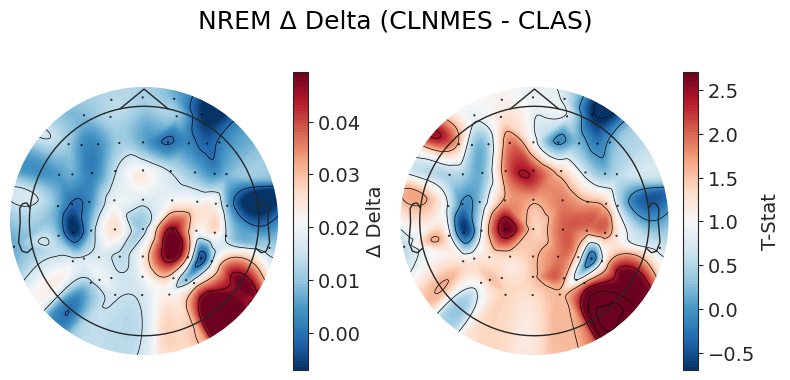

In [ ]:
group_aperiodic_stats(df_hrv, stage=2, feature='Delta')

No significant clusters found for Sigma -> 0 tail Permutation Test


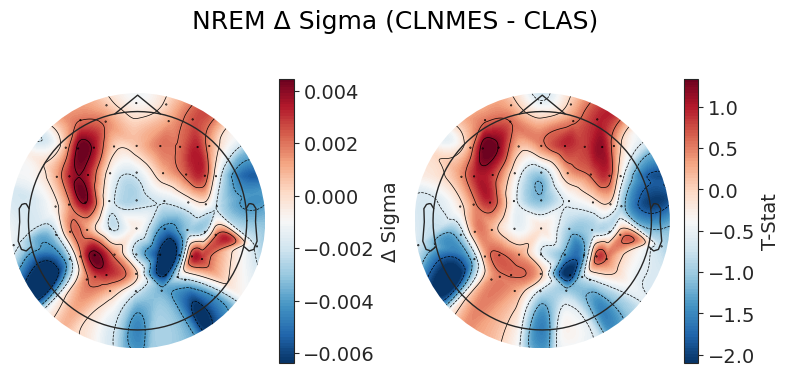

In [ ]:
group_aperiodic_stats(df_hrv, stage=2, feature='Sigma')

P-Value: 0.0439453125 for Aperiodic -> 0 tail Permutation Test


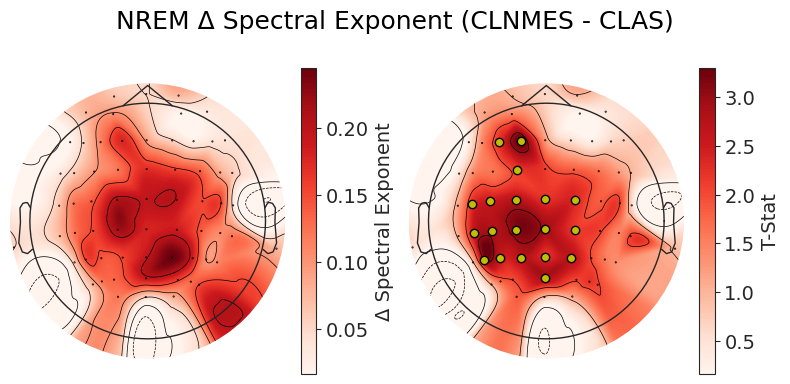

In [ ]:
group_aperiodic_stats(df_hrv, stage=2, feature='Aperiodic')

## 5. Resting State Analysis

### A. Spectral changes overnight

### B. Heart Rate Variability changes overnight